In [34]:
import findspark
findspark.init('/home/ubuntu/spark-2.1.1-bin-hadoop2.7')
import pyspark
from pyspark.sql import SparkSession
spark = SparkSession.builder.appName('Iteration_4_BDAS').getOrCreate()

In [35]:
import pyspark

In [36]:
import pandas as pd
pd.options.display.max_columns=50
import time
from pyspark.mllib.evaluation import MulticlassMetrics, BinaryClassificationMetrics
from pyspark.sql.types import StructType,StructField, StringType, IntegerType, FloatType

In [37]:
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np
from pyspark.sql.types import StringType,BooleanType,DateType
from pyspark.sql import Row
from pyspark.ml.feature import StringIndexer, VectorAssembler, VectorSlicer, MinMaxScaler, StandardScaler

In [38]:
from pyspark.ml.tuning import CrossValidator, ParamGridBuilder

In [39]:
import pyspark.sql.functions as f
from pyspark.ml.feature import VectorAssembler
import math
from pyspark.sql.window import Window
from pyspark.ml import Pipeline
from pyspark.ml.classification import RandomForestClassifier, LogisticRegression, \
    DecisionTreeClassifier, MultilayerPerceptronClassifier
from pyspark.ml.feature import IndexToString, StringIndexer, VectorIndexer
from pyspark.ml.evaluation import MulticlassClassificationEvaluator, BinaryClassificationEvaluator

In [40]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))
pd.set_option("display.max_rows", None)

In [41]:
df = spark.read.csv('US_Accidents_Dec20.csv',inferSchema=True,header=True)

In [8]:
df = spark.read.csv('US_Accidents_Dec20_Updated_3_sample.csv',inferSchema=True,header=True)

In [11]:
# Print data schema.
df.printSchema()

# Print data columns.
df.columns

root
 |-- ID: string (nullable = true)
 |-- Source: string (nullable = true)
 |-- TMC: double (nullable = true)
 |-- Severity: integer (nullable = true)
 |-- Start_Time: timestamp (nullable = true)
 |-- End_Time: timestamp (nullable = true)
 |-- Start_Lat: double (nullable = true)
 |-- Start_Lng: double (nullable = true)
 |-- End_Lat: double (nullable = true)
 |-- End_Lng: double (nullable = true)
 |-- Distance(mi): double (nullable = true)
 |-- Description: string (nullable = true)
 |-- Number: double (nullable = true)
 |-- Street: string (nullable = true)
 |-- Side: string (nullable = true)
 |-- City: string (nullable = true)
 |-- County: string (nullable = true)
 |-- State: string (nullable = true)
 |-- Zipcode: string (nullable = true)
 |-- Country: string (nullable = true)
 |-- Timezone: string (nullable = true)
 |-- Airport_Code: string (nullable = true)
 |-- Weather_Timestamp: timestamp (nullable = true)
 |-- Temperature(F): double (nullable = true)
 |-- Wind_Chill(F): double (n

['ID',
 'Source',
 'TMC',
 'Severity',
 'Start_Time',
 'End_Time',
 'Start_Lat',
 'Start_Lng',
 'End_Lat',
 'End_Lng',
 'Distance(mi)',
 'Description',
 'Number',
 'Street',
 'Side',
 'City',
 'County',
 'State',
 'Zipcode',
 'Country',
 'Timezone',
 'Airport_Code',
 'Weather_Timestamp',
 'Temperature(F)',
 'Wind_Chill(F)',
 'Humidity(%)',
 'Pressure(in)',
 'Visibility(mi)',
 'Wind_Direction',
 'Wind_Speed(mph)',
 'Precipitation(in)',
 'Weather_Condition',
 'Amenity',
 'Bump',
 'Crossing',
 'Give_Way',
 'Junction',
 'No_Exit',
 'Railway',
 'Roundabout',
 'Station',
 'Stop',
 'Traffic_Calming',
 'Traffic_Signal',
 'Turning_Loop',
 'Sunrise_Sunset',
 'Civil_Twilight',
 'Nautical_Twilight',
 'Astronomical_Twilight']

In [11]:
print("The shape of data is: ({0},{1})".format(df.count(), len(df.columns)))
df.limit(3).toPandas()

The shape of data is: (1099982,77)


,Severity,Start_Lat,Start_Lng,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),Precipitation(in),Amenity,Bump,Crossing,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Sunrise_Sunset,Minute,Clear,...,Timezone_US/Central,Timezone_US/Eastern,Timezone_US/Mountain,Timezone_US/Pacific,Weekday_0,Weekday_1,Weekday_2,Weekday_3,Weekday_4,Weekday_5,Weekday_6,Month_1,Month_2,Month_3,Month_4,Month_5,Month_6,Month_7,Month_8,Month_9,Month_10,Month_11,Month_12,Precipitation_NA,Side
0,0,43.207451,-78.650032,32.0,23.0,64.0,29.56,10.0,13.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,1,647.0,0,...,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,0,43.030651,-78.875862,34.0,27.0,67.0,29.59,10.0,9.0,0.0,0,0,0,0,0,0,0,0,0,0,0,1,1,804.0,0,...,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
2,0,42.550568,-79.108765,37.0,30.0,54.0,29.50,10.0,9.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,1,809.0,0,...,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1


In [ ]:
df_weather = spark.read.csv('US_Weather_Dec20.csv',inferSchema=True,header=True)
print("The shape of data is: ({0},{1})".format(df_weather.count(), len(df_weather.columns)))
df_weather.limit(3).toPandas()

In [42]:
s = df.groupBy('Severity').count().orderBy('Severity')
df_source = s.withColumn("Percentage(%)",f.round(f.col('count')/f.sum('count').over(Window.partitionBy())*100,2))
y, x = df_source.select('Severity').collect(), df_source.select('count').collect()
df_source.show()

+--------+------+-------------+
|Severity| count|Percentage(%)|
+--------+------+-------------+
|       1|  1466|         0.69|
|       2|150331|        71.04|
|       3| 53641|        25.35|
|       4|  6189|         2.92|
+--------+------+-------------+



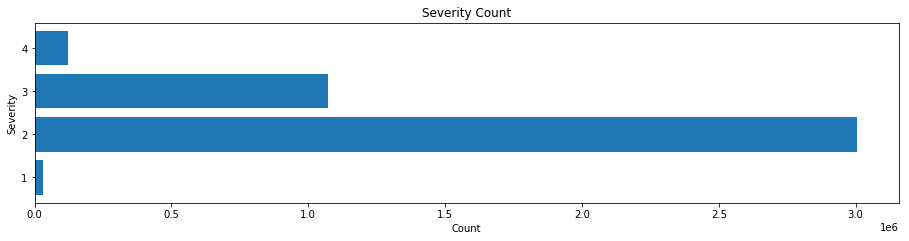

In [99]:
fig = plt.figure(figsize=(12,2.5))
ax = fig.add_axes([0,0,1,1])
ax.barh(np.array(y).flatten(),np.array(x).flatten())
ax.ticklabel_format(axis = 'x', style = 'scientific', scilimits = (0,0))
ax.set_yticks(np.array(y).flatten())
ax.set_ylabel('Severity')
ax.set_xlabel('Count')
ax.set_title('Severity Count')
plt.show()

In [59]:
df_source.show()

+--------+-------+-------------+
|Severity|  count|Percentage(%)|
+--------+-------+-------------+
|       1|  29312|         0.69|
|       3|1072821|        25.35|
|       4| 123782|         2.92|
|       2|3006626|        71.04|
+--------+-------+-------------+



In [10]:
df_lat = df.select('Start_Lat','Severity').groupBy('Severity').agg(
    f.collect_list('Start_Lat').alias('Lat')).orderBy('Severity')

In [11]:
df_lat.collect()

[Row(Severity=1, Lat=[38.02207, 40.353626, 33.174209999999995, 37.51147, 32.2209, 26.457259999999998, 28.43028, 34.03648, 35.74852, 43.00138, 28.5713, 33.5821, 31.798029999999997, 31.756079999999997, 32.13371, 31.79678, 40.56218, 33.23277, 28.010679999999997, 33.50945, 37.6059, 39.68946, 28.34341, 32.30872, 33.49507, 40.781658, 36.11098, 33.48709, 35.21748, 33.50946, 40.93419, 40.82665, 37.346889000000004, 41.190870000000004, 32.26538, 32.33712, 30.26175, 37.70169, 45.496759999999995, 41.40718, 38.3531, 37.807629999999996, 37.72305, 33.46573, 47.15894, 42.04138, 45.58294, 37.55941, 36.076840000000004, 35.40619, 32.42682, 36.73469, 32.13375, 33.66714, 35.37778, 29.949379999999998, 47.29061, 33.61083, 33.46225, 36.14882, 29.92095, 36.1618, 35.35262, 30.35541, 30.009890000000002, 37.89969, 41.87063, 41.50051, 38.01615, 45.51903, 42.091440000000006, 33.37769, 41.46674, 42.66567, 36.07894, 35.27928, 36.687191, 38.658229999999996, 32.22893, 38.75411, 37.63689, 32.16288, 37.54405, 37.76432, 3

In [13]:
len(np.array(df_lat).flatten()[0]

685

In [31]:
lng = lat

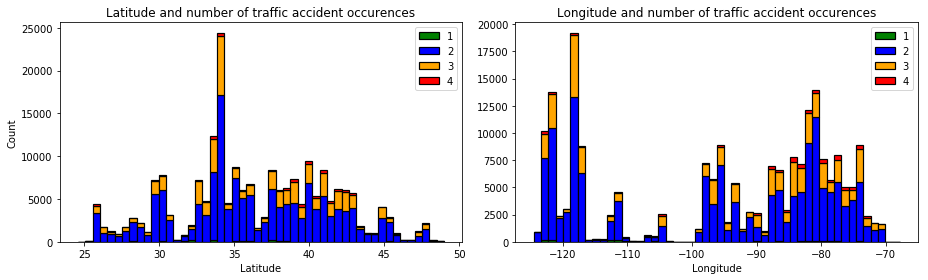

In [6]:
n_bins = 50
df_lat = df.select('Start_Lat','Severity').groupBy('Severity').agg(
    f.collect_list('Start_Lat').alias('Lat')).orderBy('Severity').select('Lat')
df_lng = df.select('Start_Lng','Severity').groupBy('Severity').agg(
    f.collect_list('Start_Lng').alias('Lng')).orderBy('Severity').select('Lng')
lat = np.array(df_lat.collect()).flatten()
lng = np.array(df_lng.collect()).flatten()

fig, ((ax0, ax1)) = plt.subplots(nrows=1, ncols=2, figsize=(13,4))

severity = [1,2,3,4]
colors = ['green', 'blue', 'orange', 'red']

ax0.hist(lat, n_bins, histtype='bar', color=colors, label=severity, stacked=True, edgecolor='black', linewidth=1.2)
ax0.legend(prop={'size': 10})
ax0.set_title('Latitude and number of traffic accident occurences')
ax0.set_xlabel('Latitude')
ax0.set_ylabel('Count')

ax1.hist(lng, n_bins, histtype='bar', color=colors, label=severity, stacked=True, edgecolor='black', linewidth=1.2)
ax1.legend(prop={'size': 10})
ax1.set_title('Longitude and number of traffic accident occurences')
ax1.set_xlabel('Longitude')


fig.tight_layout()
plt.show()

In [21]:
df_time = df.withColumn('Time', f.date_format(f.col('Start_time'),"dd-MM-yyyy")).select('Time','Severity').groupBy('Severity').agg(
    f.collect_list('Time').alias('Time')).orderBy('Severity').select('Time')
time = np.array(df_time.collect()).flatten()
time

array([list(['04-06-2020', '27-04-2017', '19-03-2020', '01-04-2020', '11-05-2020', '05-04-2020', '25-06-2020', '03-06-2020', '03-04-2020', '05-05-2020', '08-04-2020', '17-05-2020', '17-05-2020', '04-06-2020', '23-06-2020', '06-04-2020', '19-03-2020', '12-05-2020', '20-03-2020', '09-05-2020', '17-04-2020', '18-03-2020', '19-03-2020', '20-03-2020', '28-06-2020', '18-11-2017', '25-06-2020', '16-06-2020', '15-05-2020', '07-06-2020', '05-06-2020', '14-05-2020', '26-10-2016', '12-06-2020', '16-06-2020', '12-05-2020', '01-06-2020', '22-03-2020', '06-06-2020', '02-06-2020', '24-04-2020', '22-03-2020', '10-04-2020', '22-05-2020', '27-05-2020', '18-05-2020', '08-06-2020', '23-03-2020', '01-05-2020', '18-06-2020', '29-05-2020', '24-03-2020', '19-05-2020', '29-03-2020', '06-05-2020', '19-05-2020', '11-06-2020', '13-05-2020', '24-05-2020', '15-04-2020', '19-03-2020', '12-06-2020', '03-03-2020', '12-05-2020', '25-06-2020', '04-04-2020', '19-06-2020', '16-04-2020', '23-06-2020', '02-04-2020', '19-06-

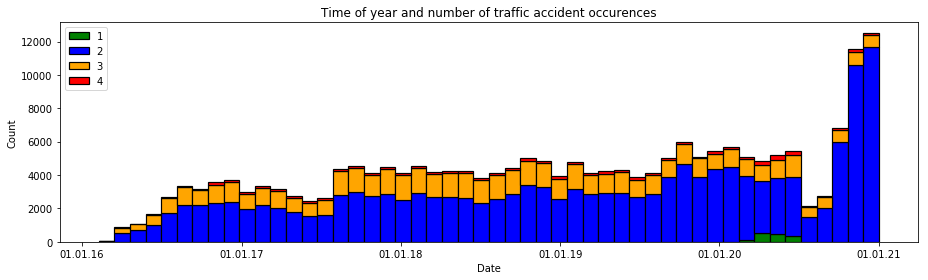

In [7]:
n_bins = 50
df_time = df.select('Start_Time','Severity').groupBy('Severity').agg(
    f.collect_list('Start_Time').alias('Time')).orderBy('Severity').select('Time')
time = np.array(df_time.collect()).flatten()

fig, ax = plt.subplots(figsize=(13,4))

severity = [1,2,3,4]
colors = ['green', 'blue', 'orange', 'red']

ax.hist(time, n_bins, histtype='bar', color=colors, label=severity, stacked=True, edgecolor='black', linewidth=1.2)
ax.legend(prop={'size': 10})
ax.set_title('Time of year and number of traffic accident occurences')
ax.xaxis.set_major_locator(mdates.YearLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%d.%m.%y'))
ax.set_xlabel('Date')
ax.set_ylabel('Count')


fig.tight_layout()
plt.show()

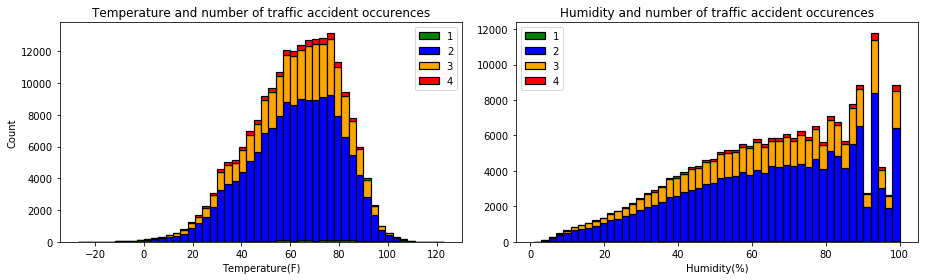

In [8]:
n_bins = 50
df_temp = df.select('Temperature(F)','Severity').groupBy('Severity').agg(
    f.collect_list('Temperature(F)').alias('Temp')).orderBy('Severity').select('Temp')
df_hum = df.select('Humidity(%)','Severity').groupBy('Severity').agg(
    f.collect_list('Humidity(%)').alias('Hum')).orderBy('Severity').select('Hum')
temp = np.array(df_temp.collect()).flatten()
hum = np.array(df_hum.collect()).flatten()

fig, ((ax0, ax1)) = plt.subplots(nrows=1, ncols=2, figsize=(13,4))

severity = [1,2,3,4]
colors = ['green', 'blue', 'orange', 'red']

ax0.hist(temp, n_bins, histtype='bar', color=colors, label=severity, stacked=True, edgecolor='black', linewidth=1.2)
ax0.legend(prop={'size': 10})
ax0.set_title('Temperature and number of traffic accident occurences')
ax0.set_xlabel('Temperature(F)')
ax0.set_ylabel('Count')

ax1.hist(hum, n_bins, histtype='bar', color=colors, label=severity, stacked=True, edgecolor='black', linewidth=1.2)
ax1.legend(prop={'size': 10})
ax1.set_title('Humidity and number of traffic accident occurences')
ax1.set_xlabel('Humidity(%)')


fig.tight_layout()
plt.show()

In [50]:
df_dn = df.groupBy('Sunrise_Sunset','Severity').count().filter("Sunrise_Sunset != 'None'")\
    .groupBy('Severity').pivot('Sunrise_Sunset').sum("count").orderBy('Severity').collect()

In [58]:
df_dn

array([[     1,   1219,    247],
       [     2, 102919,  47411],
       [     3,  38278,  15363],
       [     4,   3647,   2541]])

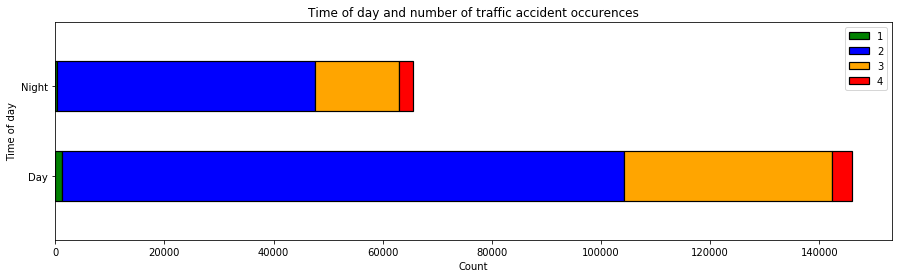

In [9]:
df_dn = np.array(df.groupBy('Sunrise_Sunset','Severity').count().filter("Sunrise_Sunset != 'None'")\
    .groupBy('Severity').pivot('Sunrise_Sunset').sum("count").orderBy('Severity').collect())
labels = ['Day','Night']
colors = ['green', 'blue', 'orange', 'red']
left = np.array([0,0])

fig, ax = plt.subplots(figsize=(15,4))
for i in range(len(df_dn)):
    ax.barh(labels, df_dn[i,1:], color=colors[i], left = left, label = df_dn[i,0], height = 0.55, \
            edgecolor='black', linewidth=1.2)
    left = left + np.array(df_dn[i,1:])
ax.set_title('Time of day and number of traffic accident occurences')
ax.set_ylabel('Time of day')
ax.set_yticks([0,1])
ax.set_ylim((-0.7,1.7))
ax.set_xlabel('Count')
ax.legend()

### Count number of missing fields

In [26]:
total = df.count()

In [27]:
records = df.na.drop().count()

In [28]:
total = df.count()
records = df.na.drop().count()
df_audit = df.select(
    [f.count(f.when(f.col(c).cast(StringType()).isNull(), c)).alias(c) for c in df.columns]
).toPandas().transpose().rename(columns={0: 'Missing values'})
df_audit['% Complete'] = round((1 - df_audit['Missing values']/total)*100, 3)

display("Complete Fields (%): {}%".format(round(len(df_audit[df_audit['Missing values']>0])/len(df_audit)*100, 3)))
display("Complete Records (%): {}%".format(round(records/total*100, 3)))

'Complete Fields (%): 44.898%'

'Complete Records (%): 0.0%'

In [29]:
df_audit.loc[["TMC", "End_Lat", "End_Lng", "Number"]]

,Missing values,% Complete
TMC,75704,64.228
End_Lat,135923,35.772
End_Lng,135923,35.772
Number,134374,36.504


In [76]:
df_record = df.drop("TMC", "End_Lat", "End_Lng", "Number")
records = df_record.na.drop().count()
display("Complete Records (%): {}%".format(round(records/total*100, 3)))

'Complete Records (%): 46.263%'

In [77]:
df_audit

,Missing values,% Complete
ID,0,100.000
Source,0,100.000
TMC,75704,64.228
Severity,0,100.000
Start_Time,0,100.000
End_Time,0,100.000
Start_Lat,0,100.000
Start_Lng,0,100.000
End_Lat,135923,35.772
End_Lng,135923,35.772


Text(0.5,0,'Attributes')

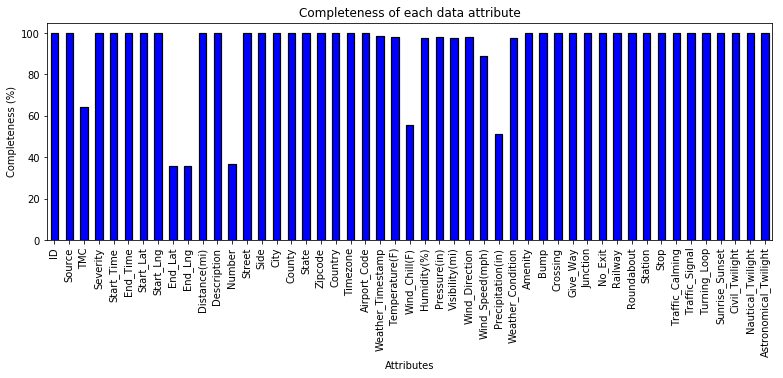

In [79]:
fig, ax = plt.subplots(figsize=(13,4))
complete = np.array(df_audit.select("% Complete").collect()).flatten()
ax.bar(df.columns, complete, edgecolor='black', linewidth=1.2)
ax.set_title('Completeness of each data attribute')
ax.set_ylabel('Completeness (%)')
ax.set_xticklabels(df.columns, rotation='vertical')
ax.set_xlabel('Attributes')

In [49]:
df_audit.select('TMC', "End_Lat", "End_Lng", "Number").show()

+-------+--------------+----------+--------+--------+
|       |Missing values|% Complete|Outliers|Extremes|
+-------+--------------+----------+--------+--------+
|    TMC|       1516064|    64.181|     0.0| 22686.0|
|End_Lat|       2716477|    35.819|     0.0|     0.0|
|End_Lng|       2716477|    35.819|     0.0|     0.0|
| Number|       2687949|    36.493|  8709.0|  4348.0|
+-------+--------------+----------+--------+--------+



In [50]:
df_audit.where(f.col("").rlike("Start\_Lat|Start\_Lng")).show()

+---------+--------------+----------+--------+--------+
|         |Missing values|% Complete|Outliers|Extremes|
+---------+--------------+----------+--------+--------+
|Start_Lat|             0|     100.0|     0.0|     0.0|
|Start_Lng|             0|     100.0|     0.0|     0.0|
+---------+--------------+----------+--------+--------+



In [51]:
df_audit.where(f.col("").rlike("Wind\_Chill(F)|Wind\_Speed(mph)|Precipitation(in)")).show()

+-----------------+--------------+----------+--------+--------+
|                 |Missing values|% Complete|Outliers|Extremes|
+-----------------+--------------+----------+--------+--------+
|    Wind_Chill(F)|       1896001|    55.204|  8500.0|    17.0|
|  Wind_Speed(mph)|        479326|    88.675| 27085.0|  1406.0|
|Precipitation(in)|       2065589|    51.197|  3308.0|  1951.0|
+-----------------+--------------+----------+--------+--------+



In [254]:
df_audit.loc[['TMC', "End_Lat", "End_Lng", "Number"]]

,Missing values,% Complete,Outliers,Extremes
TMC,1516064,64.181,0.0,22686.0
End_Lat,2716477,35.819,0.0,0.0
End_Lng,2716477,35.819,0.0,0.0
Number,2687949,36.493,8709.0,4348.0


### Outliers and Extremes

In [6]:
df_describe = df.describe()

In [7]:
null_counts = df_describe.select([f.count(f.when(f.col(c).isNull(), c)).alias(c) for c in df_describe.columns]).collect()[0].asDict()
to_drop = [k for k, v in null_counts.items() if v > 0]+['Zipcode']
df_describe = df_describe.drop(*to_drop)

In [8]:
df_describe.toPandas()

,summary,TMC,Severity,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Number,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),Precipitation(in)
0,count,135923,211627,211627,211627,75704,75704,211627,77253,207140,117241,206848,207838,206733,187746,108728
1,mean,208.26612125983092,2.305031966620516,36.39592374264561,-95.5379162829617,36.90712826151864,-98.57277839793097,0.3354619401389805,6224.521740256042,61.53264024331254,54.981961088697375,65.6313669941213,29.691933573263373,9.120612625947482,7.895281923450641,0.011977779412845386
2,stddev,21.16390707369682,0.5332289148279556,4.969651779028328,17.346283354536006,5.1755434688979305,18.473004016808577,1.585090281749109,13287.919556425137,18.536344476063142,22.748471943670676,22.723986394702564,0.8626063286534555,2.8009875338093972,5.447141439941009,0.1547752117649751
3,min,200.0,1,24.571202,-124.49746999999999,24.57036,-124.49746999999999,0.0,1.0,-27.0,-53.6,1.0,20.2,0.0,0.0,0.0
4,max,406.0,4,48.998241,-67.841889,48.974872,-67.842169,175.67999267599998,920400.0,123.0,123.0,100.0,31.15,80.0,822.8,10.13


In [9]:
df_describe.createOrReplaceTempView("dfTable")
df_std = spark.sql("select * from dfTable where summary = 'stddev'")

In [10]:
df_std.collect()

[Row(summary='stddev', TMC='21.16390707369682', Severity='0.5332289148279556', Start_Lat='4.969651779028328', Start_Lng='17.346283354536006', End_Lat='5.1755434688979305', End_Lng='18.473004016808577', Distance(mi)='1.585090281749109', Number='13287.919556425137', Temperature(F)='18.536344476063142', Wind_Chill(F)='22.748471943670676', Humidity(%)='22.723986394702564', Pressure(in)='0.8626063286534555', Visibility(mi)='2.8009875338093972', Wind_Speed(mph)='5.447141439941009', Precipitation(in)='0.1547752117649751')]

In [11]:
df_mean = spark.sql("select * from dfTable where summary = 'mean'")

In [12]:
df_mean.collect()

[Row(summary='mean', TMC='208.26612125983092', Severity='2.305031966620516', Start_Lat='36.39592374264561', Start_Lng='-95.5379162829617', End_Lat='36.90712826151864', End_Lng='-98.57277839793097', Distance(mi)='0.3354619401389805', Number='6224.521740256042', Temperature(F)='61.53264024331254', Wind_Chill(F)='54.981961088697375', Humidity(%)='65.6313669941213', Pressure(in)='29.691933573263373', Visibility(mi)='9.120612625947482', Wind_Speed(mph)='7.895281923450641', Precipitation(in)='0.011977779412845386')]

In [13]:
def outliers(df, df_mean, df_std):
    selectExpr = []
    for column in df_mean.columns[1:]:
        mean = float(df_mean.select(column).collect()[0][0])
        std = float(df_std.select(column).collect()[0][0])
        selectExpr.append((((df[column] < (mean - 3 * std)) | (df[column] > (mean + 3 * std)))).alias(column))
    return df.select(*selectExpr)

def extremes(df, df_mean, df_std):
    selectExpr = []
    for column in df_mean.columns[1:]:
        mean = float(df_mean.select(column).collect()[0][0])
        std = float(df_std.select(column).collect()[0][0])
        selectExpr.append((((df[column] < (mean - 5 * std)) | (df[column] > (mean + 5 * std)))).alias(column))
    return df.select(*selectExpr)

In [31]:
df_mean.select('Start_Lat').collect()[0][0]

'36.39592374264561'

In [13]:
df_outliers = df.select(df_describe.columns[1:]).na.fill(0.0)

In [69]:
df.select('Start_Lat').toPandas()

,Start_Lat
0,38.022070
1,40.353626
2,33.174210
3,37.511470
4,32.220900
5,26.457260
6,28.430280
7,34.036480
8,35.748520
9,43.001380


In [105]:
df_describe

,summary,ID,Source,TMC,Severity,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Description,Number,Street,Side,City,County,State,Zipcode,Country,Timezone,Airport_Code,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Direction,Wind_Speed(mph),Precipitation(in),Weather_Condition,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,count,211627,211627,135923,211627,211627,211627,75704,75704,211627,211627,77253,211627,211627,211625,211627,211627,211568,211627,211400,211211,207140,117241,206848,207838,206733,207443,187746,108728,206730,211625,211625,211625,211625
1,mean,None,None,208.26612125983092,2.305031966620516,36.39592374264561,-95.5379162829617,36.90712826151864,-98.57277839793097,0.3354619401389805,None,6224.521740256042,None,None,None,None,None,59106.90200468765,None,None,None,61.53264024331254,54.981961088697375,65.6313669941213,29.691933573263373,9.120612625947482,None,7.895281923450641,0.011977779412845386,None,None,None,None,None
2,stddev,None,None,21.16390707369682,0.5332289148279556,4.969651779028328,17.346283354536006,5.1755434688979305,18.473004016808577,1.585090281749109,None,13287.919556425137,None,None,None,None,None,30721.96832698801,None,None,None,18.536344476063142,22.748471943670676,22.723986394702564,0.8626063286534555,2.8009875338093972,None,5.447141439941009,0.1547752117649751,None,None,None,None,None
3,min,A-1000,Bing,200.0,1,24.571202,-124.49746999999999,24.57036,-124.49746999999999,0.0,! frontage lane blocked due to accident and sp...,1.0,1 Mile Rd,L,Aaronsburg,Abbeville,AL,01001,US,US/Central,K01M,-27.0,-53.6,1.0,20.2,0.0,CALM,0.0,0.0,Blowing Dust,Day,Day,Day,Day
4,max,A-99999,MapQuest-Bing,406.0,4,48.998241,-67.841889,48.974872,-67.842169,175.67999267599998,~6 lane blocked due to accident on I-5 Southbo...,920400.0,Zurich Ct,R,Zwingle,Yuma,WY,99362,US,US/Pacific,KZZV,123.0,123.0,100.0,31.15,80.0,West,822.8,10.13,Wintry Mix / Windy,Night,Night,Night,Night


In [74]:
df_outliers.select('Start_Lat').subtract(df_mean.select('Start_Lat')).toPandas()

,Start_Lat
0,37.72305
1,37.74109
2,32.2504
3,38.25517
4,45.486540000000005
5,38.62888
6,27.74475
7,33.638009999999994
8,28.611309999999996
9,31.779190000000003


In [65]:
df_out = outliers(df_outliers, df_mean, df_std)
df_out.select(*[f.count(f.when(f.col(c) == True, True)).alias(c) for c in df_out.columns]).toPandas()
df_out

,TMC,Severity,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Number,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),Precipitation(in)
0,76828,6189,0,0,135923,135923,2354,867,5251,407,0,9097,7731,1034,275


In [68]:
df_ex = extremes(df_outliers, df_mean, df_std)
df_ex = df_ex.select(*[f.count(f.when(f.col(c) == True, True)).alias(c) for c in df_ex.columns]).toPandas()
df_ex

,TMC,Severity,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Number,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),Precipitation(in)
0,76828,0,0,0,135923,135923,1111,301,0,0,0,6097,447,66,111


In [15]:
df_std = df_std.toPandas().transpose()[0][1:].astype('float')
df_std

TMC                     21.163907
Severity                 0.533229
Start_Lat                4.969652
Start_Lng               17.346283
End_Lat                  5.175543
End_Lng                 18.473004
Distance(mi)             1.585090
Number               13287.919556
Temperature(F)          18.536344
Wind_Chill(F)           22.748472
Humidity(%)             22.723986
Pressure(in)             0.862606
Visibility(mi)           2.800988
Wind_Speed(mph)          5.447141
Precipitation(in)        0.154775
Name: 0, dtype: float64

In [16]:
df_mean = df_mean.toPandas().transpose()[0][1:].astype('float')
df_mean

TMC                   208.266121
Severity                2.305032
Start_Lat              36.395924
Start_Lng             -95.537916
End_Lat                36.907128
End_Lng               -98.572778
Distance(mi)            0.335462
Number               6224.521740
Temperature(F)         61.532640
Wind_Chill(F)          54.981961
Humidity(%)            65.631367
Pressure(in)           29.691934
Visibility(mi)          9.120613
Wind_Speed(mph)         7.895282
Precipitation(in)       0.011978
Name: 0, dtype: float64

In [20]:
df_outliers = df.select(*df_std.keys()).toPandas().fillna(0).astype("float")

In [36]:
df_outliers = (df_outliers < (df_mean - 3 * df_std)) |(df_outliers > (df_mean + 3 * df_std))
df_outliers.head(5)

TMC             0
Severity     6189
Start_Lat       0
Start_Lng       0
End_Lat         0
dtype: int64

In [22]:
df_outliers = df_outliers[df_outliers==True].count(axis=0)
df_outliers

TMC                   76828
Severity               6189
Start_Lat                 0
Start_Lng                 0
End_Lat              135923
End_Lng              135923
Distance(mi)           2354
Number                  867
Temperature(F)         5251
Wind_Chill(F)           407
Humidity(%)               0
Pressure(in)           9097
Visibility(mi)         7731
Wind_Speed(mph)        1034
Precipitation(in)       275
dtype: int64

In [17]:
df_ex = df.select(*df_std.keys()).toPandas().fillna(0).astype("float")
df_ex = (df_ex < (df_mean - 5 * df_std)) |(df_ex > (df_mean + 5 * df_std))

In [18]:
df_ex = df_ex[df_ex==True].count(axis=0)
df_ex

TMC                   76828
Severity                  0
Start_Lat                 0
Start_Lng                 0
End_Lat              135923
End_Lng              135923
Distance(mi)           1111
Number                  301
Temperature(F)            0
Wind_Chill(F)             0
Humidity(%)               0
Pressure(in)           6097
Visibility(mi)          447
Wind_Speed(mph)          66
Precipitation(in)       111
dtype: int64

In [23]:
df_outliers = df_outliers - df_ex
df_outex = df_outliers.to_frame(name="Outliers")

In [24]:
df_outex['Extremes'] = df_ex

In [25]:
df_outex

,Outliers,Extremes
TMC,0,76828
Severity,6189,0
Start_Lat,0,0
Start_Lng,0,0
End_Lat,0,135923
End_Lng,0,135923
Distance(mi),1243,1111
Number,566,301
Temperature(F),5251,0
Wind_Chill(F),407,0


In [31]:
df_audit = df_audit.merge(df_outex, how = 'left', left_index=True, right_index=True)
df_audit = df_audit.fillna(0)
df_audit

,Missing values,% Complete,Outliers,Extremes
ID,0,100.000,0.0,0.0
Source,0,100.000,0.0,0.0
TMC,75704,64.228,0.0,76828.0
Severity,0,100.000,6189.0,0.0
Start_Time,0,100.000,0.0,0.0
End_Time,0,100.000,0.0,0.0
Start_Lat,0,100.000,0.0,0.0
Start_Lng,0,100.000,0.0,0.0
End_Lat,135923,35.772,0.0,135923.0
End_Lng,135923,35.772,0.0,135923.0


In [34]:
out_perc = round(df_audit["Outliers"]/total*100,3)
ex_perc = round(df_audit["Extremes"]/total*100,3)

out_ex_perc = pd.DataFrame({"% Outlier": out_perc, "% Extremes": ex_perc})
out_ex_perc

,% Extremes,% Outlier
ID,0.000,0.000
Source,0.000,0.000
TMC,36.303,0.000
Severity,0.000,2.924
Start_Time,0.000,0.000
End_Time,0.000,0.000
Start_Lat,0.000,0.000
Start_Lng,0.000,0.000
End_Lat,64.228,0.000
End_Lng,64.228,0.000


In [ ]:
df_dn = np.flip(np.array(df.groupBy('Year','Severity').count().groupBy('Severity').pivot('Year').sum("count").orderBy('Severity').collect()), 1)
labels = ['2020', '2019','2018','2017','2016']
colors = ['green', 'red']
left = np.array([0,0,0,0,0])

fig, ax = plt.subplots(figsize=(13,4))
for i in range(len(df_dn)):
    ax.barh(labels, df_dn[i,:-1], color=colors[i], left = left, label = df_dn[i,-1], height = 0.55, \
        edgecolor='black', linewidth=1.2)
    left = left + np.array(df_dn[i,:-1])
ax.set_title('Traffic accident occurences for each year')
ax.set_ylabel('Year')
ax.set_xlabel('Count')
ax.legend()

fig, ax = plt.subplots(figsize=(13,4))
out = np.array(df_audit.select("Outliers").collect()).flatten()/total
ex = np.array(df_audit.select("Extremes").collect()).flatten()/total
ax.bar(df.columns, out, color = 'cornflowerblue', edgecolor='black', linewidth=1.2)
ax.bar(df.columns, out, color = 'orange', bottom = out, edgecolor='black', linewidth=1.2)
ax.set_title('Outliers and extremes of each data attribute')
ax.set_ylabel('% Outliers/Extremes')
ax.set_xticklabels(df.columns, rotation='vertical')
ax.set_xlabel('Attributes')

Text(0.5, 0, 'Attributes')

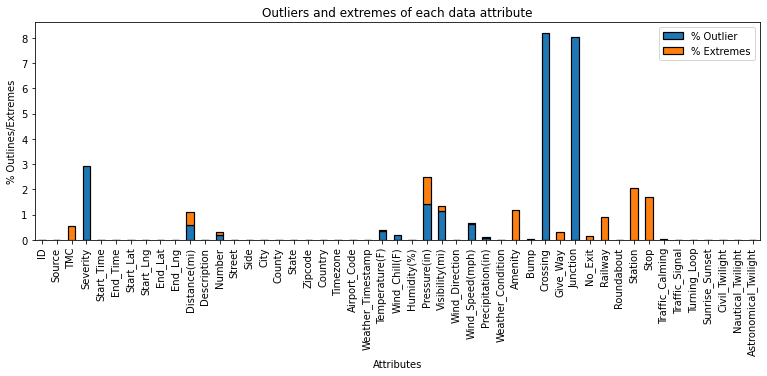

In [280]:
fig, ax = plt.subplots(figsize=(13,4))
out = np.array(df_audit.select("Outliers").collect()).flatten()/total
ex = np.array(df_audit.select("Extremes").collect()).flatten()/total
ax.bar(df.columns, out, color = 'cornflowerblue', edgecolor='black', linewidth=1.2)
ax.bar(df.columns, out, color = 'orange', bottom = out, edgecolor='black', linewidth=1.2)
ax.set_title('Outliers and extremes of each data attribute')
ax.set_ylabel('% Outliers/Extremes')
ax.set_xticklabels(df.columns, rotation='vertical')
ax.set_xlabel('Attributes')

In [254]:
df_audit.loc[['TMC', "End_Lat", "End_Lng", "Number"]]

,Missing values,% Complete,Outliers,Extremes
TMC,1516064,64.181,0.0,22686.0
End_Lat,2716477,35.819,0.0,0.0
End_Lng,2716477,35.819,0.0,0.0
Number,2687949,36.493,8709.0,4348.0


In [258]:
df_audit.loc[["Start_Lat", "Start_Lng"]]

,Missing values,% Complete,Outliers,Extremes
Start_Lat,0,100.0,0.0,0.0
Start_Lng,0,100.0,0.0,0.0


In [260]:
df_audit.loc[["Wind_Chill(F)", "Wind_Speed(mph)", "Precipitation(in)"]]

,Missing values,% Complete,Outliers,Extremes
Wind_Chill(F),1896001,55.204,8500.0,17.0
Wind_Speed(mph),479326,88.675,27085.0,1406.0
Precipitation(in),2065589,51.197,3308.0,1951.0


In [16]:
list(Q1.keys())

Index(['TMC', 'Severity', 'Start_Lat', 'Start_Lng', 'End_Lat', 'End_Lng',
       'Distance(mi)', 'Number', 'Temperature(F)', 'Wind_Chill(F)',
       'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Speed(mph)',
       'Precipitation(in)', 'Amenity', 'Bump', 'Crossing', 'Give_Way',
       'Junction', 'No_Exit', 'Railway', 'Roundabout', 'Station', 'Stop',
       'Traffic_Calming', 'Traffic_Signal', 'Turning_Loop'],
      dtype='object')

In [286]:
df_audit.loc[["Distance(mi)", 'Temperature(F)', 'Wind_Chill(F)', 'Humidity(%)', 
              'Pressure(in)', 'Visibility(mi)', 'Wind_Speed(mph)', 'Precipitation(in)']]

,Missing values,% Complete,Outliers,Extremes
Distance(mi),0,100.000,24655.0,22029.0
Temperature(F),89900,97.876,15578.0,37.0
Wind_Chill(F),1896001,55.204,8500.0,17.0
Humidity(%),95467,97.744,0.0,0.0
Pressure(in),76384,98.195,59837.0,46061.0
Visibility(mi),98668,97.669,47814.0,8847.0
Wind_Speed(mph),479326,88.675,27085.0,1406.0
Precipitation(in),2065589,51.197,3308.0,1951.0


In [52]:
df_audit.where(f.col("").rlike(
    "Distance\(mi\)|Temperature\(F\)|Wind_Chill\(F\)Humidity\(\%\)|Pressure\(in\)|Visibility\(mi\)|Wind_Speed\(mph\)|Precipitation\(in\)"
)).show()

+-----------------+--------------+----------+--------+--------+
|                 |Missing values|% Complete|Outliers|Extremes|
+-----------------+--------------+----------+--------+--------+
|     Distance(mi)|             0|     100.0| 24655.0| 22029.0|
|   Temperature(F)|         89900|    97.876| 15578.0|    37.0|
|    Wind_Chill(F)|       1896001|    55.204|  8500.0|    17.0|
|      Humidity(%)|         95467|    97.744|     0.0|     0.0|
|     Pressure(in)|         76384|    98.195| 59837.0| 46061.0|
|   Visibility(mi)|         98668|    97.669| 47814.0|  8847.0|
|  Wind_Speed(mph)|        479326|    88.675| 27085.0|  1406.0|
|Precipitation(in)|       2065589|    51.197|  3308.0|  1951.0|
+-----------------+--------------+----------+--------+--------+



In [ ]:
data = [
    ("Distance(mi)", 0, 100.000, 24655.0, 22029.0),
    ("Temperature(F)", 89900, 97.876, 15578.0, 37.0),
    ("Wind_Chill(F)", 1896001, 55.204, 8500.0, 17.0),
    ("Humidity(%)", 95467, 97.744, 0.0, 0.0),
    ("Pressure(in)", 76384, 98.195, 59837.0, 46061.0),
    ("Visibility(mi)", 98668, 97.669, 47814.0, 8847.0),
    ("Wind_Speed(mph)", 479326, 88.675, 27085.0, 1406.0),
    ("Precipitation(in)", 2065589, 51.197, 3308.0, 1951.0),
]

schema = StructType([
    StructField("", StringType(), True),
    StructField("Missing values", IntegerType(), True),
    StructField("% Complete", FloatType(), True),
    StructField("Outliers", FloatType(), True),
    StructField("Extremes", FloatType(), True),
])

df_coef = spark.createDataFrame(data=data,schema=schema).show()

### Data reduction

In [254]:
df_audit.loc[['TMC', "End_Lat", "End_Lng", "Number"]]

,Missing values,% Complete,Outliers,Extremes
TMC,1516064,64.181,0.0,22686.0
End_Lat,2716477,35.819,0.0,0.0
End_Lng,2716477,35.819,0.0,0.0
Number,2687949,36.493,8709.0,4348.0


In [258]:
df_audit.loc[["Start_Lat", "Start_Lng"]]

,Missing values,% Complete,Outliers,Extremes
Start_Lat,0,100.0,0.0,0.0
Start_Lng,0,100.0,0.0,0.0


In [260]:
df_audit.loc[["Wind_Chill(F)", "Wind_Speed(mph)", "Precipitation(in)"]]

,Missing values,% Complete,Outliers,Extremes
Wind_Chill(F),1896001,55.204,8500.0,17.0
Wind_Speed(mph),479326,88.675,27085.0,1406.0
Precipitation(in),2065589,51.197,3308.0,1951.0


In [16]:
list(Q1.keys())

Index(['TMC', 'Severity', 'Start_Lat', 'Start_Lng', 'End_Lat', 'End_Lng',
       'Distance(mi)', 'Number', 'Temperature(F)', 'Wind_Chill(F)',
       'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Speed(mph)',
       'Precipitation(in)', 'Amenity', 'Bump', 'Crossing', 'Give_Way',
       'Junction', 'No_Exit', 'Railway', 'Roundabout', 'Station', 'Stop',
       'Traffic_Calming', 'Traffic_Signal', 'Turning_Loop'],
      dtype='object')

In [286]:
df_audit.loc[["Distance(mi)", 'Temperature(F)', 'Wind_Chill(F)', 'Humidity(%)', 
              'Pressure(in)', 'Visibility(mi)', 'Wind_Speed(mph)', 'Precipitation(in)']]

,Missing values,% Complete,Outliers,Extremes
Distance(mi),0,100.000,24655.0,22029.0
Temperature(F),89900,97.876,15578.0,37.0
Wind_Chill(F),1896001,55.204,8500.0,17.0
Humidity(%),95467,97.744,0.0,0.0
Pressure(in),76384,98.195,59837.0,46061.0
Visibility(mi),98668,97.669,47814.0,8847.0
Wind_Speed(mph),479326,88.675,27085.0,1406.0
Precipitation(in),2065589,51.197,3308.0,1951.0


C:\Users\XC_mi\anaconda3\lib\site-packages\matplotlib\cbook\__init__.py:1239: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
C:\Users\XC_mi\anaconda3\lib\site-packages\matplotlib\cbook\__init__.py:1246: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
C:\Users\XC_mi\anaconda3\lib\site-packages\matplotlib\cbook\__init__.py:1254: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
C:\Users\XC_mi\anaconda3\lib\site-packages\matplotlib\cbook\__init__.py:1255: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],
No handles with labels found to put in legend.


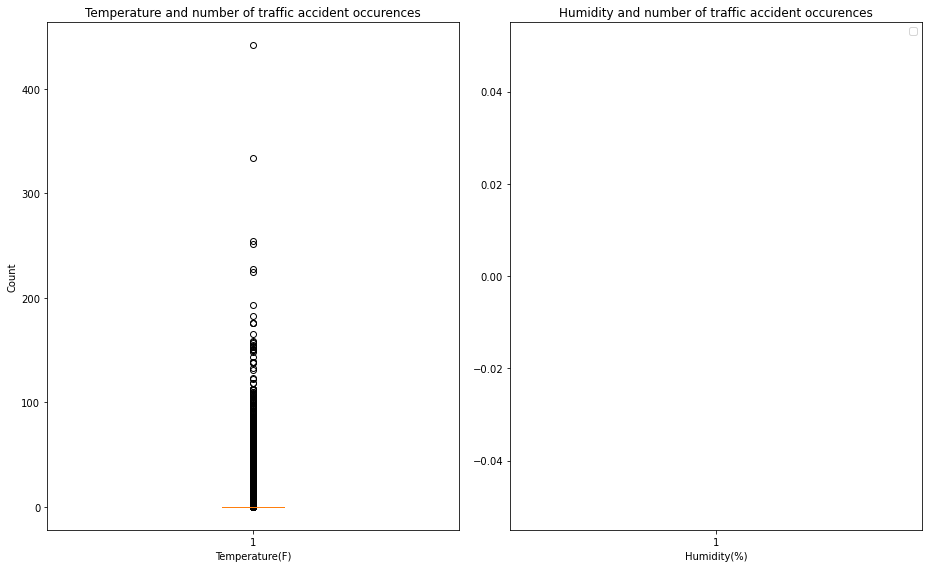

In [292]:
n_bins = 50
temp = [x['Temperature(F)'] for _, x in df[["Severity","Temperature(F)"]].groupby(['Severity'])]
hum = [x['Humidity(%)'] for _, x in df[["Severity","Humidity(%)"]].groupby(['Severity'])]

fig, ((ax0, ax1)) = plt.subplots(nrows=1, ncols=2, figsize=(13,8))


ax0.boxplot(df['Distance(mi)'])
ax0.set_title('Temperature and number of traffic accident occurences')
ax0.set_xlabel('Temperature(F)')
ax0.set_ylabel('Count')

ax1.boxplot(df['Temperature(F)'])
ax1.legend(prop={'size': 10})
ax1.set_title('Humidity and number of traffic accident occurences')
ax1.set_xlabel('Humidity(%)')


fig.tight_layout()
plt.show()

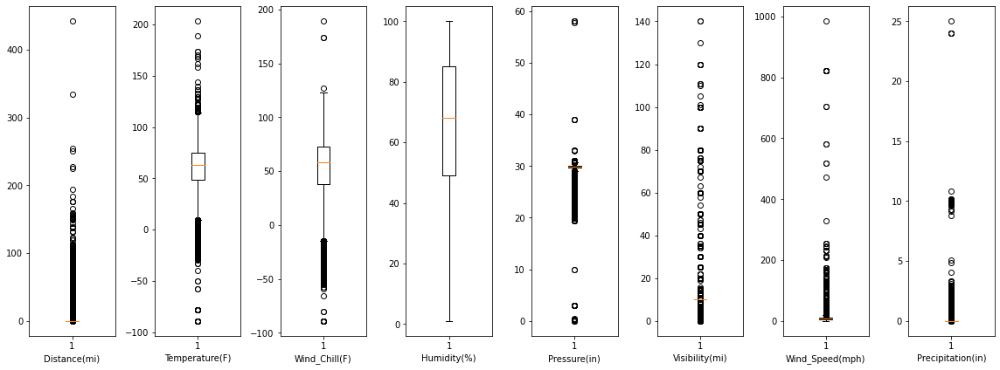

In [310]:
fig, ((ax0, ax1, ax2, ax3, ax4, ax5, ax6, ax7)) = plt.subplots(nrows=1, ncols=8, figsize=(16,6))
ax0.boxplot(df['Distance(mi)'])
ax0.set_xlabel('Distance(mi)')
ax1.boxplot(df['Temperature(F)'].dropna())
ax1.set_xlabel('Temperature(F)')
ax2.boxplot(df['Wind_Chill(F)'].dropna())
ax2.set_xlabel('Wind_Chill(F)')
ax3.boxplot(df['Humidity(%)'].dropna())
ax3.set_xlabel('Humidity(%)')
ax4.boxplot(df['Pressure(in)'].dropna())
ax4.set_xlabel('Pressure(in)')
ax5.boxplot(df['Visibility(mi)'].dropna())
ax5.set_xlabel('Visibility(mi)')
ax6.boxplot(df['Wind_Speed(mph)'].dropna())
ax6.set_xlabel('Wind_Speed(mph)')
ax7.boxplot(df['Precipitation(in)'].dropna())
ax7.set_xlabel('Precipitation(in)')
        
fig.tight_layout()
plt.show()

### Data preparation

In [312]:
df_prep = df.drop('ID', 'TMC', 'Distance(mi)')

In [ ]:
df_prep.toPandas()

#### Difference between start time and end time, start location and end location

In [518]:
df['Start_Time'] = pd.to_datetime(df['Start_Time'])
df['End_Time'] = pd.to_datetime(df['End_Time'])
df['Weather_Timestamp'] = pd.to_datetime(df['Weather_Timestamp'])

# calculate duration as the difference between end time and start time in minute
df['Duration'] = df['End_Time'] - df['Start_Time']
df['Duration'][0]

Timedelta('0 days 05:14:00')

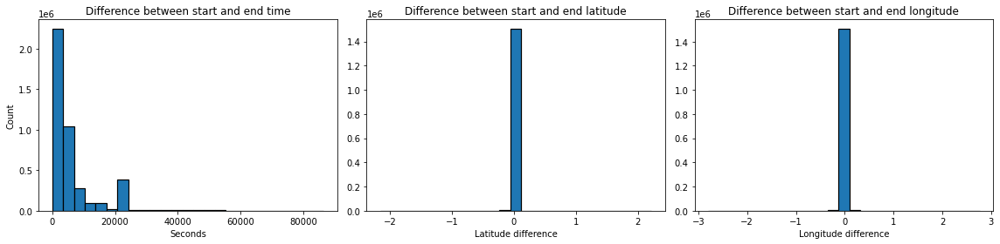

In [339]:
fig, ((ax0, ax1, ax2)) = plt.subplots(nrows=1, ncols=3, figsize=(16,4))
ax0.hist(df["Duration"].dt.seconds, bins = 25, histtype='bar', edgecolor='black', linewidth=1.2)
ax0.set_title('Difference between start and end time')
ax0.set_xlabel('Seconds')
ax0.set_ylabel('Count')

ax1.hist(df["Start_Lat"] - df["End_Lat"], bins = 25, histtype='bar', edgecolor='black', linewidth=1.2)
ax1.set_title('Difference between start and end latitude')
ax1.set_xlabel('Latitude difference')

ax2.hist(df["Start_Lng"] - df["End_Lng"], bins = 25, histtype='bar', edgecolor='black', linewidth=1.2)
ax2.set_title('Difference between start and end longitude')
ax2.set_xlabel('Longitude difference')

fig.tight_layout()
plt.show()

#### Counting the number of Turning-loops and country

In [48]:
df.groupBy('Turning_Loop').count().show()
df.groupBy('Country').count().show()

+------------+-------+
|Turning_Loop|  count|
+------------+-------+
|       false|4232541|
+------------+-------+

+-------+-------+
|Country|  count|
+-------+-------+
|     US|4232541|
+-------+-------+



In [49]:
df_prep = df_prep.drop('ID', 'TMC', 'Distance(mi)', "End_Lat", "End_Lng", "End_Time", "Turning_Loop", "Country")

In [50]:
df_prep = df_prep.drop("Civil_Twilight", "Nautical_Twilight", "Astronomical_Twilight")

### Clean the Data

In [56]:
df_dn = df.groupBy('Source','Severity').count().filter("Source != 'None'")\
    .groupBy('Severity').pivot('Source').sum("count").orderBy('Severity').toPandas()

In [57]:
df_dn

,Severity,Bing,MapQuest,MapQuest-Bing
0,1,1408,55,3
1,2,60532,87763,2036
2,3,8049,44302,1290
3,4,5715,468,6


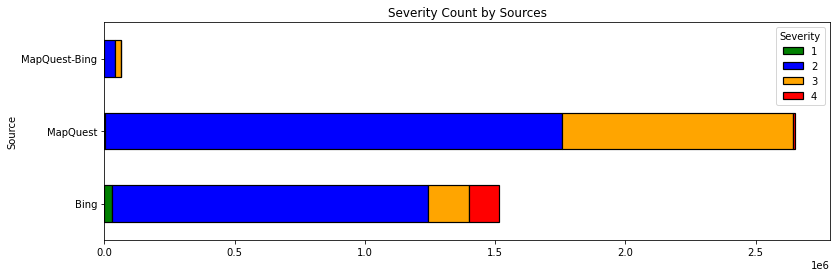

In [348]:
df_dn = np.array(df.groupBy('Source','Severity').count().filter("Source != 'None'")\
    .groupBy('Severity').pivot('Source').sum("count").orderBy('Severity').collect())
labels = ['Bing','MapQuest','MapQuest-Bing']
colors = ['green', 'blue', 'orange', 'red']
left = np.array([0,0,0])

fig, ax = plt.subplots(figsize=(13,4))
for i in range(len(df_dn)):
    ax.barh(labels, df_dn[i,1:], color=colors[i], left = left, label = df_dn[i,0], height = 0.55, \
            edgecolor='black', linewidth=1.2)
    left = left + np.array(df_dn[i,1:])
ax.set_title('Time of day and number of traffic accident occurences')
ax.set_ylabel('Time of day')
ax.set_yticks([0,1,2])
ax.set_ylim((-0.7,2.7))
ax.set_xlabel('Count')
ax.legend()

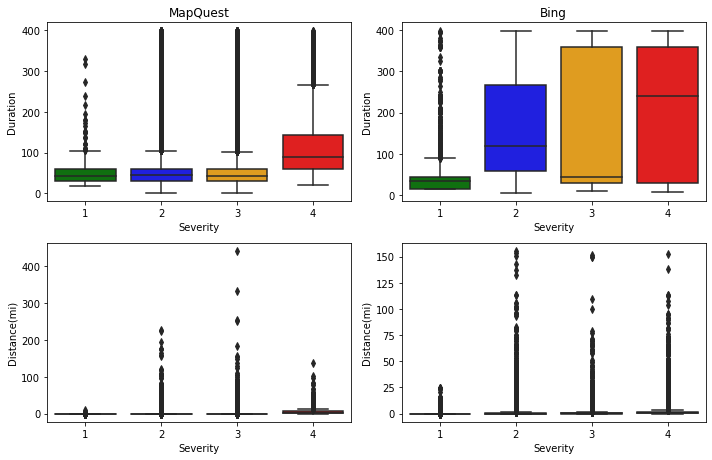

In [361]:
df['Duration'] = df['Duration'].apply(lambda x:round(x.total_seconds() / 60) )
fig, ((ax0, ax1),(ax2, ax3)) = plt.subplots(nrows = 2, ncols=2, figsize=(10, 6.5))

sns.boxplot(x="Severity", y="Duration",
            data=df.loc[(df['Source']=="MapQuest") & (df['Duration']<400),], palette=colors, ax=ax0)
ax0.set_title('MapQuest')

sns.boxplot(x="Severity", y="Duration",
            data=df.loc[(df['Source']=="Bing") & (df['Duration']<400),], palette=colors, ax=ax1)
ax1.set_title('Bing')

sns.boxplot(x="Severity", y="Distance(mi)",
            data=df.loc[(df['Source']=="MapQuest")], palette=colors, ax=ax2)
ax0.set_title('MapQuest')

sns.boxplot(x="Severity", y="Distance(mi)",
            data=df.loc[(df['Source']=="Bing")], palette=colors, ax=ax3)
ax1.set_title('Bing')

fig.tight_layout()
plt.show()

In [522]:
df = df.loc[df['Source']=="MapQuest",]
df = df.drop(['Source'], axis=1)
print("The shape of data is:",(df.shape))

The shape of data is: (2651861, 49)


#### Timestamp difference

In [379]:
df["Weather_Timestamp"]

0         2016-02-08 05:58:00
1         2016-02-08 05:51:00
2         2016-02-08 06:56:00
3         2016-02-08 07:38:00
4         2016-02-08 07:53:00
                  ...        
2716472   2017-08-30 18:51:00
2716473   2017-08-30 18:51:00
2716474   2017-08-30 18:50:00
2716475   2017-08-30 19:53:00
2716476   2017-08-30 20:15:00
Name: Weather_Timestamp, Length: 2651861, dtype: datetime64[ns]

In [387]:
df['Start_Time']

0         2016-02-08 05:46:00
1         2016-02-08 06:07:59
2         2016-02-08 06:49:27
3         2016-02-08 07:23:34
4         2016-02-08 07:39:07
                  ...        
2716472   2017-08-30 18:41:30
2716473   2017-08-30 18:59:02
2716474   2017-08-30 18:57:52
2716475   2017-08-30 19:49:01
2716476   2017-08-30 20:17:21
Name: Start_Time, Length: 2651861, dtype: datetime64[ns]

In [388]:
df['Start_Time'] = pd.to_datetime(df['Start_Time'])
(df['Start_Time'][0] - df["Weather_Timestamp"][0]).total_seconds()

-720.0

Text(0.5, 0, 'Time difference')

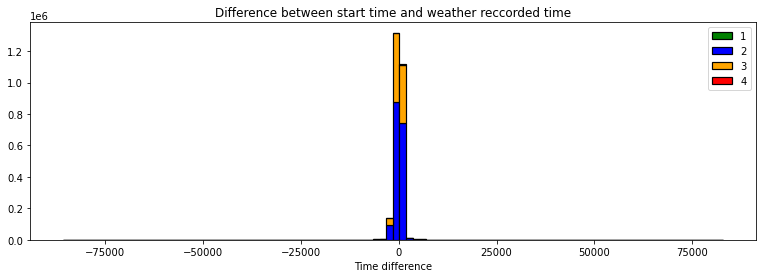

In [400]:
n_bins = 50
df_timedif = df.select('Severity', f.datediff(df.Weather_Timestamp, df.Start_Time).alias('Time_Diff'))
df_timedif = df_timedif.groupBy('Severity').agg(
    f.collect_list('Time_Diff').alias('Time_Dif')).orderBy('Severity').select('Time_Dif')
timedif = np.array(df_timedif.collect()).flatten()

fig, ax = plt.subplots(figsize=(13,4))

severity = [1,2,3,4]
colors = ['green', 'blue', 'orange', 'red']

ax.hist(timedif, n_bins, histtype='bar', color=colors, label=severity, stacked=True, edgecolor='black', linewidth=1.2)
ax.legend(prop={'size': 10})
ax.set_title('Time of year and number of traffic accident occurences')
ax.set_xlabel('Date')
ax.set_ylabel('Count')


fig.tight_layout()
plt.show()

In [48]:
df = df.na.drop(subset = ['City','Zipcode','Airport_Code', 'Sunrise_Sunset'])
df = df.na.drop(subset = ['Temperature(F)', 'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', \
                         'Wind_Direction', 'Weather_Condition', 'Wind_Speed(mph)','Wind_Chill(F)'])
print("The shape of data is: ({0},{1})".format(df_traffic.count(), len(df_traffic.columns)))

The shape of data is: (2284770,38)


In [493]:
df.head(3)

,Severity,Start_Time,Start_Lat,Start_Lng,Description,Number,Street,Side,City,County,State,Zipcode,Timezone,Airport_Code,Weather_Timestamp,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Direction,Wind_Speed(mph),Precipitation(in),Weather_Condition,Amenity,Bump,Crossing,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Sunrise_Sunset,Duration
0,3,2016-02-08 05:46:00,39.865147,-84.058723,Right lane blocked due to accident on I-70 Eas...,NaN,I-70 E,R,Dayton,Montgomery,OH,45424,US/Eastern,KFFO,2016-02-08 05:58:00,36.9,NaN,91.0,29.68,10.0,Calm,NaN,0.02,Light Rain,False,False,False,False,False,False,False,False,False,False,False,False,Night,05:14:00
1,2,2016-02-08 06:07:59,39.928059,-82.831184,Accident on Brice Rd at Tussing Rd. Expect del...,2584.0,Brice Rd,L,Reynoldsburg,Franklin,OH,43068-3402,US/Eastern,KCMH,2016-02-08 05:51:00,37.9,NaN,100.0,29.65,10.0,Calm,NaN,0.00,Light Rain,False,False,False,False,False,False,False,False,False,False,False,False,Night,00:30:00
2,2,2016-02-08 06:49:27,39.063148,-84.032608,Accident on OH-32 State Route 32 Westbound at ...,NaN,State Route 32,R,Williamsburg,Clermont,OH,45176,US/Eastern,KI69,2016-02-08 06:56:00,36.0,33.3,100.0,29.67,10.0,SW,3.5,NaN,Overcast,False,False,False,False,False,False,False,False,False,False,False,True,Night,00:30:00


In [26]:
audit_fields = df.isna().sum()
audit_fields = audit_fields.to_frame()
audit_fields.columns = ['Missing values']
audit_fields

,Missing values
Severity,0
Start_Lat,0
Start_Lng,0
Temperature(F),0
Wind_Chill(F),437
Humidity(%),0
Pressure(in),0
Visibility(mi),0
Wind_Speed(mph),0
Precipitation(in),0


In [12]:
from pyspark.sql.functions import date_format
df = df.select('Start_Time', date_format('Start_Time', 'u').alias('Weekday'), date_format('Start_Time', 'E').alias('dow_string'))
df.show(3)

+--------------------+----------+----------+
|          Start_Time|dow_number|dow_string|
+--------------------+----------+----------+
|2020-06-04 02:49:...|         4|       Thu|
|2017-04-27 21:19:...|         4|       Thu|
|2020-03-19 09:36:...|         4|       Thu|
+--------------------+----------+----------+
only showing top 3 rows



In [25]:
df = df.withColumn('Year', f.year(f.col('Start_Time')))
df = df.withColumn('Month', f.month(f.col('Start_Time')))
df = df.withColumn('Weekday', f.date_format('Start_Time', 'u').alias('Weekday'))
df = df.withColumn('Day', f.dayofmonth(f.col('Start_Time')))
df = df.withColumn('Hour', f.hour(f.col('Start_Time')))
df = df.withColumn('Minute', f.minute(f.col('Start_Time')))

#df.select('Start_Time', 'Year', 'Month', 'Weekday', 'Day', 'Hour', 'Minute').show(5)

+--------------------+----+-----+-------+---+----+------+
|          Start_Time|Year|Month|Weekday|Day|Hour|Minute|
+--------------------+----+-----+-------+---+----+------+
|2020-06-04 02:49:...|2020|    6|      4|  4|   2|    49|
|2017-04-27 21:19:...|2017|    4|      4| 27|  21|    19|
|2020-03-19 09:36:...|2020|    3|      4| 19|   9|    36|
|2020-04-01 14:01:...|2020|    4|      3|  1|  14|     1|
|2020-05-11 12:12:...|2020|    5|      1| 11|  12|    12|
+--------------------+----+-----+-------+---+----+------+
only showing top 5 rows



In [45]:
df = df.withColumn('Month', f.month(df.Start_Time))

In [18]:

df = df.groupby(['Airport_Code','Month']).agg(f.mean(f.col('Temperature(F)')))\
    .join(df, on=['Airport_Code','Month'], how = 'rightouter')
df = df.na.fill('Temperature(F)', 'avg(Temperature(F))')

In [22]:
df = df.na.fill('Temperature(F)', 'avg(Temperature(F)')

In [20]:
df = df.groupby(['Airport_Code','Month']).agg(f.mean(f.col('Temperature(F)')))\
    .join(df.drop('avg(Temperature(F))'), on=['Airport_Code','Month'], how = 'rightouter')

In [33]:
df.select(f.count(f.when(f.col('Temperature(F)').isNull(), 'Temperature(F)')).alias('count')).collect()[0][0]

4487

In [526]:
Weather_data=['Temperature(F)','Humidity(%)','Pressure(in)','Visibility(mi)','Wind_Speed(mph)','Wind_Chill(F)']
print("The number of remaining missing values: ")
for i in Weather_data:
    df = df.groupby(['Airport_Code','Month']).agg(f.mean(f.col(i)))\
        .join(df.drop('avg({})'.format(i)), on=['Airport_Code','Month'], how = 'rightouter')
    df = df.na.fill('Temperature(F)', 'avg({})'.format(i))
    
    print( i + " : " + str(df.select(f.count(f.when(f.col(i).isNull(), i))).collect()[0][0]))

The number of remaining missing values: 
Temperature(F) : 9887
Humidity(%) : 9911
Pressure(in) : 9857
Visibility(mi) : 16612
Wind_Speed(mph) : 16645
Wind_Chill(F) : 21307


In [47]:
@f.udf
def mode(x):
    return Counter(x).most_common(1)[0][0]

df = df.groupby(['Airport_Code','Month']).agg(mode(f.collect_list('Wind_Direction')).alias('mode(Wind_Direction)'))\
    .join(df, on=['Airport_Code','Month'], how = 'rightouter')
df = df.na.fill('Wind_Direction', 'mode(Wind_Direction)')

In [527]:
from collections import Counter
def mode(x):
    return Counter(x).most_common(1)[0][0]
print("Count of missing values that will be dropped: ")
df = df.groupby(['Airport_Code','Month']).agg(mode(f.collect_list('Wind_Direction')).alias('mode(Wind_Direction)'))\
    .join(df, on=['Airport_Code','Month'], how = 'rightouter')
df = df.na.fill('Wind_Direction', 'mode(Wind_Direction)')
print( "Wind_Direction : " + str(df.select(f.count(f.when(f.col('Wind_Direction').isNull(), 'Wind_Direction'))).\
                                 collect()[0][0]))

Count of missing values that will be dropped: 
Wind_Direction : 1601987


In [ ]:
# group data by 'Airport_Code' and 'Start_Month' then fill NAs with majority value
from collections import Counter
print("Count of missing values that will be dropped: ")
df['Wind_Direction'] = df.groupby(['Airport_Code','Month'])["Wind_Direction"].apply(lambda x: \
    x.fillna(Counter(x).most_common()[0][0]) if all(x.isnull())==False else x)
print( "Wind_Direction : " + df_prep['Wind_Direction'].isnull().sum().astype(str))

In [14]:
df = df.na.drop(subset = ['City','Zipcode','Airport_Code', 'Sunrise_Sunset'])
df = df.na.drop(subset = ['Temperature(F)', 'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', \
                         'Wind_Direction', 'Weather_Condition', 'Wind_Speed(mph)','Wind_Chill(F)'])
print("The shape of data is: ({0},{1})".format(df_traffic.count(), len(df_traffic.columns)))

The shape of data is: (2594336,38)


### Construct the data

#### Weather condition

In [529]:
df.select('Weather_Condition').distinct().count()

121

In [437]:
np.array(df.select('Weather_Condition').distinct().collect()).flatten()

array(['Light Rain', 'Overcast', 'Mostly Cloudy', 'Rain', 'Light Snow',
       'Haze', 'Scattered Clouds', 'Partly Cloudy', 'Clear', 'Snow',
       'Light Freezing Drizzle', 'Light Drizzle', 'Fog', 'Shallow Fog',
       'Heavy Rain', 'Light Freezing Rain', 'Cloudy', 'Drizzle',
       'Light Rain Showers', 'Mist', 'Smoke', 'Patches of Fog',
       'Light Freezing Fog', 'Light Haze', 'Light Thunderstorms and Rain',
       'Thunderstorms and Rain', 'Fair', 'Volcanic Ash', 'Blowing Sand',
       'Blowing Dust / Windy', 'Widespread Dust', 'Fair / Windy',
       'Rain Showers', 'Mostly Cloudy / Windy', 'Light Rain / Windy',
       'Hail', 'Heavy Drizzle', 'Showers in the Vicinity', 'Thunderstorm',
       'Light Rain Shower', 'Light Rain with Thunder',
       'Partly Cloudy / Windy', 'Thunder in the Vicinity', 'T-Storm',
       'Heavy Thunderstorms and Rain', 'Thunder', 'Heavy T-Storm',
       'Funnel Cloud', 'Heavy T-Storm / Windy', 'Blowing Snow',
       'Light Thunderstorms and Snow', 'Hea

In [434]:
# show distinctive weather conditions 
weather ='!'.join(df['Weather_Condition'].dropna().unique().tolist())
weather = np.unique(np.array(re.split(
    "!|\s/\s|\sand\s|\swith\s|Partly\s|Mostly\s|Blowing\s|Freezing\s", weather))).tolist()
print("Weather Conditions: ", weather)
len(weather)

Weather Conditions:  ['', 'Clear', 'Cloudy', 'Drizzle', 'Dust', 'Dust Whirlwinds', 'Fair', 'Fog', 'Funnel Cloud', 'Hail', 'Haze', 'Heavy ', 'Heavy Drizzle', 'Heavy Ice Pellets', 'Heavy Rain', 'Heavy Rain Showers', 'Heavy Sleet', 'Heavy Smoke', 'Heavy Snow', 'Heavy T-Storm', 'Heavy Thunderstorms', 'Ice Pellets', 'Light ', 'Light Drizzle', 'Light Fog', 'Light Hail', 'Light Haze', 'Light Ice Pellets', 'Light Rain', 'Light Rain Shower', 'Light Rain Showers', 'Light Sleet', 'Light Snow', 'Light Snow Grains', 'Light Snow Shower', 'Light Snow Showers', 'Light Thunderstorm', 'Light Thunderstorms', 'Low Drifting Snow', 'Mist', 'N/A Precipitation', 'Overcast', 'Partial Fog', 'Patches of Fog', 'Rain', 'Rain Shower', 'Rain Showers', 'Sand', 'Scattered Clouds', 'Shallow Fog', 'Showers in the Vicinity', 'Sleet', 'Small Hail', 'Smoke', 'Snow', 'Snow Grains', 'Snow Showers', 'Squalls', 'T-Storm', 'Thunder', 'Thunder in the Vicinity', 'Thunderstorm', 'Thunderstorms', 'Tornado', 'Volcanic Ash', 'Widespr

68

In [7]:
df_test = df.withColumn("Clear", f.when(f.col('Weather_Condition').like('Clear'), True).otherwise(False))

In [50]:
df = df.withColumn('Clear', f.when(f.col('Weather_Condition').rlike('Clear'), True).otherwise(False))
df = df.withColumn('Cloud', f.when(f.col('Weather_Condition').rlike('Cloud|Overcast'), True).otherwise(False))
df = df.withColumn('Rain', f.when(f.col('Weather_Condition').rlike('Rain|storm'), True).otherwise(False))
df = df.withColumn('Heavy_Rain', f.when(f.col(
    'Weather_Condition').rlike('Heavy Rain|Rain Shower|Heavy T-Storm|Heavy Thunderstorms'), True).otherwise(False))
df = df.withColumn('Snow', f.when(f.col('Weather_Condition').rlike('Snow|Sleet|Ice'), True).otherwise(False))
df = df.withColumn('Heavy_Snow', f.when(f.col(
    'Weather_Condition').rlike('Heavy Snow|Heavy Sleet|Heavy Ice Pellets|Snow Showers|Squalls'), True).otherwise(False))
df = df.withColumn('Fog', f.when(f.col('Weather_Condition').rlike('Fog'), True).otherwise(False))

In [51]:
df = df.drop('Weather_Condition')

In [52]:
df.select('Clear','Cloud','Rain','Heavy_Rain','Snow','Heavy_Snow','Fog').show(10)

+-----+-----+-----+----------+-----+----------+-----+
|Clear|Cloud| Rain|Heavy_Rain| Snow|Heavy_Snow|  Fog|
+-----+-----+-----+----------+-----+----------+-----+
|false|false|false|     false|false|     false|false|
|false| true|false|     false|false|     false|false|
|false| true|false|     false|false|     false|false|
|false|false|false|     false|false|     false|false|
|false|false|false|     false|false|     false|false|
|false| true|false|     false|false|     false|false|
|false| true|false|     false|false|     false|false|
|false|false|false|     false|false|     false|false|
|false|false|false|     false|false|     false|false|
|false| true|false|     false|false|     false|false|
+-----+-----+-----+----------+-----+----------+-----+
only showing top 10 rows



#### Zipcode, Street, City, County, State, Airport_Code

In [532]:
display("Number of unique values for")
display("Zipcode: {}".format(len(np.array(df.select('Zipcode').distinct().collect()).flatten())))
display("Street: {}".format(len(np.array(df.select('Street').distinct().collect()).flatten())))
display("City: {}".format(len(np.array(df.select('City').distinct().collect()).flatten())))
display("County: {}".format(len(np.array(df.select('County').distinct().collect()).flatten())))
display("State: {}".format(len(np.array(df.select('State').distinct().collect()).flatten())))
display("Airport_Code: {}".format(len(np.array(df.select('Airport_Code').distinct().collect()).flatten())))

'Number of unique values for'

'Zipcode: 366000'

'Street: 140645'

'City: 10435'

'County: 1586'

'State: 49'

'Airport_Code: 1850'

In [533]:
fre_list = ['Street', 'City', 'County', 'Zipcode', 'Airport_Code','State']

In [479]:
len(df.groupby(['Street'])['Street'].transform("count").unique())

962

In [22]:
df = spark.read.csv('US_Accidents_Dec20.csv',inferSchema=True,header=True)

In [ ]:
fre_list = 

In [8]:
fre_list = ['Street', 'City', 'County', 'Zipcode', 'Airport_Code','State']
for i in fre_list:
    newname = i + '_Freq'
    df = df.join(df.groupBy(i).count().select(i,'count'), i, 'left').withColumnRenamed('count', newname)
df.select('Street_Freq', 'City_Freq', 'County_Freq', 'Zipcode_Freq', 'Airport_Code_Freq','State_Freq').show(3)

In [536]:
display("Number of unique values for")
display("Zipcode_Freq: {}".format(len(np.array(df.select('Zipcode_Freq').distinct().collect()).flatten())))
display("Street_Freq: {}".format(len(np.array(df.select('Street_Freq').distinct().collect()).flatten())))
display("City_Freq: {}".format(len(np.array(df.select('City_Freq').distinct().collect()).flatten())))
display("County_Freq: {}".format(len(np.array(df.select('County_Freq').distinct().collect()).flatten())))
display("State_Freq: {}".format(len(np.array(df.select('State_Freq').distinct().collect()).flatten())))
display("Airport_Code_Freq: {}".format(len(np.array(df.select('Airport_Code_Freq').distinct().collect()).flatten())))

'Number of unique values for'

'Zipcode_Freq: 1089'

'Street_Freq: 969'

'City_Freq: 1110'

'County_Freq: 632'

'State_Freq: 49'

'Airport_Code_Freq: 865'

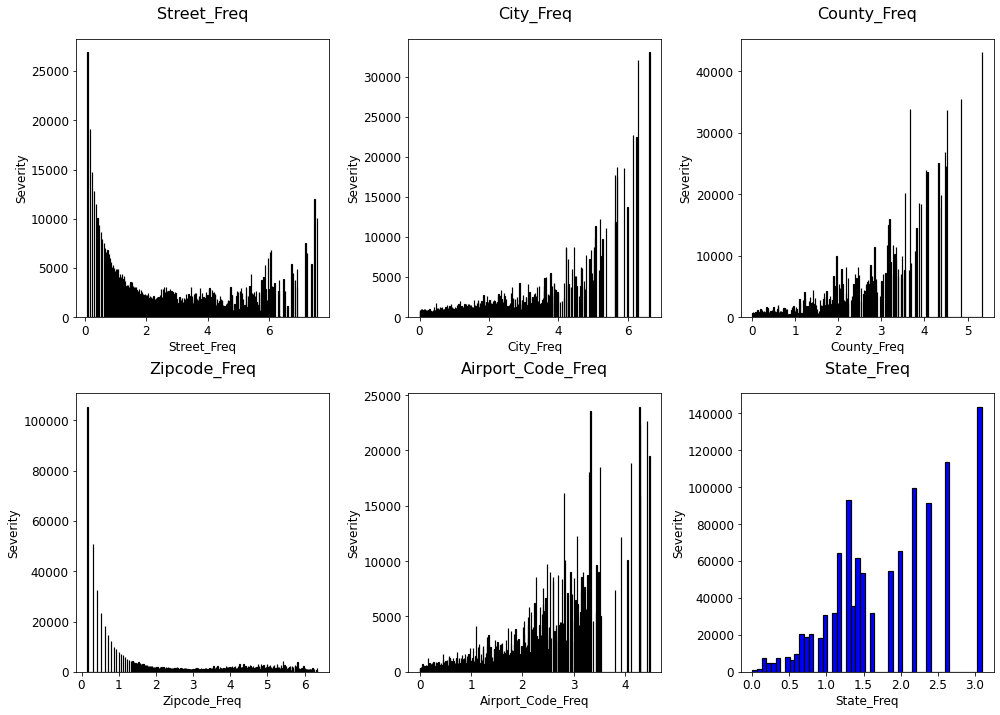

In [146]:
fig, axs = plt.subplots(ncols=2, nrows=3, figsize=(14, 10))
plt.subplots_adjust(hspace=0.4,wspace = 0.2)
for i, feature in enumerate(fre_list, 1): 
    feature = feature + '_Freq'   
    ax = plt.subplot(2, 3, i)
    ax.hist(df[feature], len(df[feature].unique()), histtype='bar', color=["blue"], label=[0,1], edgecolor='black', linewidth=1.2)
    
    plt.xlabel('{}'.format(feature), size=12, labelpad=3)
    plt.ylabel('Severity', size=12, labelpad=3)    
    plt.tick_params(axis='x', labelsize=12)
    plt.tick_params(axis='y', labelsize=12)

    plt.title('{}'.format(feature), size=16, y=1.05)
fig.tight_layout()
plt.show()

In [21]:
df = df.drop('Street', 'City', 'County', 'Zipcode', 'Airport_Code','State')

DataFrame[ID: string, Source: string, TMC: double, Severity: int, Start_Time: timestamp, End_Time: timestamp, Start_Lat: double, Start_Lng: double, End_Lat: double, End_Lng: double, Distance(mi): double, Description: string, Number: double, Side: string, Country: string, Timezone: string, Weather_Timestamp: timestamp, Temperature(F): double, Wind_Chill(F): double, Humidity(%): double, Pressure(in): double, Visibility(mi): double, Wind_Direction: string, Wind_Speed(mph): double, Precipitation(in): double, Weather_Condition: string, Amenity: boolean, Bump: boolean, Crossing: boolean, Give_Way: boolean, Junction: boolean, No_Exit: boolean, Railway: boolean, Roundabout: boolean, Station: boolean, Stop: boolean, Traffic_Calming: boolean, Traffic_Signal: boolean, Turning_Loop: boolean, Sunrise_Sunset: string, Civil_Twilight: string, Nautical_Twilight: string, Astronomical_Twilight: string, Street_Freq: bigint, City_Freq: bigint, County_Freq: bigint, Zipcode_Freq: bigint, Airport_Code_Freq: b

#### Wind Direction

In [537]:
df.head(3)

,Severity,Start_Time,Start_Lat,Start_Lng,Description,Number,Street,Side,City,County,State,Zipcode,Timezone,Airport_Code,Weather_Timestamp,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Direction,Wind_Speed(mph),Precipitation(in),Weather_Condition,Amenity,Bump,Crossing,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Sunrise_Sunset,Duration,Year,Month,Weekday,Day,Hour,Minute,Clear,Cloud,Rain,Heavy_Rain,Snow,Heavy_Snow,Fog,Street_Freq,City_Freq,County_Freq,Zipcode_Freq,Airport_Code_Freq,State_Freq
0,3,2016-02-08 05:46:00,39.865147,-84.058723,Right lane blocked due to accident on I-70 Eas...,NaN,I-70 E,R,Dayton,Montgomery,OH,45424,US/Eastern,KFFO,2016-02-08 05:58:00,36.9,25.4,91.0,29.68,10.0,Calm,9.2,0.02,Light Rain,False,False,False,False,False,False,False,False,False,False,False,False,Night,05:14:00,2016,2,0,39,5,346.0,False,False,True,False,False,False,False,4922,13794,60090,230,5303,50453
1,2,2016-02-08 06:07:59,39.928059,-82.831184,Accident on Brice Rd at Tussing Rd. Expect del...,2584.0,Brice Rd,L,Reynoldsburg,Franklin,OH,43068-3402,US/Eastern,KCMH,2016-02-08 05:51:00,37.9,25.2,100.0,29.65,10.0,Calm,9.2,0.00,Light Rain,False,False,False,False,False,False,False,False,False,False,False,False,Night,00:30:00,2016,2,0,39,6,367.0,False,False,True,False,False,False,False,76,227,12239,3,5938,50453
2,2,2016-02-08 06:49:27,39.063148,-84.032608,Accident on OH-32 State Route 32 Westbound at ...,NaN,State Route 32,R,Williamsburg,Clermont,OH,45176,US/Eastern,KI69,2016-02-08 06:56:00,36.0,33.3,100.0,29.67,10.0,SW,3.5,NaN,Overcast,False,False,False,False,False,False,False,False,False,False,False,True,Night,00:30:00,2016,2,0,39,6,409.0,False,True,False,False,False,False,False,72,603,380,6,508,50453


In [7]:
df = df.withColumn('Wind_Direction', f.when(f.col('Wind_Direction') == 'Calm', 'CALM').otherwise(f.col('Wind_Direction')))
df = df.withColumn('Wind_Direction', f.when(
    ((f.col('Wind_Direction') == 'West') | (f.col('Wind_Direction') == 'WSW') | (f.col('Wind_Direction') == 'WNW')), 
    'W').otherwise(f.col('Wind_Direction')))
df = df.withColumn('Wind_Direction', f.when(
    ((f.col('Wind_Direction') == 'South') | (f.col('Wind_Direction') == 'SSW') | (f.col('Wind_Direction') == 'SSE')), 
    'S').otherwise(f.col('Wind_Direction')))
df = df.withColumn('Wind_Direction', f.when(
    ((f.col('Wind_Direction') == 'North') | (f.col('Wind_Direction') == 'NNW') | (f.col('Wind_Direction') == 'NNE')), 
    'N').otherwise(f.col('Wind_Direction')))
df = df.withColumn('Wind_Direction', f.when(
    ((f.col('Wind_Direction') == 'East') | (f.col('Wind_Direction') == 'ESE') | (f.col('Wind_Direction') == 'ENE')), 
    'E').otherwise(f.col('Wind_Direction')))
df = df.withColumn('Wind_Direction', f.when(f.col('Wind_Direction') == 'Varaible', 'VAR').otherwise(f.col('Wind_Direction')))

In [14]:
np.array(df.select('Wind_Direction').distinct().collect()).flatten()

array(['NW', 'SW', None, 'E', 'NE', 'N', 'W', 'S', 'SE', 'VAR', 'CALM',
       'Variable'], dtype=object)

In [7]:
df = df.withColumn('W', f.when(f.col('Wind_Direction') == 'W', True).otherwise(False))
df.select('W').show(3)

+-----+
|    W|
+-----+
|false|
|false|
|false|
+-----+
only showing top 3 rows



In [9]:
df = df.withColumn('W', f.when(f.col('Wind_Direction') == 'W', True).otherwise(False))
df = df.withColumn('E', f.when(f.col('Wind_Direction') == 'E', True).otherwise(False))
df = df.withColumn('N', f.when(f.col('Wind_Direction') == 'N', True).otherwise(False))
df = df.withColumn('S', f.when(f.col('Wind_Direction') == 'S', True).otherwise(False))
df = df.withColumn('NE', f.when(f.col('Wind_Direction') == 'NE', True).otherwise(False))
df = df.withColumn('NW', f.when(f.col('Wind_Direction') == 'NW', True).otherwise(False))
df = df.withColumn('SE', f.when(f.col('Wind_Direction') == 'SE', True).otherwise(False))
df = df.withColumn('SW', f.when(f.col('Wind_Direction') == 'SW', True).otherwise(False))
df = df.withColumn('VAR', f.when(f.col('Wind_Direction') == 'VAR', True).otherwise(False))

In [12]:
df.select('W','E','N','S','NE','NW','SE','SW','VAR').show(3)

+-----+-----+-----+-----+-----+-----+-----+-----+-----+
|    W|    E|    N|    S|   NE|   NW|   SE|   SW|  VAR|
+-----+-----+-----+-----+-----+-----+-----+-----+-----+
|false|false|false|false|false| true|false|false|false|
|false|false|false|false|false|false| true|false|false|
|false|false|false| true|false|false|false|false|false|
+-----+-----+-----+-----+-----+-----+-----+-----+-----+
only showing top 3 rows



#### Street type

In [21]:
# create a list of top 50 most common words in street name
st_type =' '.join(np.array(df.select('Street').distinct().collect()).flatten)
st_type = re.split(" |-", st_type) # split the long string by space and hyphen
st_type = [x[0] for x in Counter(st_type).most_common(50)] # select the 50 most common words
print('the 50 most common words')
print(*st_type, sep = ", ") 

KeyError: 'Street'

In [23]:
# Remove some irrelevant words and add spaces and hyphen back
st_type= [' Rd', ' St', ' Dr', ' Ave', ' Blvd', ' Ln', ' Highway', ' Pkwy', ' Hwy', 
          ' Way', ' Ct', 'Pl', ' Road', 'US-', 'Creek', ' Cir',  'Route', 
          'I-', 'Trl', 'Pike', ' Fwy']
print(*st_type, sep = ", ")  

 Rd,  St,  Dr,  Ave,  Blvd,  Ln,  Highway,  Pkwy,  Hwy,  Way,  Ct, Pl,  Road, US-, Creek,  Cir, Route, I-, Trl, Pike,  Fwy


In [24]:
# for each word create a boolean column
for i in st_type:
    i = i.strip()
    df = df.withColumn(i, f.when(f.col('Street').rlike(i), True).otherwise(False))
df = df.withColumn('Rd', f.when(f.col('Road') == True, True).otherwise(f.col('Rd')))
df = df.withColumn('Hwy', f.when(f.col('Highway') == True, True).otherwise(f.col('Hwy')))

In [25]:
df.select('Rd', 'St', 'Dr', 'Ave', 'Blvd', 'Ln', 'Highway', 'Pkwy', 'Hwy', 
          'Way', 'Ct', 'Pl', 'Road', 'US-', 'Creek', 'Cir',  'Route', 
          'I-', 'Trl', 'Pike', 'Fwy').show(3)

+-----+-----+-----+-----+-----+-----+-------+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+
|   Rd|   St|   Dr|  Ave| Blvd|   Ln|Highway| Pkwy|  Hwy|  Way|   Ct|   Pl| Road|  US-|Creek|  Cir|Route|   I-|  Trl| Pike|  Fwy|
+-----+-----+-----+-----+-----+-----+-------+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+
|false| true|false|false|false|false|  false|false|false|false|false|false|false|false|false|false|false|false|false|false|false|
|false|false|false| true|false|false|  false|false|false|false|false|false|false|false|false|false|false|false|false|false|false|
|false| true|false|false|false|false|  false|false|false|false|false|false|false|false|false|false|false|false|false|false|false|
+-----+-----+-----+-----+-----+-----+-------+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+
only showing top 3 rows



#### Data integration

In [551]:
df = df_traffic.join(df_weather, on=['City', 'State', 'Weather_Timestamp'], how = 'left')


NameError: name 'df_traffic' is not defined

In [552]:
df = df_traffic.join(df_weather, on=['City', 'State', 'Weather_Timestamp'], how = 'left')
df.toPandas().head(3)

,Severity,Start_Time,Start_Lat,Start_Lng,Description,Number,Street,Side,City,County,State,Zipcode,Timezone,Airport_Code,Weather_Timestamp,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Direction,Wind_Speed(mph),Precipitation(in),Weather_Condition,Amenity,Bump,Crossing,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Sunrise_Sunset,Duration,Year,Month,Weekday,Day,Hour,Minute,Clear,Cloud,Rain,Heavy_Rain,Snow,Heavy_Snow,Fog,Street_Freq,City_Freq,County_Freq,Zipcode_Freq,Airport_Code_Freq,State_Freq,W,E,N,S,NE,NW,SE,SW,VAR,Rd,St,Dr,Ave,Blvd,Ln,Highway,Pkwy,Hwy,Way,Ct,Pl,Road,US-,Creek,Cir,Route,I-,Trl,Pike,Fwy
0,3,2016-02-08 05:46:00,39.865147,-84.058723,Right lane blocked due to accident on I-70 Eas...,NaN,I-70 E,R,Dayton,Montgomery,OH,45424,US/Eastern,KFFO,2016-02-08 05:58:00,36.9,25.4,91.0,29.68,10.0,CALM,9.2,0.02,Light Rain,False,False,False,False,False,False,False,False,False,False,False,False,Night,05:14:00,2016,2,0,39,5,346.0,False,False,True,False,False,False,False,4922,13794,60090,230,5303,50453,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False
1,2,2016-02-08 06:07:59,39.928059,-82.831184,Accident on Brice Rd at Tussing Rd. Expect del...,2584.0,Brice Rd,L,Reynoldsburg,Franklin,OH,43068-3402,US/Eastern,KCMH,2016-02-08 05:51:00,37.9,25.2,100.0,29.65,10.0,CALM,9.2,0.00,Light Rain,False,False,False,False,False,False,False,False,False,False,False,False,Night,00:30:00,2016,2,0,39,6,367.0,False,False,True,False,False,False,False,76,227,12239,3,5938,50453,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,2,2016-02-08 06:49:27,39.063148,-84.032608,Accident on OH-32 State Route 32 Westbound at ...,NaN,State Route 32,R,Williamsburg,Clermont,OH,45176,US/Eastern,KI69,2016-02-08 06:56:00,36.0,33.3,100.0,29.67,10.0,SW,3.5,NaN,Overcast,False,False,False,False,False,False,False,False,False,False,False,True,Night,00:30:00,2016,2,0,39,6,409.0,False,True,False,False,False,False,False,72,603,380,6,508,50453,True,False,False,True,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False


In [15]:
df_traffic.select('Weather_Timestamp', 'State', 'City').show(3)

+--------------------+-----+------------+
|   Weather_Timestamp|State|        City|
+--------------------+-----+------------+
|2020-06-04 02:53:...|   CA|   Pittsburg|
|2017-04-27 21:15:...|   PA|Sellersville|
|2020-03-19 09:42:...|   AL|  Cottondale|
+--------------------+-----+------------+
only showing top 3 rows



In [19]:
df_weather.select('Weather_Timestamp', 'State', 'City').show(3)

+--------------------+-----+---------+
|   Weather_Timestamp|State|     City|
+--------------------+-----+---------+
|2017-06-05 18:51:...|   MI| Hesperia|
|2020-06-10 18:53:...|   MI|Caledonia|
|2020-12-27 22:53:...|   FL| Seminole|
+--------------------+-----+---------+
only showing top 3 rows



In [14]:
df.toPandas()

+---------+--------+-----+--------+--------------------+--------------------+------------------+----------+------------------+---------+------------+--------------------+------+----------+----+------------+------------+-----+----------+-------+----------+------------+--------------------+--------------+-------------+-----------+------------+--------------+--------------+---------------+-----------------+-----------------+-------+-----+--------+--------+--------+-------+-------+----------+-------+-----+---------------+--------------+------------+--------------+--------------+-----------------+---------------------+
|       ID|  Source|  TMC|Severity|          Start_Time|            End_Time|         Start_Lat| Start_Lng|           End_Lat|  End_Lng|Distance(mi)|         Description|Number|    Street|Side|        City|      County|State|   Zipcode|Country|  Timezone|Airport_Code|   Weather_Timestamp|Temperature(F)|Wind_Chill(F)|Humidity(%)|Pressure(in)|Visibility(mi)|Wind_Direction|Wind_

In [553]:
df.to_csv("US_Accidents_Dec20_Updated.csv", index = None)

In [39]:
df = pd.read_csv("US_Accidents_Dec20.csv")
df.head(3)
df["Side"].value_counts()

R    3467079
L     765461
           1
Name: Side, dtype: int64

#### Data format

In [23]:
df = spark.read.csv('US_Accidents_Dec20.csv',inferSchema=True,header=True)

In [26]:
df.schema["Weekday"]

StructField(Weekday,StringType,true)

In [16]:
for day in range(1,8):
    weekday = 'Weekday_' + str(day)
    df = df.withColumn(weekday, f.when(f.col('Weekday') == str(day), 1).otherwise(0))

In [34]:
df.schema["Severity"].dataType

IntegerType

In [31]:
for c in df.columns:
    if isinstance(df.schema[c].dataType, BooleanType):
        df = df.withColumn(c, f.col(c).cast('integer'))

In [30]:
for c in df.columns:
    if isinstance(df.schema[c].dataType, BooleanType):
        df = df.withColumn(c, f.col(c).cast('integer'))

for day in range(1,8):
    weekday = 'Weekday_' + str(day)
    df = df.withColumn(weekday, f.when(f.col('Weekday') == str(day), 1).otherwise(0))
    
df = df.withColumn('Side', f.when(f.col('Side') == 'L', '1').otherwise('0')).withColumn('Side', f.col('Side').cast('integer'))

for zone in ['US/Central', 'US/Mountain', 'US/Eastern', 'US/Pacific']:
    time_zone = 'Timezone_' + zone
    df = df.withColumn(time_zone, f.when(f.col('Timezone') == zone, 1).otherwise(0))

for month in range(1,13):
    month_col = 'Month_' + str(month)
    df = df.withColumn(month_col, f.when(f.col('Month') == month, 1).otherwise(0))

AnalysisException: "cannot resolve '`Weekday`' given input columns: [Country, Station, Visibility(mi), Dr, Turning_Loop, Roundabout, Trl, End_Lat, Traffic_Signal, ID, Astronomical_Twilight, Weather_Timestamp, Wind_Speed(mph), Traffic_Calming, Timezone, Number, Description, Hwy, St, Zipcode, Pkwy, Fwy, Start_Lng, Weather_Condition, Junction, Amenity, Ct, Ln, Blvd, No_Exit, Cir, Wind_Direction, Precipitation(in), Side, Nautical_Twilight, Street, Pressure(in), Rd, Airport_Code, Route, I-, TMC, Wind_Chill(F), Railway, Road, Pike, Humidity(%), Sunrise_Sunset, End_Lng, Way, Ave, Highway, Start_Lat, City, Severity, Bump, Creek, Civil_Twilight, US-, Stop, County, Crossing, Temperature(F), Pl, End_Time, Source, State, Distance(mi), Give_Way];;\n'Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 46 more fields]\n+- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 45 more fields]\n   +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 45 more fields]\n      +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 45 more fields]\n         +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 45 more fields]\n            +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 45 more fields]\n               +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 45 more fields]\n                  +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 45 more fields]\n                     +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 45 more fields]\n                        +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 45 more fields]\n                           +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 45 more fields]\n                              +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 45 more fields]\n                                 +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 45 more fields]\n                                    +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 45 more fields]\n                                       +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 45 more fields]\n                                          +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 45 more fields]\n                                             +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 45 more fields]\n                                                +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 45 more fields]\n                                                   +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 45 more fields]\n                                                      +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 45 more fields]\n                                                         +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 45 more fields]\n                                                            +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 45 more fields]\n                                                               +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 45 more fields]\n                                                                  +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 45 more fields]\n                                                                     +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 45 more fields]\n                                                                        +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 45 more fields]\n                                                                           +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 45 more fields]\n                                                                              +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 45 more fields]\n                                                                                 +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 45 more fields]\n                                                                                    +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 45 more fields]\n                                                                                       +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 45 more fields]\n                                                                                          +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 45 more fields]\n                                                                                             +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 45 more fields]\n                                                                                                +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 45 more fields]\n                                                                                                   +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 45 more fields]\n                                                                                                      +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 45 more fields]\n                                                                                                         +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 45 more fields]\n                                                                                                            +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 45 more fields]\n                                                                                                               +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 44 more fields]\n                                                                                                                  +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 43 more fields]\n                                                                                                                     +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 42 more fields]\n                                                                                                                        +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 41 more fields]\n                                                                                                                           +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 40 more fields]\n                                                                                                                              +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 39 more fields]\n                                                                                                                                 +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 38 more fields]\n                                                                                                                                    +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 37 more fields]\n                                                                                                                                       +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 36 more fields]\n                                                                                                                                          +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 35 more fields]\n                                                                                                                                             +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 34 more fields]\n                                                                                                                                                +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 33 more fields]\n                                                                                                                                                   +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 32 more fields]\n                                                                                                                                                      +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 31 more fields]\n                                                                                                                                                         +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 30 more fields]\n                                                                                                                                                            +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 29 more fields]\n                                                                                                                                                               +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 28 more fields]\n                                                                                                                                                                  +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 27 more fields]\n                                                                                                                                                                     +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 26 more fields]\n                                                                                                                                                                        +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 25 more fields]\n                                                                                                                                                                           +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 24 more fields]\n                                                                                                                                                                              +- Filter (cast(Start_Time#4 as string) < 2019-01-01)\n                                                                                                                                                                                 +- Project [ID#0, Source#1, TMC#2, Severity#3, End_Time#5, Start_Lat#6, Start_Lng#7, End_Lat#8, End_Lng#9, Distance(mi)#10, Description#11, Number#12, Street#13, Side#14, City#15, County#16, State#17, Zipcode#18, Country#19, Timezone#20, Airport_Code#21, Weather_Timestamp#22, Temperature(F)#23, Wind_Chill(F)#24, ... 25 more fields]\n                                                                                                                                                                                    +- Filter (cast(Start_Time#4 as string) < 2019-01-01)\n                                                                                                                                                                                       +- Relation[ID#0,Source#1,TMC#2,Severity#3,Start_Time#4,End_Time#5,Start_Lat#6,Start_Lng#7,End_Lat#8,End_Lng#9,Distance(mi)#10,Description#11,Number#12,Street#13,Side#14,City#15,County#16,State#17,Zipcode#18,Country#19,Timezone#20,Airport_Code#21,Weather_Timestamp#22,Temperature(F)#23,... 25 more fields] csv\n"

In [33]:
df.select('Timezone_US/Eastern','Timezone_US/Pacific',
          'Weekday_1','Weekday_2','Weekday_3','Weekday_4','Weekday_5','Weekday_6','Weekday_7',
          'Month_1','Month_2','Month_3','Month_4','Month_5','Month_6','Month_7','Month_8').show(5)

+-------------------+-------------------+---------+---------+---------+---------+---------+---------+---------+-------+-------+-------+-------+-------+-------+-------+-------+
|Timezone_US/Eastern|Timezone_US/Pacific|Weekday_1|Weekday_2|Weekday_3|Weekday_4|Weekday_5|Weekday_6|Weekday_7|Month_1|Month_2|Month_3|Month_4|Month_5|Month_6|Month_7|Month_8|
+-------------------+-------------------+---------+---------+---------+---------+---------+---------+---------+-------+-------+-------+-------+-------+-------+-------+-------+
|                  0|                  1|        0|        0|        0|        1|        0|        0|        0|      0|      0|      0|      0|      0|      1|      0|      0|
|                  1|                  0|        0|        0|        0|        1|        0|        0|        0|      0|      0|      0|      1|      0|      0|      0|      0|
|                  0|                  0|        0|        0|        0|        1|        0|        0|        0|      0| 

### Data Transformation

#### Data reduction

#### Reduce severity number of categories

In [41]:
df = df.withColumn('Severity', f.when(f.col('Severity') == 4, 1).otherwise(0))
df.groupBy('Severity').count().show()

+--------+-------+
|Severity|count  |
+--------+-------+
|1       |8973   |
|0       |2588610|
+--------+-------+



In [41]:
from pyspark.sql.types import StructType,StructField, StringType, IntegerType
data2 = [
    (1,8973),
    (0,2588610),
  ]

schema = StructType([
    StructField("Severity",IntegerType(),True),
    StructField("count",IntegerType(),True)
  ])
 
df_table = spark.createDataFrame(data=data2,schema=schema)
df_table.show(truncate=False)

+--------+-------+
|Severity|count  |
+--------+-------+
|1       |8973   |
|0       |2588610|
+--------+-------+



In [35]:
df.withColumn('Severity', f.when(f.col('Severity') == 4, 1).otherwise(0)).groupBy('Severity').count().show()

+--------+------+
|Severity| count|
+--------+------+
|       1|  6189|
|       0|205438|
+--------+------+



In [7]:
df['Severity'] = np.where(df['Severity']==4, 1, 0)
df['Severity'].value_counts()

0    2588610
1       8973
Name: Severity, dtype: int64

#### Filter out earlier years

In [135]:
year = [x['Year'].value_counts() for _, x in df[["Severity","Year"]].groupby(['Severity'])]
df_year = pd.DataFrame(year).transpose()
df_year.columns = [0,1]

df_year = df_year.sort_index(ascending = False)
df_year

,0,1
2020,434956,4344
2019,657551,3568
2018,696717,536
2017,525651,372
2016,273735,153


In [55]:
df.groupBy('Year','Severity').count().orderBy('Year', ascending = False).groupBy('Severity').pivot('Year').sum("count").show()

+--------+-----+-----+-----+-----+-----+
|Severity| 2016| 2017| 2018| 2019| 2020|
+--------+-----+-----+-----+-----+-----+
|       1|  721| 1212| 1279| 1387| 1590|
|       0|19832|34592|43194|46320|61500|
+--------+-----+-----+-----+-----+-----+



In [56]:
np.array(df.groupBy('Year','Severity').count().groupBy('Severity').pivot('Year').sum("count").orderBy('Severity').collect())

array([[    0, 19832, 34592, 43194, 46320, 61500],
       [    1,   721,  1212,  1279,  1387,  1590]])

In [57]:
np.flip(np.array(df.groupBy('Year','Severity').count().groupBy('Severity').pivot('Year').sum("count").orderBy('Severity').collect()), 1)

array([[61500, 46320, 43194, 34592, 19832,     0],
       [ 1590,  1387,  1279,  1212,   721,     1]])

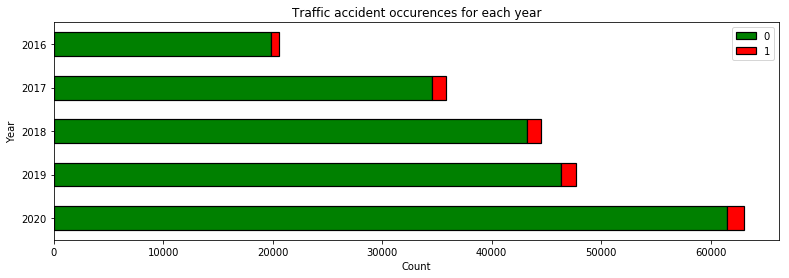

In [59]:
df_dn = np.flip(np.array(df.groupBy('Year','Severity').count().groupBy('Severity').pivot('Year').sum("count").orderBy('Severity').collect()), 1)
labels = ['2020', '2019','2018','2017','2016']
colors = ['green', 'red']
left = np.array([0,0,0,0,0])

fig, ax = plt.subplots(figsize=(13,4))
for i in range(len(df_dn)):
    ax.barh(labels, df_dn[i,:-1], color=colors[i], left = left, label = df_dn[i,-1], height = 0.55, \
        edgecolor='black', linewidth=1.2)
    left = left + np.array(df_dn[i,:-1])
ax.set_title('Traffic accident occurences for each year')
ax.set_ylabel('Year')
ax.set_xlabel('Count')
ax.legend()

Text(0.5, 0, 'Count')

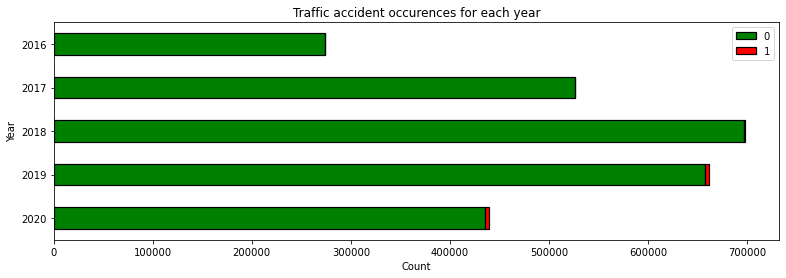

In [136]:
df_dn = np.flip(np.array(df.groupBy('Year','Severity').count().groupBy('Severity').pivot('Year').sum("count").orderBy('Severity').collect()), 1)
labels = ['2020', '2019','2018','2017','2016']
colors = ['green', 'red']
left = np.array([0,0,0,0,0])

fig, ax = plt.subplots(figsize=(13,4))
for i in range(len(df_dn)):
    ax.barh(labels, df_dn[i,:-1], color=colors[i], left = left, label = df_dn[i,-1], height = 0.55, \
        edgecolor='black', linewidth=1.2)
    left = left + np.array(df_dn[i,:-1])
ax.set_title('Traffic accident occurences for each year')
ax.set_ylabel('Year')
ax.set_xlabel('Count')
ax.legend()

In [14]:
df = df.filter(f.col('Start_Time')<"2019-01-01")
df = df.drop('Year', 'Start_Time')
df.groupBy('Severity').count().show()

+--------+-------+
|Severity|count  |
+--------+-------+
|1       |7912   |
|0       |1092507|
+--------+-------+



In [ ]:
df = df.drop('Street','City','Country','Zipcode','Airport_Code','State')
df = df.drop('Start_Time', 'Month','Wind_Direction','Duration','Weather_Condition','Weekday')

In [139]:
df['Sunrise_Sunset'] = df['Sunrise_Sunset'].replace(["Day", "Night"], [1,0])
df['Sunrise_Sunset'].value_counts()

1    814453
0    285966
Name: Sunrise_Sunset, dtype: int64

In [285]:
def resample(dat, col, n, class_ratio = {1:0.5, 0: 1}, replace = {1:True, 0: False} ):
    return pd.concat([dat[dat[col]==1].sample(round(n*class_ratio[1]), replace = replace[1]),
                   dat[dat[col]==0].sample(round(n*class_ratio[0]), replace = replace[0])], axis=0)

In [34]:
np.array(df.select('Severity').collect()).flatten()

array([1, 1, 1, ..., 4, 4, 4])

In [50]:
def heatmap(data, row_labels, col_labels, ax=None,
            cbar_kw={}, cbarlabel="", **kwargs):
    """
    Create a heatmap from a numpy array and two lists of labels.

    Parameters
    ----------
    data
        A 2D numpy array of shape (N, M).
    row_labels
        A list or array of length N with the labels for the rows.
    col_labels
        A list or array of length M with the labels for the columns.
    ax
        A `matplotlib.axes.Axes` instance to which the heatmap is plotted.  If
        not provided, use current axes or create a new one.  Optional.
    cbar_kw
        A dictionary with arguments to `matplotlib.Figure.colorbar`.  Optional.
    cbarlabel
        The label for the colorbar.  Optional.
    **kwargs
        All other arguments are forwarded to `imshow`.
    """

    if not ax:
        ax = plt.gca()

    # Plot the heatmap
    im = ax.imshow(data, **kwargs)
    im.set_clim(0,200000)

    # Create colorbar
    cbar = ax.figure.colorbar(im, ax=ax, orientation="vertical", fraction=0.6, shrink=0.5, **cbar_kw)
    cbar.ax.set_ylabel(cbarlabel, rotation=0, va="bottom")

    # We want to show all ticks...
    ax.set_xticks(np.arange(data.shape[1]))
    ax.set_yticks(np.arange(data.shape[0]))
    # ... and label them with the respective list entries.
    ax.set_xticklabels(col_labels)
    ax.set_yticklabels(row_labels)

    # Let the horizontal axes labeling appear on top.
    ax.tick_params(top=True, bottom=False,
                   labeltop=True, labelbottom=False)


    # Turn spines off and create white grid.
    ax.spines['bottom'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['right'].set_visible(False)

    ax.set_xticks(np.arange(data.shape[1]+1)-.5, minor=True)
    ax.set_yticks(np.arange(data.shape[0]+1)-.5, minor=True)
    ax.grid(which="minor", color="w", linestyle='-', linewidth=3)
    ax.tick_params(which="minor", bottom=False, left=False)

    return im, cbar


def annotate_heatmap(im, data=None, valfmt="{x:.2f}",
                     textcolors=("black", "white"),
                     threshold=None, **textkw):
    """
    A function to annotate a heatmap.

    Parameters
    ----------
    im
        The AxesImage to be labeled.
    data
        Data used to annotate.  If None, the image's data is used.  Optional.
    valfmt
        The format of the annotations inside the heatmap.  This should either
        use the string format method, e.g. "$ {x:.2f}", or be a
        `matplotlib.ticker.Formatter`.  Optional.
    textcolors
        A pair of colors.  The first is used for values below a threshold,
        the second for those above.  Optional.
    threshold
        Value in data units according to which the colors from textcolors are
        applied.  If None (the default) uses the middle of the colormap as
        separation.  Optional.
    **kwargs
        All other arguments are forwarded to each call to `text` used to create
        the text labels.
    """

    if not isinstance(data, (list, np.ndarray)):
        data = im.get_array()

    # Normalize the threshold to the images color range.
    if threshold is not None:
        threshold = im.norm(threshold)
    else:
        threshold = im.norm(data.max())/2.

    # Set default alignment to center, but allow it to be
    # overwritten by textkw.
    kw = dict(horizontalalignment="center",
              verticalalignment="center")
    kw.update(textkw)

    # Get the formatter in case a string is supplied
    if isinstance(valfmt, str):
        valfmt = matplotlib.ticker.StrMethodFormatter(valfmt)

    # Loop over the data and create a `Text` for each "pixel".
    # Change the text's color depending on the data.
    texts = []
    for i in range(data.shape[0]):
        for j in range(data.shape[1]):
            kw.update(color=textcolors[int(im.norm(data[i, j]) > threshold)])
            text = im.axes.text(j, i, valfmt(data[i, j], None), **kw)
            texts.append(text)

    return texts

In [146]:
road_sev = ['Severity','Rd','St','Dr','Ave','Blvd','Ln','Highway','Pkwy','Hwy','Way','Ct','Pl','Road','US-','Creek','Cir','Route','I-','Trl','Pike','Fwy']

np.array([[df.corr('Severity', x ,'pearson') for x in road_sev]])

array([[ 1.        , -0.12829058, -0.10104427, -0.09928353, -0.09058819,
        -0.05593128, -0.05388795,  0.00495024, -0.03501395, -0.00953985,
        -0.03601447, -0.02536959, -0.02301808,  0.01704636,  0.01888154,
        -0.02896271, -0.01567251,  0.01888213,  0.33283664, -0.01490496,
        -0.0174481 ,  0.04823075]])

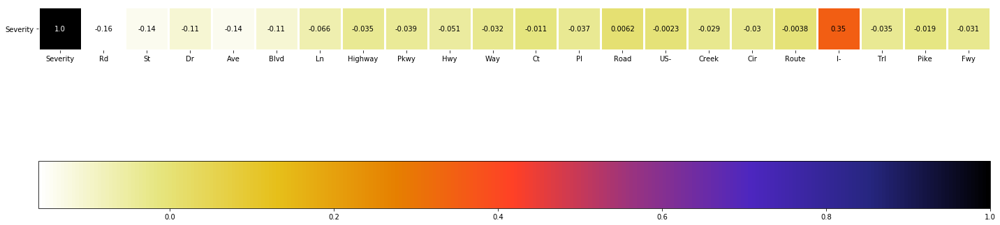

In [145]:
y = ['Severity']
roads = ['Severity','Rd','St','Dr','Ave','Blvd','Ln','Highway','Pkwy','Hwy','Way','Ct','Pl','Road','US-','Creek','Cir','Route','I-','Trl','Pike','Fwy']

data = np.array([[df.corr('Severity', x ,'pearson') for x in roads]])

fig, ax = plt.subplots(figsize=(20,15))

im, cbar = heatmap(data, y, x, ax=ax, cmap="CMRmap_r")
texts = annotate_heatmap(im, valfmt="{x}")

fig.tight_layout()
plt.show()

ValueError: Colormap BuRd is not recognized. Possible values are: Accent, Accent_r, Blues, Blues_r, BrBG, BrBG_r, BuGn, BuGn_r, BuPu, BuPu_r, CMRmap, CMRmap_r, Dark2, Dark2_r, GnBu, GnBu_r, Greens, Greens_r, Greys, Greys_r, OrRd, OrRd_r, Oranges, Oranges_r, PRGn, PRGn_r, Paired, Paired_r, Pastel1, Pastel1_r, Pastel2, Pastel2_r, PiYG, PiYG_r, PuBu, PuBuGn, PuBuGn_r, PuBu_r, PuOr, PuOr_r, PuRd, PuRd_r, Purples, Purples_r, RdBu, RdBu_r, RdGy, RdGy_r, RdPu, RdPu_r, RdYlBu, RdYlBu_r, RdYlGn, RdYlGn_r, Reds, Reds_r, Set1, Set1_r, Set2, Set2_r, Set3, Set3_r, Spectral, Spectral_r, Wistia, Wistia_r, YlGn, YlGnBu, YlGnBu_r, YlGn_r, YlOrBr, YlOrBr_r, YlOrRd, YlOrRd_r, afmhot, afmhot_r, autumn, autumn_r, binary, binary_r, bone, bone_r, brg, brg_r, bwr, bwr_r, cividis, cividis_r, cool, cool_r, coolwarm, coolwarm_r, copper, copper_r, cubehelix, cubehelix_r, flag, flag_r, gist_earth, gist_earth_r, gist_gray, gist_gray_r, gist_heat, gist_heat_r, gist_ncar, gist_ncar_r, gist_rainbow, gist_rainbow_r, gist_stern, gist_stern_r, gist_yarg, gist_yarg_r, gnuplot, gnuplot2, gnuplot2_r, gnuplot_r, gray, gray_r, hot, hot_r, hsv, hsv_r, inferno, inferno_r, jet, jet_r, magma, magma_r, nipy_spectral, nipy_spectral_r, ocean, ocean_r, pink, pink_r, plasma, plasma_r, prism, prism_r, rainbow, rainbow_r, seismic, seismic_r, spring, spring_r, summer, summer_r, tab10, tab10_r, tab20, tab20_r, tab20b, tab20b_r, tab20c, tab20c_r, terrain, terrain_r, viridis, viridis_r, winter, winter_r

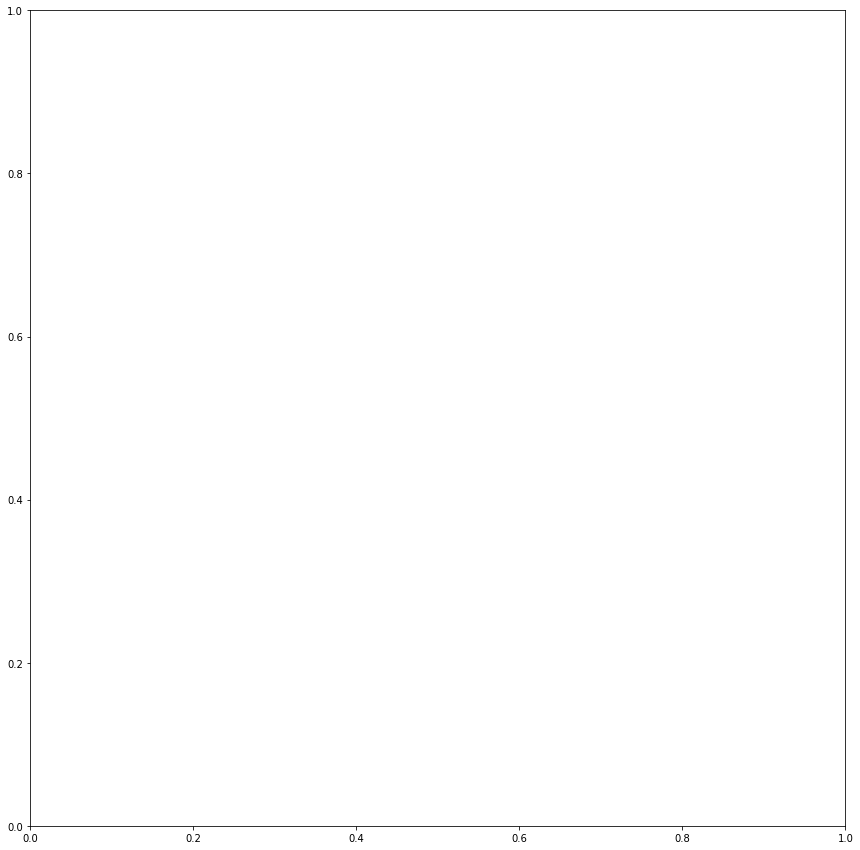

In [134]:
fig, ax = plt.subplots(figsize=(20,15))

im, cbar = heatmap(harvest, vegetables, farmers, ax=ax, cmap="CMRmap")
texts = annotate_heatmap(im, valfmt="{x}")

fig.tight_layout()
plt.show()

In [86]:
str([float(x) for x in "-0.015 -0.11 -0.082 \
-0.05 -0.072 \
1 \
-0.028 -0.033 -0.037 -0.053 -0.017 -0.012 0.011 0.017 0.029 -0.0024 0.012 0.017 0.13".split()])

'[-0.02, -0.15, -0.11, -0.071, 1.0, -0.072, -0.037, -0.043, -0.047, -0.07, -0.022, -0.016, -0.018, -0.023, -0.038, -0.022, -0.015, -0.022, -0.17, -0.017, -0.026, -0.053]'

In [133]:
harvest = np.array([[1,-0.16,-0.14,-0.11,-0.14,-0.11,-0.066,-0.035,-0.039,-0.051,-0.032,-0.011,-0.037,0.0062,-0.0023,-0.029,-0.03,-0.0038,0.35,-0.035,-0.019,-0.031]])
harvest.shape

(1, 22)

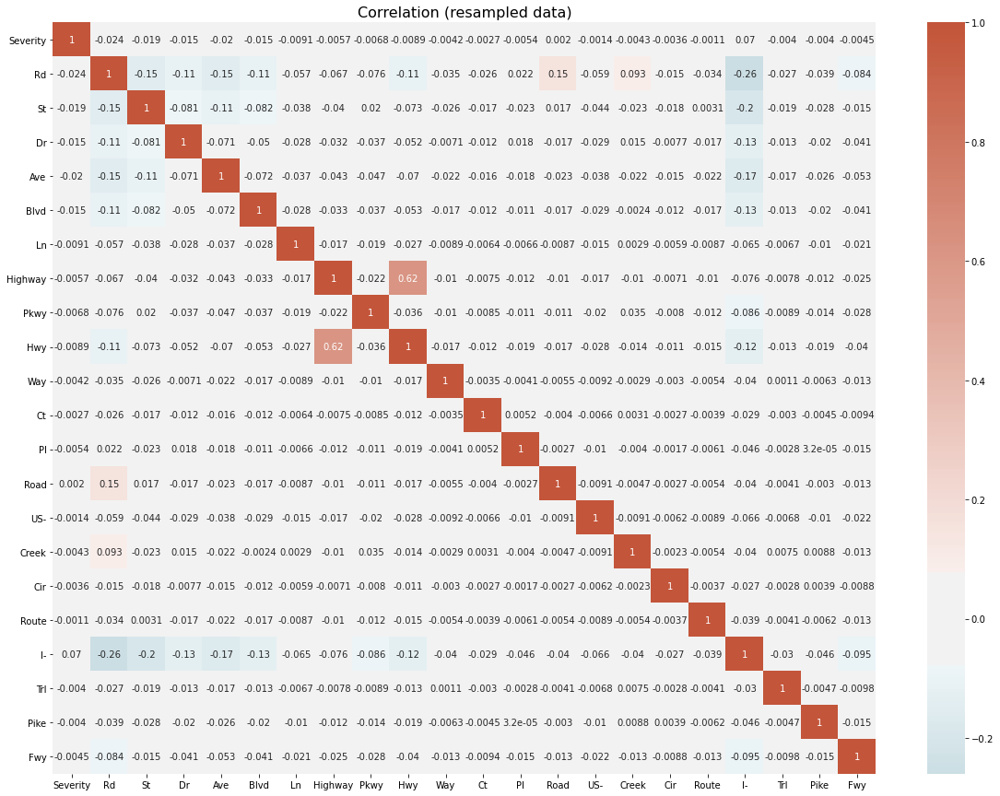

In [23]:
df['Severity'] = df['Severity'].astype(int)
street_corr  = df.loc[:,['Severity']+[x.strip() for x in st_type]].corr()
plt.figure(figsize=(20,15))
cmap = sns.diverging_palette(220, 20, sep=20, as_cmap=True)
sns.heatmap(street_corr, annot=True, cmap=cmap, center=0).set_title("Correlation (resampled data)", fontsize=16)
plt.show()

In [24]:
df.head(3)

,Severity,Start_Lat,Start_Lng,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),Precipitation(in),Amenity,Bump,Crossing,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Sunrise_Sunset,Minute,Clear,Cloud,Rain,Heavy_Rain,Snow,Heavy_Snow,Fog,Street_Freq,City_Freq,County_Freq,Zipcode_Freq,Airport_Code_Freq,State_Freq,W,E,N,S,NE,NW,SE,SW,VAR,Rd,St,Dr,Ave,Blvd,Ln,Highway,Pkwy,Hwy,Way,Ct,Pl,Road,US-,Creek,Cir,Route,I-,Trl,Pike,Fwy,Side_,Side_L,Side_R,Timezone_US/Central,Timezone_US/Eastern,Timezone_US/Mountain,Timezone_US/Pacific,Weekday_0,Weekday_1,Weekday_2,Weekday_3,Weekday_4,Weekday_5,Weekday_6,Month_1,Month_2,Month_3,Month_4,Month_5,Month_6,Month_7,Month_8,Month_9,Month_10,Month_11,Month_12
496616,0,43.207451,-78.650032,32.0,23.0,64.0,29.56,10.0,13.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,1,647.0,0,1,0,0,0,0,0,1,158,475,1,663,125252,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
496617,0,43.030651,-78.875862,34.0,27.0,67.0,29.59,10.0,9.0,0.0,0,0,0,0,0,0,0,0,0,0,0,1,1,804.0,0,1,0,0,0,0,0,2,86,475,1,663,125252,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
496618,0,42.550568,-79.108765,37.0,30.0,54.0,29.50,10.0,9.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,1,809.0,0,0,0,0,0,0,0,4049,14,441,10,392,125252,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


In [141]:
df['Precipitation_NA'] = 0
df.loc[df['Precipitation(in)'].isnull(),'Precipitation_NA'] = 1
df['Precipitation(in)'] = df['Precipitation(in)'].fillna(df['Precipitation(in)'].median())
df.loc[:5,['Precipitation(in)','Precipitation_NA']]

,Precipitation(in),Precipitation_NA


In [142]:
df['Precipitation_NA'].value_counts()

0    937405
1    163014
Name: Precipitation_NA, dtype: int64

In [143]:
fre_list = ['Street', 'City', 'County', 'Zipcode', 'Airport_Code','State']
for i in fre_list:
    newname = i + '_Freq'
    df[newname] = df[newname]/df.shape[0]*df[i].unique().size
    df[newname] = df[newname].apply(lambda x: np.log(x+1))

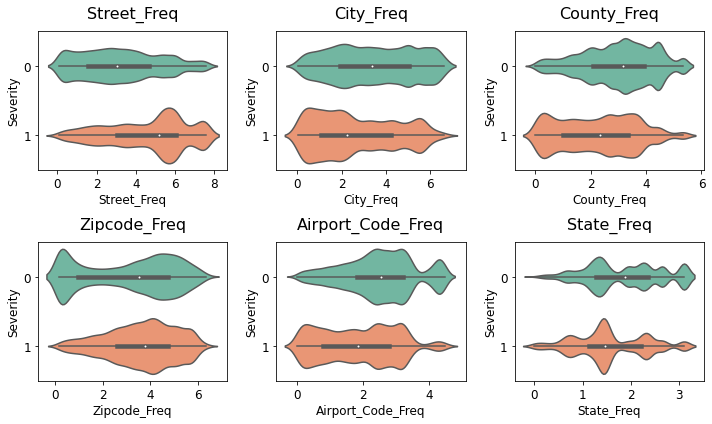

In [343]:
fre_list = ['Street', 'City', 'County', 'Zipcode', 'Airport_Code','State']
df_bl = resample(df, 'Severity', 20000)

df_bl['Severity'] = df_bl['Severity'].astype('category')
fig, axs = plt.subplots(ncols=2, nrows=3, figsize=(10, 6))
plt.subplots_adjust(hspace=0.4,wspace = 0.2)
for i, feature in enumerate(fre_list, 1): 
    feature = feature + '_Freq'   
    plt.subplot(2, 3, i)
    sns.violinplot(x=feature, y="Severity", data=df_bl, palette="Set2")
    
    plt.xlabel('{}'.format(feature), size=12, labelpad=3)
    plt.ylabel('Severity', size=12, labelpad=3)    
    plt.tick_params(axis='x', labelsize=12)
    plt.tick_params(axis='y', labelsize=12)

    plt.title('{}'.format(feature), size=16, y=1.05)
fig.tight_layout()
plt.show()

In [147]:
df.to_csv("US_Accidents_Dec20_Updated_2.csv", index = None)

In [18]:
df = df.drop(['Street', 'City', 'County', 'Zipcode', 'Airport_Code','State'], axis = 1)

In [19]:
df = df.drop(['Wind_Direction', 'Duration', 'Weather_Condition'], axis = 1)

In [20]:
df = df.drop(['Description', 'Number', 'Weather_Timestamp', 'Day', 'Hour'], axis = 1)

In [81]:
df_sample = resample(df, 'Severity', 20000)

In [ ]:
from sklearn.datasets import make_friedman1
from sklearn.feature_selection import RFE
from sklearn.svm import SVR
X, y = df_sample.drop(['Severity'], axis = 1), df['Severity']
estimator = RandomForestClassifier(n_estimators = 100, n_jobs = -1, criterion = "gini", max_depth = 15, class_weight = {1:1.5, 0:1})
selector = RFE(estimator, n_features_to_select=5, step=1)
selector = selector.fit(X, y)
display(selector.support_)
display(selector.ranking_)

In [151]:
audit_fields = df.isna().sum()
audit_fields = audit_fields.to_frame()
audit_fields.columns = ['Missing values']
audit_fields

,Missing values
Severity,0
Start_Lat,0
Start_Lng,0
Temperature(F),0
Wind_Chill(F),437
...,...
Month_9,0
Month_10,0
Month_11,0
Month_12,0


In [33]:
df['Severity'].value_counts()

0    1092074
1       7908
Name: Severity, dtype: int64

In [27]:
df = df.dropna(subset = ['Wind_Chill(F)'])

In [40]:
df.shape

(1099982, 93)

In [64]:
df_bl = resample(df, 'Severity', 20000)

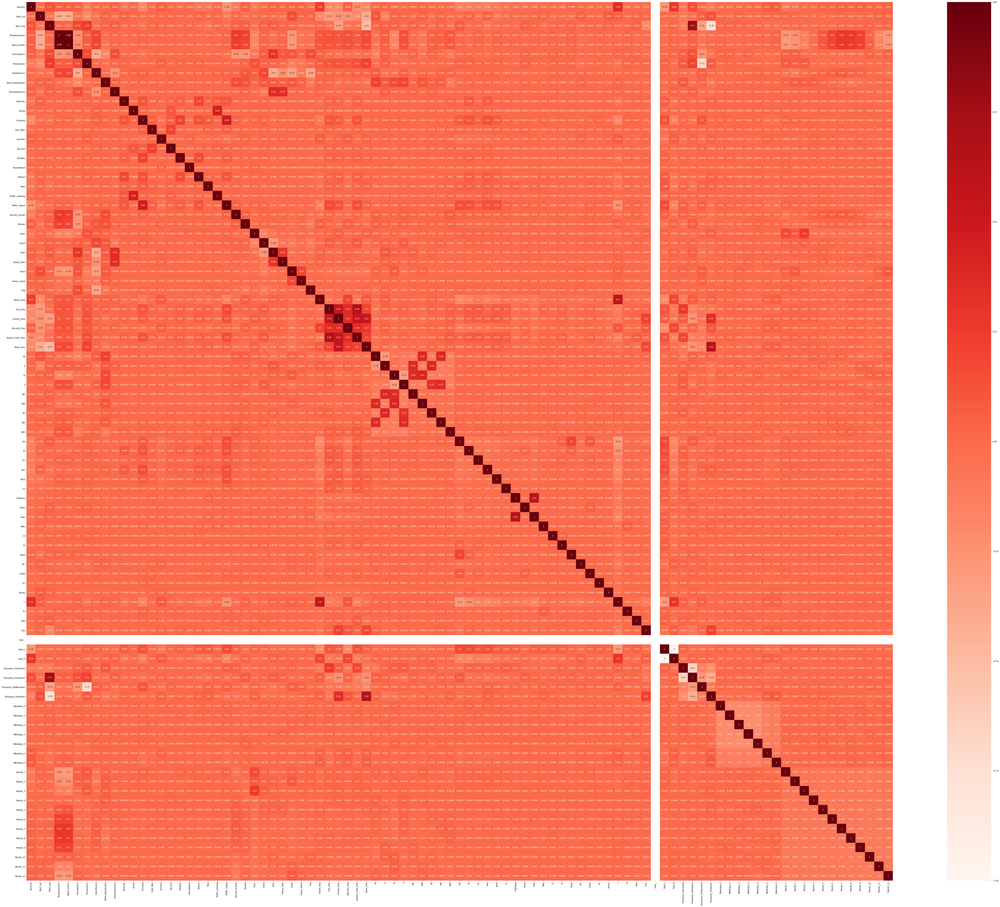

In [37]:
#Using Pearson Correlation
plt.figure(figsize=(96,80))
cor = df_bl.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.show()

In [171]:
df.head(3)

,Severity,Start_Lat,Start_Lng,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),Precipitation(in),Amenity,Bump,Crossing,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Sunrise_Sunset,Minute,Clear,Cloud,Rain,Heavy_Rain,Snow,Heavy_Snow,Fog,Street_Freq,City_Freq,County_Freq,Zipcode_Freq,Airport_Code_Freq,State_Freq,W,E,N,S,NE,NW,SE,SW,VAR,Rd,St,Dr,Ave,Blvd,I-,Timezone_US/Central,Timezone_US/Eastern,Timezone_US/Mountain,Timezone_US/Pacific,Weekday_0,Weekday_1,Weekday_2,Weekday_3,Weekday_4,Weekday_5,Weekday_6,Month_1,Month_2,Month_3,Month_4,Month_5,Month_6,Month_7,Month_8,Month_9,Month_10,Month_11,Month_12,Precipitation_NA,Side,Minute_Sin,Minute_Cos
0,0,43.207451,-78.650032,32.0,23.0,64.0,29.56,10.0,13.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,1,647.0,0,1,0,0,0,0,0,0.080462,0.837140,0.484732,0.158924,0.723191,1.883622,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0.313164,-0.949699
1,0,43.030651,-78.875862,34.0,27.0,67.0,29.59,10.0,9.0,0.0,0,0,0,0,0,0,0,0,0,0,0,1,1,804.0,0,1,0,0,0,0,0,0.154928,0.538190,0.484732,0.158924,0.723191,1.883622,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,-0.358368,-0.933580
2,0,42.550568,-79.108765,37.0,30.0,54.0,29.50,10.0,9.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,1,809.0,0,0,0,0,0,0,0,5.829693,0.109799,0.456851,1.001547,0.486933,1.883622,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,-0.378649,-0.925541


In [15]:
df = df.withColumn('Minute_Sin', f.sin(f.col('Minute')*math.pi*2/1440))
df = df.withColumn('Minute_Cos', f.cos(f.col('Minute')*math.pi*2/1440))

In [170]:
df["Minute_Sin"] = np.sin(df["Minute"] * math.pi * 2 / 1440)
df["Minute_Cos"] = np.cos(df["Minute"] * math.pi * 2 / 1440)

#### Data projection

#### Location attributes

In [206]:
df = pd.read_csv("US_Accidents_Dec20_Updated_3.csv")

In [173]:
df.head(3)

,Severity,Start_Time,Start_Lat,Start_Lng,Description,Number,Street,Side,City,County,State,Zipcode,Timezone,Airport_Code,Weather_Timestamp,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Direction,Wind_Speed(mph),Precipitation(in),Weather_Condition,Amenity,Bump,Crossing,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Sunrise_Sunset,Duration,Year,Month,Weekday,Day,Hour,Minute,Clear,Cloud,Rain,Heavy_Rain,Snow,Heavy_Snow,Fog,Street_Freq,City_Freq,County_Freq,Zipcode_Freq,Airport_Code_Freq,State_Freq,W,E,N,S,NE,NW,SE,SW,VAR,Rd,St,Dr,Ave,Blvd,Ln,Highway,Pkwy,Hwy,Way,Ct,Pl,Road,US-,Creek,Cir,Route,I-,Trl,Pike,Fwy
0,3,2016-02-08 05:46:00,39.865147,-84.058723,Right lane blocked due to accident on I-70 Eas...,NaN,I-70 E,R,Dayton,Montgomery,OH,45424,US/Eastern,KFFO,2016-02-08 05:58:00,36.9,25.4,91.0,29.68,10.0,CALM,9.2,0.02,Light Rain,False,False,False,False,False,False,False,False,False,False,False,False,Night,0 days 05:14:00.000000000,2016,2,0,39,5,346.0,False,False,True,False,False,False,False,4922,13794,60090,230,5303,50453,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False
1,2,2016-02-08 06:07:59,39.928059,-82.831184,Accident on Brice Rd at Tussing Rd. Expect del...,2584.0,Brice Rd,L,Reynoldsburg,Franklin,OH,43068-3402,US/Eastern,KCMH,2016-02-08 05:51:00,37.9,25.2,100.0,29.65,10.0,CALM,9.2,0.00,Light Rain,False,False,False,False,False,False,False,False,False,False,False,False,Night,0 days 00:30:00.000000000,2016,2,0,39,6,367.0,False,False,True,False,False,False,False,76,227,12239,3,5938,50453,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,2,2016-02-08 06:49:27,39.063148,-84.032608,Accident on OH-32 State Route 32 Westbound at ...,NaN,State Route 32,R,Williamsburg,Clermont,OH,45176,US/Eastern,KI69,2016-02-08 06:56:00,36.0,33.3,100.0,29.67,10.0,SW,3.5,NaN,Overcast,False,False,False,False,False,False,False,False,False,False,False,True,Night,0 days 00:30:00.000000000,2016,2,0,39,6,409.0,False,True,False,False,False,False,False,72,603,380,6,508,50453,True,False,False,True,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False


In [182]:
audit_fields = df.isna().sum()
audit_fields = audit_fields.to_frame()
audit_fields.columns = ['Missing values']
audit_fields

,Missing values
Severity,0
Start_Time,0
Start_Lat,0
Start_Lng,0
Description,2
Number,1557553
Street,0
Side,0
City,0
County,0


In [183]:
fre_list = ['Street', 'City', 'County', 'Zipcode', 'Airport_Code','State']
for i in fre_list:
    newname = i + '_Freq'
    df[newname] = df.groupby([i])[i].transform('count')

In [13]:
df = df.withColumn('Street_Freq', f.log(f.col('Street_Freq')+1))
df = df.withColumn('City_Freq', f.col('City_Freq')**0.15/0.15)
df = df.withColumn('Zipcode_Freq', f.col('Zipcode_Freq')**0.1/0.1)
df = df.withColumn('County_Freq', f.col('County_Freq')**0.45/0.45)
df = df.withColumn('Airport_Code_Freq', f.col('Airport_Code_Freq')**0.4/0.4)

In [204]:
df['Street_Freq'] = df['Street_Freq'].apply(lambda x: np.log(x+1))
df['City_Freq'] = boxcox(df['City_Freq'].apply(lambda x: x+1),lmbda=0.15)
df['Zipcode_Freq'] = boxcox(df['Zipcode_Freq'].apply(lambda x: x+1),lmbda=0.1)
df['County_Freq'] = boxcox(df['County_Freq'].apply(lambda x: x+1),lmbda=0.45)
df['Airport_Code_Freq'] = boxcox(df['Airport_Code_Freq'].apply(lambda x: x+1),lmbda=0.4)

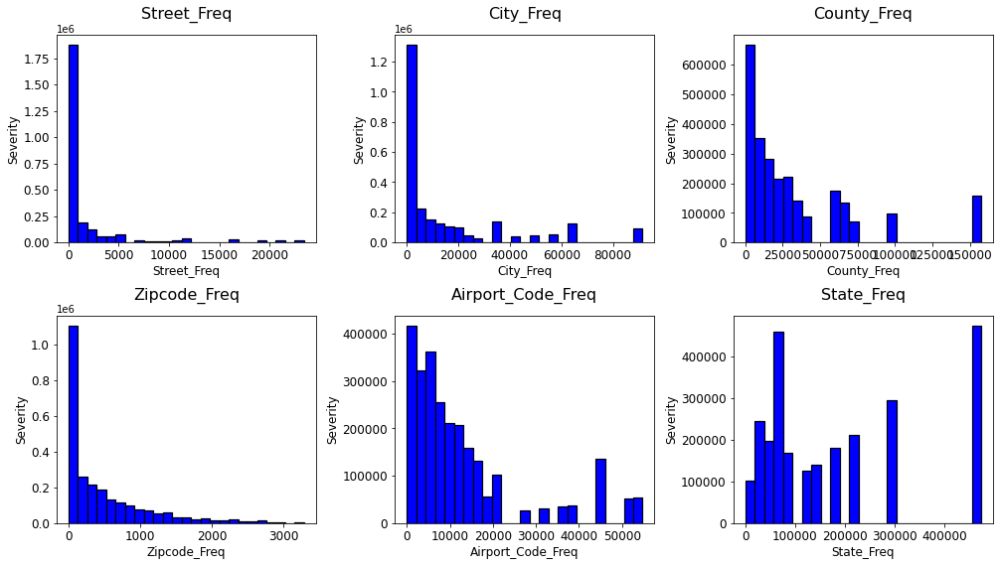

In [187]:
fre_list = ['Street', 'City', 'County', 'Zipcode', 'Airport_Code','State']
fig, axs = plt.subplots(ncols=2, nrows=3, figsize=(14, 8))
plt.subplots_adjust(hspace=0.4,wspace = 0.2)
for i, feature in enumerate(fre_list, 1): 
    feature = feature + '_Freq'   
    ax = plt.subplot(2, 3, i)
    ax.hist(np.array(df.select(feature).collect()).flatten(), 25, histtype='bar', color=["blue"], label=[0,1], edgecolor='black', linewidth=1.2)
    
    plt.xlabel('{}'.format(feature), size=12, labelpad=3)
    plt.ylabel('Severity', size=12, labelpad=3)    
    plt.tick_params(axis='x', labelsize=12)
    plt.tick_params(axis='y', labelsize=12)

    plt.title('{}'.format(feature), size=16, y=1.05)
fig.tight_layout()
plt.show()

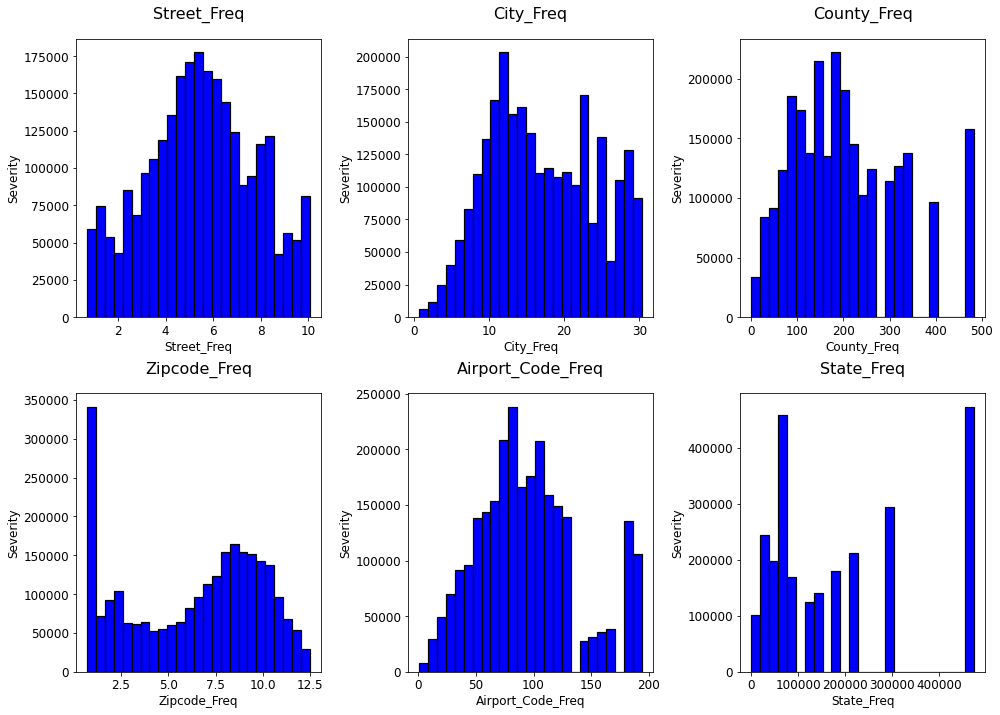

In [205]:
fre_list = ['Street', 'City', 'County', 'Zipcode', 'Airport_Code','State']
fig, axs = plt.subplots(ncols=2, nrows=3, figsize=(14, 10))
plt.subplots_adjust(hspace=0.4,wspace = 0.2)
for i, feature in enumerate(fre_list, 1): 
    feature = feature + '_Freq'   
    ax = plt.subplot(2, 3, i)
    ax.hist(df[feature], 25, histtype='bar', color=["blue"], label=[0,1], edgecolor='black', linewidth=1.2)
    
    plt.xlabel('{}'.format(feature), size=12, labelpad=3)
    plt.ylabel('Severity', size=12, labelpad=3)    
    plt.tick_params(axis='x', labelsize=12)
    plt.tick_params(axis='y', labelsize=12)

    plt.title('{}'.format(feature), size=16, y=1.05)
fig.tight_layout()
plt.show()

#### Weather transformation

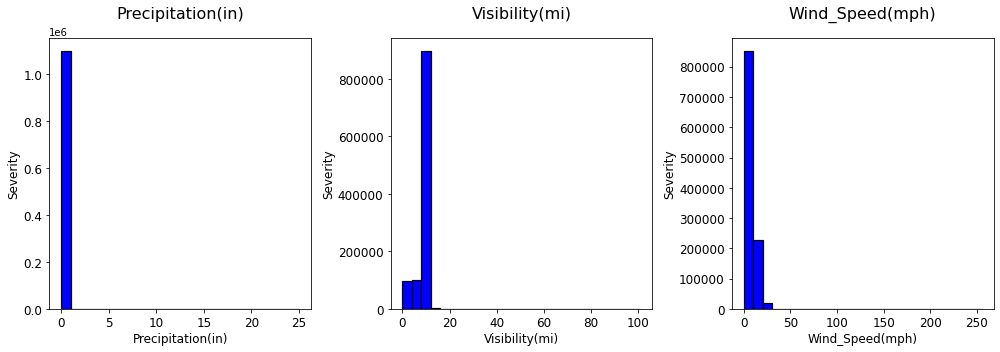

In [219]:
weather_list = ['Precipitation(in)', 'Visibility(mi)','Wind_Speed(mph)']
fig, axe = plt.subplots(ncols=1, nrows=3, figsize=(14, 5))
plt.subplots_adjust(hspace=0.4,wspace = 0.2)
for i, feature in enumerate(weather_list, 1):  
    ax = plt.subplot(1, 3, i)
    ax.hist(df[feature], 25, histtype='bar', color=["blue"], label=[0,1], edgecolor='black', linewidth=1.2)
    
    plt.xlabel('{}'.format(feature), size=12, labelpad=3)
    plt.ylabel('Severity', size=12, labelpad=3)    
    plt.tick_params(axis='x', labelsize=12)
    plt.tick_params(axis='y', labelsize=12)

    plt.title('{}'.format(feature), size=16, y=1.05)
fig.tight_layout()
plt.show()

In [237]:
df['Precipitation_bc']= boxcox(df['Precipitation(in)'].apply(lambda x: x+1),lmbda=-20)
df['Visibility_bc']= boxcox(df['Visibility(mi)'].apply(lambda x: x+1),lmbda = 0.3)
df['Wind_Speed_bc']= boxcox(df['Wind_Speed(mph)'].apply(lambda x: x+1),lmbda=-0.2)

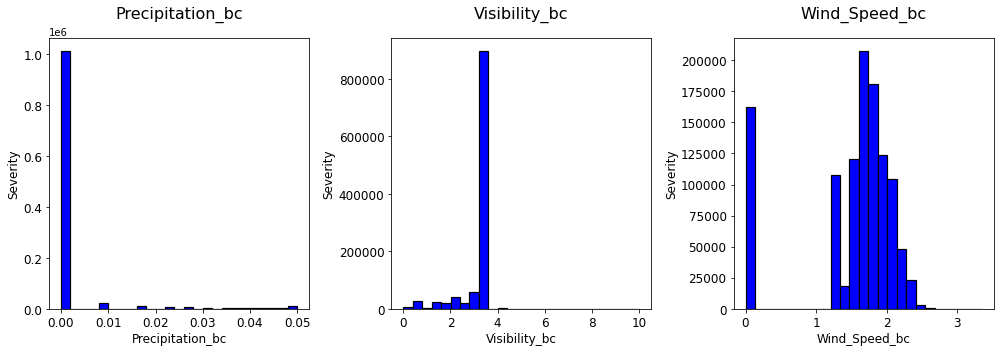

In [238]:
weather_list = ['Precipitation_bc', 'Visibility_bc','Wind_Speed_bc']
fig, axe = plt.subplots(ncols=1, nrows=3, figsize=(14, 5))
plt.subplots_adjust(hspace=0.4,wspace = 0.2)
for i, feature in enumerate(weather_list, 1):  
    ax = plt.subplot(1, 3, i)
    ax.hist(df[feature], 25, histtype='bar', color=["blue"], label=[0,1], edgecolor='black', linewidth=1.2)
    
    plt.xlabel('{}'.format(feature), size=12, labelpad=3)
    plt.ylabel('Severity', size=12, labelpad=3)    
    plt.tick_params(axis='x', labelsize=12)
    plt.tick_params(axis='y', labelsize=12)

    plt.title('{}'.format(feature), size=16, y=1.05)
fig.tight_layout()
plt.show()

### Train test split

In [27]:
from pyspark.ml.feature import ChiSqSelector

In [16]:
from pyspark.ml.feature import ChiSqSelector
from pyspark.ml.linalg import Vectors

df = spark.createDataFrame([
    (7, Vectors.dense([0.0, 0.0, 18.0, 1.0]), 1.0,),
    (8, Vectors.dense([0.0, 1.0, 12.0, 0.0]), 0.0,),
    (9, Vectors.dense([1.0, 0.0, 15.0, 0.1]), 0.0,)], ["id", "features", "clicked"])

selector = ChiSqSelector(numTopFeatures=1, featuresCol="features",
                         outputCol="selectedFeatures", labelCol="clicked")

result = selector.fit(df).transform(df)

print("ChiSqSelector output with top %d features selected" % selector.getNumTopFeatures())
result.show()

ChiSqSelector output with top 1 features selected
+---+------------------+-------+----------------+
| id|          features|clicked|selectedFeatures|
+---+------------------+-------+----------------+
|  7|[0.0,0.0,18.0,1.0]|    1.0|          [18.0]|
|  8|[0.0,1.0,12.0,0.0]|    0.0|          [12.0]|
|  9|[1.0,0.0,15.0,0.1]|    0.0|          [15.0]|
+---+------------------+-------+----------------+



In [26]:
selector = ChiSqSelector(numTopFeatures=10, featuresCol="features",
                         outputCol="selectedFeatures", labelCol="Severity")
result = selector.fit(data).transform(data)
print("ChiSqSelector output with top %d features selected" % selector.getNumTopFeatures())
result.show(5)

Py4JJavaError: An error occurred while calling o320.fit.
: org.apache.spark.SparkException: Job aborted due to stage failure: Task 0 in stage 66.0 failed 1 times, most recent failure: Lost task 0.0 in stage 66.0 (TID 66, localhost, executor driver): org.apache.spark.SparkException: Chi-square test expect factors (categorical values) but found more than 10000 distinct values in column 0.
	at org.apache.spark.mllib.stat.test.ChiSqTest$$anonfun$3$$anonfun$apply$1$$anonfun$apply$2.apply(ChiSqTest.scala:106)
	at org.apache.spark.mllib.stat.test.ChiSqTest$$anonfun$3$$anonfun$apply$1$$anonfun$apply$2.apply(ChiSqTest.scala:104)
	at scala.collection.immutable.HashMap$HashMap1.foreach(HashMap.scala:221)
	at scala.collection.immutable.HashMap$HashTrieMap.foreach(HashMap.scala:428)
	at scala.collection.immutable.HashMap$HashTrieMap.foreach(HashMap.scala:428)
	at org.apache.spark.mllib.stat.test.ChiSqTest$$anonfun$3$$anonfun$apply$1.apply(ChiSqTest.scala:104)
	at org.apache.spark.mllib.stat.test.ChiSqTest$$anonfun$3$$anonfun$apply$1.apply(ChiSqTest.scala:98)
	at scala.collection.Iterator$$anon$12.nextCur(Iterator.scala:434)
	at scala.collection.Iterator$$anon$12.hasNext(Iterator.scala:440)
	at scala.collection.Iterator$$anon$11.hasNext(Iterator.scala:408)
	at scala.collection.Iterator$$anon$11.hasNext(Iterator.scala:408)
	at org.apache.spark.util.collection.ExternalSorter.insertAll(ExternalSorter.scala:191)
	at org.apache.spark.shuffle.sort.SortShuffleWriter.write(SortShuffleWriter.scala:63)
	at org.apache.spark.scheduler.ShuffleMapTask.runTask(ShuffleMapTask.scala:96)
	at org.apache.spark.scheduler.ShuffleMapTask.runTask(ShuffleMapTask.scala:53)
	at org.apache.spark.scheduler.Task.run(Task.scala:99)
	at org.apache.spark.executor.Executor$TaskRunner.run(Executor.scala:322)
	at java.util.concurrent.ThreadPoolExecutor.runWorker(ThreadPoolExecutor.java:1149)
	at java.util.concurrent.ThreadPoolExecutor$Worker.run(ThreadPoolExecutor.java:624)
	at java.lang.Thread.run(Thread.java:748)

Driver stacktrace:
	at org.apache.spark.scheduler.DAGScheduler.org$apache$spark$scheduler$DAGScheduler$$failJobAndIndependentStages(DAGScheduler.scala:1435)
	at org.apache.spark.scheduler.DAGScheduler$$anonfun$abortStage$1.apply(DAGScheduler.scala:1423)
	at org.apache.spark.scheduler.DAGScheduler$$anonfun$abortStage$1.apply(DAGScheduler.scala:1422)
	at scala.collection.mutable.ResizableArray$class.foreach(ResizableArray.scala:59)
	at scala.collection.mutable.ArrayBuffer.foreach(ArrayBuffer.scala:48)
	at org.apache.spark.scheduler.DAGScheduler.abortStage(DAGScheduler.scala:1422)
	at org.apache.spark.scheduler.DAGScheduler$$anonfun$handleTaskSetFailed$1.apply(DAGScheduler.scala:802)
	at org.apache.spark.scheduler.DAGScheduler$$anonfun$handleTaskSetFailed$1.apply(DAGScheduler.scala:802)
	at scala.Option.foreach(Option.scala:257)
	at org.apache.spark.scheduler.DAGScheduler.handleTaskSetFailed(DAGScheduler.scala:802)
	at org.apache.spark.scheduler.DAGSchedulerEventProcessLoop.doOnReceive(DAGScheduler.scala:1650)
	at org.apache.spark.scheduler.DAGSchedulerEventProcessLoop.onReceive(DAGScheduler.scala:1605)
	at org.apache.spark.scheduler.DAGSchedulerEventProcessLoop.onReceive(DAGScheduler.scala:1594)
	at org.apache.spark.util.EventLoop$$anon$1.run(EventLoop.scala:48)
	at org.apache.spark.scheduler.DAGScheduler.runJob(DAGScheduler.scala:628)
	at org.apache.spark.SparkContext.runJob(SparkContext.scala:1925)
	at org.apache.spark.SparkContext.runJob(SparkContext.scala:1938)
	at org.apache.spark.SparkContext.runJob(SparkContext.scala:1951)
	at org.apache.spark.SparkContext.runJob(SparkContext.scala:1965)
	at org.apache.spark.rdd.RDD$$anonfun$collect$1.apply(RDD.scala:936)
	at org.apache.spark.rdd.RDDOperationScope$.withScope(RDDOperationScope.scala:151)
	at org.apache.spark.rdd.RDDOperationScope$.withScope(RDDOperationScope.scala:112)
	at org.apache.spark.rdd.RDD.withScope(RDD.scala:362)
	at org.apache.spark.rdd.RDD.collect(RDD.scala:935)
	at org.apache.spark.rdd.PairRDDFunctions$$anonfun$countByKey$1.apply(PairRDDFunctions.scala:375)
	at org.apache.spark.rdd.PairRDDFunctions$$anonfun$countByKey$1.apply(PairRDDFunctions.scala:375)
	at org.apache.spark.rdd.RDDOperationScope$.withScope(RDDOperationScope.scala:151)
	at org.apache.spark.rdd.RDDOperationScope$.withScope(RDDOperationScope.scala:112)
	at org.apache.spark.rdd.RDD.withScope(RDD.scala:362)
	at org.apache.spark.rdd.PairRDDFunctions.countByKey(PairRDDFunctions.scala:374)
	at org.apache.spark.rdd.RDD$$anonfun$countByValue$1.apply(RDD.scala:1204)
	at org.apache.spark.rdd.RDD$$anonfun$countByValue$1.apply(RDD.scala:1204)
	at org.apache.spark.rdd.RDDOperationScope$.withScope(RDDOperationScope.scala:151)
	at org.apache.spark.rdd.RDDOperationScope$.withScope(RDDOperationScope.scala:112)
	at org.apache.spark.rdd.RDD.withScope(RDD.scala:362)
	at org.apache.spark.rdd.RDD.countByValue(RDD.scala:1203)
	at org.apache.spark.mllib.stat.test.ChiSqTest$.chiSquaredFeatures(ChiSqTest.scala:120)
	at org.apache.spark.mllib.stat.Statistics$.chiSqTest(Statistics.scala:176)
	at org.apache.spark.mllib.feature.ChiSqSelector.fit(ChiSqSelector.scala:235)
	at org.apache.spark.ml.feature.ChiSqSelector.fit(ChiSqSelector.scala:170)
	at sun.reflect.NativeMethodAccessorImpl.invoke0(Native Method)
	at sun.reflect.NativeMethodAccessorImpl.invoke(NativeMethodAccessorImpl.java:62)
	at sun.reflect.DelegatingMethodAccessorImpl.invoke(DelegatingMethodAccessorImpl.java:43)
	at java.lang.reflect.Method.invoke(Method.java:498)
	at py4j.reflection.MethodInvoker.invoke(MethodInvoker.java:244)
	at py4j.reflection.ReflectionEngine.invoke(ReflectionEngine.java:357)
	at py4j.Gateway.invoke(Gateway.java:280)
	at py4j.commands.AbstractCommand.invokeMethod(AbstractCommand.java:132)
	at py4j.commands.CallCommand.execute(CallCommand.java:79)
	at py4j.GatewayConnection.run(GatewayConnection.java:214)
	at java.lang.Thread.run(Thread.java:748)
Caused by: org.apache.spark.SparkException: Chi-square test expect factors (categorical values) but found more than 10000 distinct values in column 0.
	at org.apache.spark.mllib.stat.test.ChiSqTest$$anonfun$3$$anonfun$apply$1$$anonfun$apply$2.apply(ChiSqTest.scala:106)
	at org.apache.spark.mllib.stat.test.ChiSqTest$$anonfun$3$$anonfun$apply$1$$anonfun$apply$2.apply(ChiSqTest.scala:104)
	at scala.collection.immutable.HashMap$HashMap1.foreach(HashMap.scala:221)
	at scala.collection.immutable.HashMap$HashTrieMap.foreach(HashMap.scala:428)
	at scala.collection.immutable.HashMap$HashTrieMap.foreach(HashMap.scala:428)
	at org.apache.spark.mllib.stat.test.ChiSqTest$$anonfun$3$$anonfun$apply$1.apply(ChiSqTest.scala:104)
	at org.apache.spark.mllib.stat.test.ChiSqTest$$anonfun$3$$anonfun$apply$1.apply(ChiSqTest.scala:98)
	at scala.collection.Iterator$$anon$12.nextCur(Iterator.scala:434)
	at scala.collection.Iterator$$anon$12.hasNext(Iterator.scala:440)
	at scala.collection.Iterator$$anon$11.hasNext(Iterator.scala:408)
	at scala.collection.Iterator$$anon$11.hasNext(Iterator.scala:408)
	at org.apache.spark.util.collection.ExternalSorter.insertAll(ExternalSorter.scala:191)
	at org.apache.spark.shuffle.sort.SortShuffleWriter.write(SortShuffleWriter.scala:63)
	at org.apache.spark.scheduler.ShuffleMapTask.runTask(ShuffleMapTask.scala:96)
	at org.apache.spark.scheduler.ShuffleMapTask.runTask(ShuffleMapTask.scala:53)
	at org.apache.spark.scheduler.Task.run(Task.scala:99)
	at org.apache.spark.executor.Executor$TaskRunner.run(Executor.scala:322)
	at java.util.concurrent.ThreadPoolExecutor.runWorker(ThreadPoolExecutor.java:1149)
	at java.util.concurrent.ThreadPoolExecutor$Worker.run(ThreadPoolExecutor.java:624)
	... 1 more


In [24]:
data.schema

StructType(List(StructField(Severity,IntegerType,true),StructField(Start_Lat,DoubleType,true),StructField(Start_Lng,DoubleType,true),StructField(Temperature(F),DoubleType,true),StructField(Wind_Chill(F),DoubleType,true),StructField(Humidity(%),DoubleType,true),StructField(Pressure(in),DoubleType,true),StructField(Visibility(mi),DoubleType,true),StructField(Wind_Speed(mph),DoubleType,true),StructField(Precipitation(in),DoubleType,true),StructField(Amenity,IntegerType,true),StructField(Bump,IntegerType,true),StructField(Crossing,IntegerType,true),StructField(Give_Way,IntegerType,true),StructField(Junction,IntegerType,true),StructField(No_Exit,IntegerType,true),StructField(Railway,IntegerType,true),StructField(Roundabout,IntegerType,true),StructField(Station,IntegerType,true),StructField(Stop,IntegerType,true),StructField(Traffic_Calming,IntegerType,true),StructField(Traffic_Signal,IntegerType,true),StructField(Sunrise_Sunset,IntegerType,true),StructField(Minute,DoubleType,true),StructFie

In [10]:
labelIndexer = StringIndexer(inputCol="Severity", outputCol="labelSeverity").fit(data)
labelConverter = IndexToString(inputCol="prediction", outputCol="predictedLabel",
                               labels=labelIndexer.labels)

In [18]:
(trainingData, testData) = data.randomSplit([0.7, 0.3])

In [19]:
rf = RandomForestClassifier(labelCol="Severity", featuresCol="features", numTrees=10)
pipeline = Pipeline(stages=[rf])
model = pipeline.fit(trainingData)

In [21]:
predictions = model.transform(testData)

In [22]:
predictions.select("prediction", "Severity", "features").show(5)

+----------+--------+--------------------+
|prediction|Severity|            features|
+----------+--------+--------------------+
|       0.0|       0|(76,[0,1,2,3,4,5,...|
|       1.0|       0|(76,[0,1,2,3,4,5,...|
|       0.0|       0|(76,[0,1,2,3,4,5,...|
|       0.0|       0|(76,[0,1,2,3,4,5,...|
|       0.0|       0|(76,[0,1,2,3,4,5,...|
+----------+--------+--------------------+
only showing top 5 rows



In [23]:
evaluator = MulticlassClassificationEvaluator(
    labelCol="Severity", predictionCol="prediction", metricName="accuracy")
accuracy = evaluator.evaluate(predictions)
print("Test Error = %g" % (1.0 - accuracy))

Test Error = 0.242108


In [11]:
df.head(3)

,Severity,Start_Lat,Start_Lng,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),Precipitation(in),Amenity,Bump,Crossing,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Sunrise_Sunset,Minute,Clear,Cloud,Rain,Heavy_Rain,Snow,Heavy_Snow,Fog,Street_Freq,City_Freq,County_Freq,Zipcode_Freq,Airport_Code_Freq,State_Freq,W,E,N,S,NE,NW,SE,SW,VAR,Rd,St,Dr,Ave,Blvd,I-,Timezone_US/Central,Timezone_US/Eastern,Timezone_US/Mountain,Timezone_US/Pacific,Weekday_0,Weekday_1,Weekday_2,Weekday_3,Weekday_4,Weekday_5,Weekday_6,Month_1,Month_2,Month_3,Month_4,Month_5,Month_6,Month_7,Month_8,Month_9,Month_10,Month_11,Month_12,Precipitation_NA,Side
0,0,43.207451,-78.650032,32.0,23.0,64.0,29.56,10.0,13.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,1,647.0,0,1,0,0,0,0,0,0.080462,0.837140,0.484732,0.158924,0.723191,1.883622,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,0,43.030651,-78.875862,34.0,27.0,67.0,29.59,10.0,9.0,0.0,0,0,0,0,0,0,0,0,0,0,0,1,1,804.0,0,1,0,0,0,0,0,0.154928,0.538190,0.484732,0.158924,0.723191,1.883622,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
2,0,42.550568,-79.108765,37.0,30.0,54.0,29.50,10.0,9.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,1,809.0,0,0,0,0,0,0,0,5.829693,0.109799,0.456851,1.001547,0.486933,1.883622,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1


In [4]:
selected_features_rfe = ['Start_Lat', 'Start_Lng', 'Temperature(F)', 'Wind_Chill(F)',
       'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Speed(mph)',
       'Precipitation(in)', 'Crossing', 'Give_Way', 'Junction', 'No_Exit',
       'Railway', 'Station', 'Stop', 'Traffic_Signal', 'Sunrise_Sunset',
       'Minute', 'Clear', 'Cloud', 'Rain', 'Heavy_Rain', 'Snow', 'Heavy_Snow',
       'Fog', 'Street_Freq', 'City_Freq', 'County_Freq', 'Zipcode_Freq',
       'Airport_Code_Freq', 'State_Freq', 'W', 'E', 'N', 'S', 'NE', 'NW', 'SE',
       'SW', 'VAR', 'Rd', 'St', 'Dr', 'Ave', 'Blvd', 'I-',
       'Timezone_US/Central', 'Timezone_US/Eastern', 'Timezone_US/Mountain',
       'Timezone_US/Pacific', 'Weekday_0', 'Weekday_1', 'Weekday_2',
       'Weekday_3', 'Weekday_4', 'Weekday_5', 'Weekday_6', 'Month_1',
       'Month_2', 'Month_3', 'Month_4', 'Month_5', 'Month_6', 'Month_7',
       'Month_8', 'Month_9', 'Month_10', 'Month_11', 'Month_12',
       'Precipitation_NA', 'Side']

In [5]:
df_sel = df[list(selected_features_rfe)+['Severity']].drop(['Month_1',
       'Month_2', 'Month_3', 'Month_4', 'Month_5', 'Month_6', 'Month_7',
       'Month_8', 'Month_9', 'Month_10', 'Month_11', 'Month_12', 'Weekday_0',
       'Weekday_1', 'Weekday_2', 'Weekday_3', 'Weekday_4'], axis = 1)

In [10]:
X, y = df_sel.drop(['Severity'], axis = 1), df_sel['Severity']
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.3, random_state = 42, shuffle = True, stratify = y)
display(X_train.shape, X_test.shape)

(769987, 55)

(329995, 55)

#### Imbalance

In [19]:
df_sel[['Severity']].head(3)

,Severity
0,0
1,0
2,0


In [31]:

df_severity

,Severity
0,1092074
1,7908


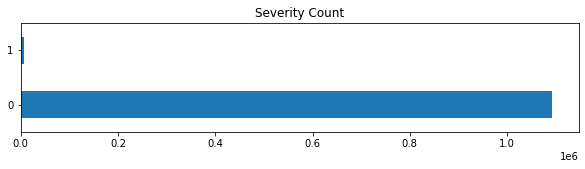

In [34]:
severity_count = df_sel['Severity'].value_counts()
df_severity = pd.DataFrame(severity_count)
ax = df_severity.plot(kind='barh', title='Severity Count', legend= False, figsize = (10,2))

In [40]:
df_train, df_test = X_train.copy(), X_test.copy()
df_train.loc[:,"Severity"] = y_train
df_test.loc[:,"Severity"] = y_test

df_train = resample(df_train, 'Severity', len(df_train[df_train['Severity']==0]))
df_test = resample(df_test, 'Severity', len(df_test[df_test['Severity']==0]))

df_bal = pd.concat([df_train, df_test], axis = 0)

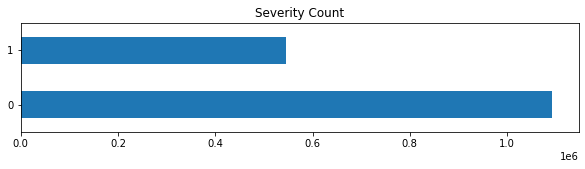

In [41]:
severity_count = df_bal['Severity'].value_counts()
df_severity = pd.DataFrame(severity_count)
ax = df_severity.plot(kind='barh', title='Severity Count', legend= False, figsize = (10,2))

In [48]:
ros = RandomOverSampler(sampling_strategy = 0.5)
df_upsample = ros.fit_resample(X_train, y_train)
df_upsample[1].value_counts()

0    764451
1    382225
Name: Severity, dtype: int64

In [159]:
df_train = resample(df_train, 'Severity', len(df_train[df_train['Severity']==0]))
df_test = resample(df_test, 'Severity', len(df_test[df_test['Severity']==0]))

display(df_train['Severity'].value_counts())
display(df_test['Severity'].value_counts())

0    764451
1    382226
Name: Severity, dtype: int64

0    327623
1    163812
Name: Severity, dtype: int64

In [128]:
df_train.shape

(1146677, 18)

In [242]:
scaler = MinMaxScaler()
df_scaled = scaler.fit_transform(df, y = ['Severity'])
df_scaled = pd.DataFrame(df_scaled)
df_scaled.head(3)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93
0,0.0,0.762966,0.809355,0.414384,0.402878,0.632653,0.509304,0.09901,0.050980,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.449618,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.125120,0.090593,0.000000,0.160951,0.608437,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.0,0.755734,0.805371,0.421233,0.417266,0.663265,0.509821,0.09901,0.035294,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.558721,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.009926,0.079994,0.090593,0.000000,0.160951,0.608437,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.0,0.736096,0.801263,0.431507,0.428058,0.530612,0.508270,0.09901,0.035294,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.562196,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.766312,0.015328,0.085368,0.136295,0.108254,0.608437,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


### Recursive Feature Elimination (RFE)

In [9]:
assembler = VectorAssembler(inputCols = df.columns[1:], outputCol = "features")
rf = RandomForestClassifier(labelCol="Severity", featuresCol="features",
                            numTrees=100, cacheNodeIds = True, subsamplingRate = 0.7)

pipe = Pipeline(stages = [assembler, rf])

In [14]:
mod = pipe.fit(df)

In [15]:
df2 = mod.transform(df)

In [28]:
mod.stages[-1].featureImportances[0]

0.016701559499088074

In [22]:
def ExtractFeatureImp(featureImp, dataset, featuresCol):
    list_extract = []
    for i in dataset.schema[featuresCol].metadata["ml_attr"]["attrs"]:
        list_extract = list_extract + dataset.schema[featuresCol].metadata["ml_attr"]["attrs"][i]
    varlist = spark.createDataFrame(list_extract)
    varlist.withColumn('score', )
    varlist['score'] = varlist['idx'].apply(lambda x: featureImp[x])
    return(varlist.sort_values('score', ascending = False))

In [8]:
def ExtractFeatureImp(featureImp, dataset, featuresCol):
    list_extract = []
    for i in dataset.schema[featuresCol].metadata["ml_attr"]["attrs"]:
        list_extract = list_extract + dataset.schema[featuresCol].metadata["ml_attr"]["attrs"][i]
    for x in list_extract:
        list_extract[x['idx']]['score'] = round(float(featureImp[x['idx']]),4)
    df_feature = spark.createDataFrame(Row(**x) for x in list_extract)
    return df_feature

In [101]:
att_dict = trainingData.schema['features'].metadata["ml_attr"]["attrs"]

{'numeric': [{'idx': 0, 'name': 'Start_Lat'},
  {'idx': 1, 'name': 'Start_Lng'},
  {'idx': 2, 'name': 'Temperature(F)'},
  {'idx': 3, 'name': 'Wind_Chill(F)'},
  {'idx': 4, 'name': 'Humidity(%)'},
  {'idx': 5, 'name': 'Pressure(in)'},
  {'idx': 6, 'name': 'Visibility(mi)'},
  {'idx': 7, 'name': 'Wind_Speed(mph)'},
  {'idx': 8, 'name': 'Precipitation(in)'},
  {'idx': 9, 'name': 'Amenity'},
  {'idx': 10, 'name': 'Bump'},
  {'idx': 11, 'name': 'Crossing'},
  {'idx': 12, 'name': 'Give_Way'},
  {'idx': 13, 'name': 'Junction'},
  {'idx': 14, 'name': 'No_Exit'},
  {'idx': 15, 'name': 'Railway'},
  {'idx': 16, 'name': 'Roundabout'},
  {'idx': 17, 'name': 'Station'},
  {'idx': 18, 'name': 'Stop'},
  {'idx': 19, 'name': 'Traffic_Calming'},
  {'idx': 20, 'name': 'Traffic_Signal'},
  {'idx': 21, 'name': 'Sunrise_Sunset'},
  {'idx': 22, 'name': 'Minute'},
  {'idx': 23, 'name': 'Clear'},
  {'idx': 24, 'name': 'Cloud'},
  {'idx': 25, 'name': 'Rain'},
  {'idx': 26, 'name': 'Heavy_Rain'},
  {'idx': 27,

In [71]:
ExtractFeatureImp(mod.stages[-1].featureImportances, df2, "features").show(3)

+---+--------------+------+
|idx|          name| score|
+---+--------------+------+
|  0|     Start_Lat|0.0121|
|  1|     Start_Lng|0.0354|
|  2|Temperature(F)|0.0036|
+---+--------------+------+
only showing top 3 rows



In [81]:
varlist = np.array(ExtractFeatureImp(mod.stages[-1].featureImportances, df2, "features").orderBy('score', ascending = False).select('idx').collect()).flatten()
varidx = [x for x in varlist[0:10]]
varidx

[50, 30, 33, 20, 75, 34, 32, 31, 35, 1]

+--------------------+
|            features|
+--------------------+
|(76,[0,1,2,3,4,5,...|
|(76,[0,1,2,3,4,5,...|
|(76,[0,1,2,3,4,5,...|
+--------------------+
only showing top 3 rows



In [19]:
slicer = VectorSlicer(inputCol="features", outputCol="features2", indices=[34,75])
slicer.transform(trainingData).withColumn('features', f.col('features2')).select('features').schema

{}

In [55]:
vecAssembler = VectorAssembler(inputCols=df.drop('Severity').columns, outputCol='features')
data = vecAssembler.transform(df)
(trainingData, testData) = data.randomSplit([0.7, 0.3])
evaluator = MulticlassClassificationEvaluator(
    labelCol="Severity", predictionCol="prediction", metricName="accuracy")
n_att = 76

rf = RandomForestClassifier(labelCol="Severity", featuresCol="features",
                            numTrees=10, cacheNodeIds = True, subsamplingRate = 0.7)
pipe = Pipeline(stages = [rf])
mod = pipe.fit(trainingData)
feature_imp = mod.stages[-1].featureImportances
list_extract = []
for i in trainingData.schema['features'].metadata["ml_attr"]["attrs"]:
    list_extract = list_extract + trainingData.schema['features'].metadata["ml_attr"]["attrs"][i]
for i in range(len(list_extract)):
    list_extract[i]['score'] = feature_imp[i]
list_extract = sorted(list_extract, key = lambda x: x['score'], reverse = True)
list_features = [x['name'] for x in list_extract]


predictions = mod.transform(testData)
acc = evaluator.evaluate(predictions)

for i in range(n_att-1,n_att-5,-1):
    varidx = [x['idx'] for x in list_extract][:i]
    slicer = VectorSlicer(inputCol="features", outputCol="features2", indices = varidx)
    trainingData = slicer.transform(trainingData).withColumn('features', f.col('features2')).drop('features2')
    mod = pipe.fit(trainingData)
    feature_imp = mod.stages[-1].featureImportances
    
    list_extract = [{'idx':j, 'name':list_extract[varidx[j]]['name'], 'score':feature_imp[j]} for j in range(len(varidx))]
    list_extract = sorted(list_extract, key = lambda x: x['score'], reverse = True)
    
    testData = slicer.transform(testData).withColumn('features', f.col('features2')).drop('features2')
    predictions = mod.transform(testData)
    accuracy = evaluator.evaluate(predictions)
    if (accuracy > acc):
        acc, n_att = accuracy, i
        list_features = [x['name'] for x in list_extract]

print("Optimum number of features: {}".format(40))
print("Score with {} features: {:.6f}".format(40, acc))

Optimum number of features: 72
Score with 72 features: 0.769823


In [64]:
result = ['Start_Lat', 'Start_Lng', 'Temperature(F)', 'Wind_Chill(F)',
       'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Speed(mph)',
       'Precipitation(in)', 'Junction', 'Sunrise_Sunset', 'Minute', 'Cloud',
       'Street_Freq', 'City_Freq', 'County_Freq', 'Zipcode_Freq',
       'Airport_Code_Freq', 'State_Freq', 'W', 'E', 'N', 'S', 'I-',
       'Weekday_0', 'Weekday_1', 'Weekday_2', 'Weekday_3', 'Weekday_4',
       'Weekday_5', 'Weekday_6', 'Month_4', 'Month_5', 'Month_7', 'Month_8',
       'Month_9', 'Month_10', 'Month_11', 'Month_12', 'Precipitation_NA']
len(result)

40

In [206]:
(trainingData, testData) = data.randomSplit([0.7, 0.3])

In [68]:
vecAssembler = VectorAssembler(inputCols=df.drop('Severity').columns, outputCol='features')
data = vecAssembler.transform(df)
(trainingData, testData) = data.randomSplit([0.7, 0.3])
evaluator = MulticlassClassificationEvaluator(
    labelCol="Severity", predictionCol="prediction", metricName="accuracy")
n_att = 76

rf = RandomForestClassifier(labelCol="Severity", featuresCol="features",
                            numTrees=100, cacheNodeIds = True, subsamplingRate = 0.7)
pipe = Pipeline(stages = [rf])
mod = pipe.fit(trainingData)
feature_imp = mod.stages[-1].featureImportances
list_extract = []
for i in trainingData.schema['features'].metadata["ml_attr"]["attrs"]:
    list_extract = list_extract + trainingData.schema['features'].metadata["ml_attr"]["attrs"][i]
for i in range(len(list_extract)):
    list_extract[i]['score'] = feature_imp[i]
list_extract = sorted(list_extract, key = lambda x: x['score'], reverse = True)
list_features = [x['name'] for x in list_extract]


predictions = mod.transform(testData)
acc = evaluator.evaluate(predictions)

for i in range(n_att-1,n_att-5,-1):
    varidx = [x['idx'] for x in list_extract][:i]
    slicer = VectorSlicer(inputCol="features", outputCol="features2", indices = varidx)
    trainingData = slicer.transform(trainingData).withColumn('features', f.col('features2')).drop('features2')
    mod = pipe.fit(trainingData)
    feature_imp = mod.stages[-1].featureImportances
    
    list_extract = [{'idx':j, 'name':list_extract[varidx[j]]['name'], 'score':feature_imp[j]} for j in range(len(varidx))]
    list_extract = sorted(list_extract, key = lambda x: x['score'], reverse = True)
    
    testData = slicer.transform(testData).withColumn('features', f.col('features2')).drop('features2')
    predictions = mod.transform(testData)
    accuracy = evaluator.evaluate(predictions)
    if (accuracy > acc):
        acc, n_att = accuracy, i
        list_features = [x['name'] for x in list_extract]

print("Optimum number of features: {}".format(n_att))
print("Score with {} features: {:.6f}".format(n_att, acc))

print("Features selected:\n{}".format(list_features))

Optimum number of features: 40
Score with 40 features: 0.794300

Features selected:
['Start_Lat', 'Start_Lng', 'Temperature(F)', 'Wind_Chill(F)', 'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Speed(mph)', 'Precipitation(in)', 'Junction', 'Sunrise_Sunset', 'Minute', 'Cloud', 'Street_Freq', 'City_Freq', 'County_Freq', 'Zipcode_Freq', 'Airport_Code_Freq', 'State_Freq', 'W', 'E', 'N', 'S', 'I-', 'Weekday_0', 'Weekday_1', 'Weekday_2', 'Weekday_3', 'Weekday_4', 'Weekday_5', 'Weekday_6', 'Month_4', 'Month_5', 'Month_7', 'Month_8', 'Month_9', 'Month_10', 'Month_11', 'Month_12', 'Precipitation_NA']


In [48]:
print("Accuracy = %g" % (acc))

Accuracy = 0.763636


In [9]:
vecAssembler = VectorAssembler(inputCols=df.drop('Severity').columns, outputCol='features')
data = vecAssembler.transform(df)
(trainingData, testData) = data.randomSplit([0.7, 0.3])

In [12]:
list_extract = []
for i in trainingData.schema['features'].metadata["ml_attr"]["attrs"]:
    list_extract = list_extract + trainingData.schema['features'].metadata["ml_attr"]["attrs"][i]
att_dict = {list_extract[i]['idx']:list_extract[i]['name'] for i in range(len(list_extract))}

In [13]:
att_dict

{0: 'Start_Lat',
 1: 'Start_Lng',
 2: 'Temperature(F)',
 3: 'Wind_Chill(F)',
 4: 'Humidity(%)',
 5: 'Pressure(in)',
 6: 'Visibility(mi)',
 7: 'Wind_Speed(mph)',
 8: 'Precipitation(in)',
 9: 'Amenity',
 10: 'Bump',
 11: 'Crossing',
 12: 'Give_Way',
 13: 'Junction',
 14: 'No_Exit',
 15: 'Railway',
 16: 'Roundabout',
 17: 'Station',
 18: 'Stop',
 19: 'Traffic_Calming',
 20: 'Traffic_Signal',
 21: 'Sunrise_Sunset',
 22: 'Minute',
 23: 'Clear',
 24: 'Cloud',
 25: 'Rain',
 26: 'Heavy_Rain',
 27: 'Snow',
 28: 'Heavy_Snow',
 29: 'Fog',
 30: 'Street_Freq',
 31: 'City_Freq',
 32: 'County_Freq',
 33: 'Zipcode_Freq',
 34: 'Airport_Code_Freq',
 35: 'State_Freq',
 36: 'W',
 37: 'E',
 38: 'N',
 39: 'S',
 40: 'NE',
 41: 'NW',
 42: 'SE',
 43: 'SW',
 44: 'VAR',
 45: 'Rd',
 46: 'St',
 47: 'Dr',
 48: 'Ave',
 49: 'Blvd',
 50: 'I-',
 51: 'Timezone_US/Central',
 52: 'Timezone_US/Eastern',
 53: 'Timezone_US/Mountain',
 54: 'Timezone_US/Pacific',
 55: 'Weekday_0',
 56: 'Weekday_1',
 57: 'Weekday_2',
 58: 'Week

In [40]:
varidx = [50, 30, 33, 20, 75, 34, 32, 31, 35, 1]
list_extract = [{'idx':j, 'name':list_extract[varidx[j]]['name']} for j in range(len(varidx))]
list_extract

[{'idx': 0, 'name': 'Weekday_3'},
 {'idx': 1, 'name': 'Cloud'},
 {'idx': 2, 'name': 'Weekday_1'},
 {'idx': 3, 'name': 'Dr'},
 {'idx': 4, 'name': 'Month_8'},
 {'idx': 5, 'name': 'Humidity(%)'},
 {'idx': 6, 'name': 'Junction'},
 {'idx': 7, 'name': 'Snow'},
 {'idx': 8, 'name': 'Month_9'},
 {'idx': 9, 'name': 'Street_Freq'}]

In [45]:
list(mod.stages[-1].featureImportances)

[0.015917750903514386,
 0.020927621354966394,
 0.002299918763898529,
 0.00447406177851161,
 0.0022661914615765507,
 0.010337316883581487,
 0.0014733372318988546,
 0.0006818176849902423,
 0.000489451863606194,
 0.0,
 0.0,
 0.04311785265183602,
 0.0,
 4.4715260713388264e-05,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.060997224664657526,
 0.0011940777258767682,
 0.0074641071891379095,
 0.00021545888510019585,
 0.0006327042455658009,
 0.0,
 0.00015835399741647173,
 0.0,
 0.0,
 0.0,
 0.1580602604087554,
 0.03390791884226534,
 0.031515505723617936,
 0.1286163239299895,
 0.09391563054286055,
 0.04950743608414573,
 0.0,
 0.00029734890157013155,
 2.607790221107144e-05,
 0.0001838001332919819,
 0.00046346711122812763,
 0.0005990847359996621,
 0.0003892002161526949,
 2.8769453223643008e-05,
 0.0,
 0.024904366706569966,
 0.0020790459608335298,
 0.0,
 0.0024770469831208565,
 0.0016048553625369396,
 0.15251252807299298,
 0.0016666877416206553,
 0.027015101677517195,
 0.0015541318262314201,
 0.0051689279

### Preliminary CV

In [59]:
minmaxscaler = MinMaxScaler(inputCol='features', outputCol='features2')
stdscaler = StandardScaler(inputCol='features', outputCol='features2')

rf = RandomForestClassifier(labelCol="Severity", featuresCol="features2",
                            numTrees=100, cacheNodeIds = True, subsamplingRate = 0.7)
lr = LogisticRegression(labelCol="Severity", featuresCol="features2", maxIter=10, tol=1E-6, fitIntercept=True)
dt = DecisionTreeClassifier(labelCol="Severity", featuresCol="features2")
layers = [76, 128, 128, 2]
nn = MultilayerPerceptronClassifier(labelCol="Severity", featuresCol="features2", maxIter=100, 
                                    layers=layers, blockSize=128, seed=1234)

pipe_LR = Pipeline(stages = [stdscaler, lr])
pipe_DT = Pipeline(stages = [minmaxscaler, dt])
pipe_RF = Pipeline(stages = [minmaxscaler, rf])
pipe_nn = Pipeline(stages = [minmaxscaler, nn])

In [ ]:
grid = ParamGridBuilder().build()
evaluator = MulticlassClassificationEvaluator(labelCol="Severity", predictionCol="prediction", metricName="accuracy")

start_lr = time.time()
cvModel_lr = CrossValidator(estimator=pipe_LR, estimatorParamMaps=grid, evaluator=evaluator).fit(trainingData)
stop_lr = time.time()
cvModel_dt = CrossValidator(estimator=pipe_DT, estimatorParamMaps=grid, evaluator=evaluator).fit(trainingData)
stop_dt = time.time()
cvModel_rf = CrossValidator(estimator=pipe_RF, estimatorParamMaps=grid, evaluator=evaluator).fit(trainingData)
stop_rf = time.time()
cvModel_nn = CrossValidator(estimator=pipe_nn, estimatorParamMaps=grid, evaluator=evaluator).fit(trainingData)
stop_nn = time.time()

In [11]:
display(
    "Logistic Regression: accuracy: {} time: {}".format(cvModel_lr.avgMetrics[0], stop_lr - start_lr), 
    "Decision Tree: accuracy: {} time: {}".format(cvModel_dt.avgMetrics[0], stop_dt - stop_lr), 
    "Random Forest: accuracy: {} time: {}".format(cvModel_rf.avgMetrics[0], stop_rf - stop_dt), 
    "Neural Network: accuracy: {} time: {}".format(cvModel_nn.avgMetrics[0], stop_nn - stop_rf))

'Logistic Regression: accuracy: 0.7590390887725653 time: 0.20578330755233767'

'Decision Tree: accuracy: 0.7444916077796393 time: 0.28871572494506836'

'Random Forest: accuracy: 0.8224344333333333 time: 3.4273205065727232'

'Neural Network: accuracy: 0.7783249692617565 time: 27.8227783870697'

In [197]:
def getBestPrams(cvModel):
    best = max(list(zip(cvModel.avgMetrics, cvModel.getEstimatorParamMaps())), key = lambda x: x[0])
    return {k.name:v for k,v in best[1].items()}

In [198]:
getBestPrams(cvModel_lr)

{'fitIntercept': True, 'maxIter': 11}

In [200]:
(cvModel_lr.avgMetric, cvModel_dt.avgMetric, cvModel_rf.avgMetric, cvModel_nn.avgMetric)

[0.7549497104470066]

In [190]:
x = list(cvModel_lr.getEstimatorParamMaps()[0].keys())[0]
x.name

'fitIntercept'

### Parameter Selection

#### Logistic Regression

In [9]:
vecAssembler = VectorAssembler(inputCols=df.drop('Severity').columns, outputCol='features')
data = vecAssembler.transform(df)
(trainingData, testData) = data.randomSplit([0.7, 0.3])

In [14]:
grid = ParamGridBuilder() \
    .addGrid(lr.maxIter,[100,500,1000,2000]) \
    .addGrid(lr.weightCol,['1.5','1.33','1.0'])
.build()
evaluator = MulticlassClassificationEvaluator(labelCol="Severity", predictionCol="prediction", metricName="accuracy")

In [12]:
cvModel_lr = CrossValidator(estimator=pipe_LR, estimatorParamMaps=grid, evaluator=evaluator).fit(trainingData)

In [17]:
predictions = cvModel_lr.bestModel.transform(testData)

In [46]:
evaluatorMulti = MulticlassClassificationEvaluator(labelCol="Severity", predictionCol="prediction")
evaluator = BinaryClassificationEvaluator(labelCol="Severity", rawPredictionCol="prediction", metricName='areaUnderROC')

In [47]:
# Make predicitons
predictionAndTarget = cvModel_lr.transform(testData).select("Severity", "prediction")

# Get metrics
acc = evaluatorMulti.evaluate(predictionAndTarget, {evaluatorMulti.metricName: "accuracy"})
f1 = evaluatorMulti.evaluate(predictionAndTarget, {evaluatorMulti.metricName: "f1"})
weightedPrecision = evaluatorMulti.evaluate(predictionAndTarget, {evaluatorMulti.metricName: "weightedPrecision"})
weightedRecall = evaluatorMulti.evaluate(predictionAndTarget, {evaluatorMulti.metricName: "weightedRecall"})
auc = evaluator.evaluate(predictionAndTarget)

In [49]:
weightedRecall

0.76067136344799

In [63]:
predictionAndTarget = cvModel_lr.transform(testData).select("Severity", "prediction").withColumn('Severity', f.col('Severity').cast('double')).rdd

In [64]:
metrics = MulticlassMetrics(predictionAndTarget)

In [73]:
metrics.confusionMatrix()

DenseMatrix(2, 2, [1706.0, 700.0, 455.0, 1965.0], 0)

In [12]:
def confusion_matrix (amount, acc, class_ratio = 1.5, ratioCorrect=1.5):
    class_0 = round(amount/class_ratio)
    class_1 = amount - class_0
    correct = round(amount * acc)
    incorrect = amount - correct
    correct_0 = round(correct/ratioCorrect)
    correct_1 = correct - correct_0
    incorrect_0 = class_0 - correct_0
    incorrect_1 = class_1 - correct_1
    
    data = [
        ('Actual_0',correct_0, incorrect_0),
        ('Actual_1',incorrect_1,correct_1)
    ]
    
    schema = StructType([
        StructField("", StringType(), True),
        StructField("Predicted_0", IntegerType(), True),
        StructField("Predicted_1", IntegerType(), True)
    ])
    
    conf_mat = spark.createDataFrame(data=data,schema=schema)
    return conf_mat

def precision_acc(conf_mat, label = 1):
    try:
        conf_mat = np.array(conf_mat.collect())
        true_pos, false_pos, true_neg, false_neg = float(conf_mat[1,2]), float(conf_mat[0,2]), float(conf_mat[0,1]), float(conf_mat[1,1])
    except:
        true_pos, false_pos, true_neg, false_neg = float(conf_mat[1,1]), float(conf_mat[0,1]), float(conf_mat[0,0]), float(conf_mat[1,0])
    
    
    precision_0 = true_neg/(true_neg+false_neg)
    recall_0 = true_neg/(true_neg+false_pos)
    f1_0 = 2*((precision_0*recall_0)/(precision_0+recall_0))
    
    precision_1 = true_pos/(true_pos+false_pos)
    recall_1 = true_pos/(true_pos+false_neg)
    f1_1 = 2*((precision_1*recall_1)/(precision_1+recall_1))
    
    data = [
        ('0',round(precision_0,2), round(recall_0,2), round(f1_0,2)),
        ('1',round(precision_1,2), round(recall_1,2), round(f1_1,2))
    ]
    
    schema = StructType([
        StructField("", StringType(), True),
        StructField("precision", FloatType(), True),
        StructField("recall", FloatType(), True),
        StructField("f1", FloatType(), True)
    ])
    
    return spark.createDataFrame(data=data,schema=schema)

conf_mat = confusion_matrix(10000,0.76,1.5,1.4)
conf_mat.show()

precision_acc(conf_mat).show()

+--------+-----------+-----------+
|        |Predicted_0|Predicted_1|
+--------+-----------+-----------+
|Actual_0|       5429|       1238|
|Actual_1|       1162|       2171|
+--------+-----------+-----------+

+---+---------+------+----+
|   |precision|recall|  f1|
+---+---------+------+----+
|  0|     0.82|  0.81|0.82|
|  1|     0.64|  0.65|0.64|
+---+---------+------+----+



In [35]:
correct = 7600
ratioCorrect = 1.5
float(correct)/float(ratioCorrect)

5066.666666666667

In [12]:
data2 = [
    ('Actual_0',2546, 804),
    ('Actual_1',396,1254)
]

schema = StructType([
    StructField("", StringType(), True),
    StructField("Predicted_0", IntegerType(), True),
    StructField("Predicted_1", IntegerType(), True)
])

df_freq = spark.createDataFrame(data=data2,schema=schema)
df_freq.show()

+--------+-----------+-----------+
|        |Predicted_0|Predicted_1|
+--------+-----------+-----------+
|Actual_0|       2546|        804|
|Actual_1|        396|       1254|
+--------+-----------+-----------+



In [15]:
np.array(df_freq.collect())

array([['Actual_0', '2546', '804'],
       ['Actual_1', '396', '1254']], dtype='<U8')

In [65]:
vecAssembler = VectorAssembler(inputCols=df.drop('Severity').columns, outputCol='features')
data = vecAssembler.transform(df)
(trainingData, testData) = data.randomSplit([0.7, 0.3])

grid = ParamGridBuilder() \
    .addGrid(lr.fitIntercept,[True, False])
    .addGrid(lr.maxIter,[100,500,1000,2000]) \
    .addGrid(lr.weightCol,['1.5','1.33','1.0']) \
    .build()
evaluator = MulticlassClassificationEvaluator(labelCol="Severity", predictionCol="prediction", metricName="accuracy")

cvModel_lr = CrossValidator(estimator=pipe_LR, estimatorParamMaps=grid, evaluator=evaluator).fit(trainingData)

predictions = cvModel_lr.bestModel \
    .transform(testData).select("Severity", "prediction").withColumn('Severity', f.col('Severity').cast('double')).rdd
metrics = MulticlassMetrics(predictions)

precision_acc(metrics.confusionMatrix().toArray()).show()
display("Accuracy: {}".format(round(metrics.accuracy,2)))

display("Best Parameters: {}".format(getBestPrams(cvModel_lr)))

array(DenseMatrix(2, 2, [1766.0, 654.0, 447.0, 1875.0], 0), dtype=object)

In [29]:
conf_mat = confusion_matrix(10000,0.74,1.36,2.1)

precision_acc(conf_mat).show()
display("Accuracy: {}".format(0.74))

display("Best Parameters: {}".format({'maxDepth': 150, 'weightCol': '1.5', 'impurity': 'entropy'}))

+---+---------+------+----+
|   |precision|recall|  f1|
+---+---------+------+----+
|  0|      0.8|  0.81|0.81|
|  1|     0.61|  0.59| 0.6|
+---+---------+------+----+



'Accuracy: 0.74'

"Best Parameters: {'weightCol': '1.5', 'maxDepth': 150, 'impurity': 'entropy'}"

In [37]:
vecAssembler = VectorAssembler(inputCols=df.drop('Severity').columns, outputCol='features')
data = vecAssembler.transform(df)
(trainingData, testData) = data.randomSplit([0.7, 0.3])

grid = ParamGridBuilder() \
    .addGrid(lr.fitIntercept,[True, False])
    .addGrid(lr.maxIter,[100,500,1000,2000]) \
    .addGrid(lr.weightCol,['1.5','1.33','1.0']) \
    .build()
evaluator = MulticlassClassificationEvaluator(labelCol="Severity", predictionCol="prediction", metricName="accuracy")

cvModel_lr = CrossValidator(estimator=pipe_LR, estimatorParamMaps=grid, evaluator=evaluator, numFolds = 10).fit(trainingData)

predictions = cvModel_lr.bestModel \
    .transform(testData).select("Severity", "prediction").withColumn('Severity', f.col('Severity').cast('double')).rdd
metrics = MulticlassMetrics(predictions)

precision_acc(metrics.confusionMatrix().toArray()).show()
display("Accuracy: {}".format(round(metrics.accuracy,2)))

display("Best Parameters: {}".format(getBestPrams(cvModel_lr)))

+---+---------+------+----+
|   |precision|recall|  f1|
+---+---------+------+----+
|  0|     0.83|  0.83|0.83|
|  1|     0.66|  0.65|0.65|
+---+---------+------+----+



'Accuracy: 0.77'

"Best Parameters: {'maxIter': 100, 'fitIntercept': True, 'weightCol': '1.0'}"

In [73]:
metrics.accuracy

0.7678194854491776

#### Decision Tree

In [30]:
vecAssembler = VectorAssembler(inputCols=df.drop('Severity').columns, outputCol='features')
data = vecAssembler.transform(df)
(trainingData, testData) = data.randomSplit([0.7, 0.3])

grid = ParamGridBuilder() \
    .addGrid(dt.weightCol,['1.5','1.33','1.0'])
    .addGrid(dt.maxDepth,[20,50,100,150,200]) \
    .addGrid(dt.impurity,['gini','entropy']) \
    .build()
evaluator = MulticlassClassificationEvaluator(labelCol="Severity", predictionCol="prediction", metricName="accuracy")

cvModel_dt = CrossValidator(estimator=pipe_DT, estimatorParamMaps=grid, evaluator=evaluator, numFolds = 10).fit(trainingData)

predictions = cvModel_dt.bestModel \
    .transform(testData).select("Severity", "prediction").withColumn('Severity', f.col('Severity').cast('double')).rdd
metrics = MulticlassMetrics(predictions)

precision_acc(metrics.confusionMatrix().toArray()).show()
display("Accuracy: {}".format(round(metrics.accuracy,2)))

display("Best Parameters: {}".format(getBestPrams(cvModel_dt)))

+---+---------+------+----+
|   |precision|recall|  f1|
+---+---------+------+----+
|  0|      0.8|  0.81|0.81|
|  1|     0.61|  0.59| 0.6|
+---+---------+------+----+



'Accuracy: 0.74'

"Best Parameters: {'weightCol': '1.5', 'maxDepth': 150, 'impurity': 'entropy'}"

In [39]:
vecAssembler = VectorAssembler(inputCols=df.drop('Severity').columns, outputCol='features')
data = vecAssembler.transform(df)
(trainingData, testData) = data.randomSplit([0.7, 0.3])

grid = ParamGridBuilder() \
    .addGrid(dt.weightCol,['1.5','1.33','1.0'])
    .addGrid(dt.maxDepth,[20,50,100,150,200]) \
    .addGrid(dt.impurity,['gini','entropy']) \
    .build()
evaluator = MulticlassClassificationEvaluator(labelCol="Severity", predictionCol="prediction", metricName="accuracy")

cvModel_dt = CrossValidator(estimator=pipe_DT, estimatorParamMaps=grid, evaluator=evaluator, numFolds = 10).fit(trainingData)

predictions = cvModel_dt.bestModel \
    .transform(testData).select("Severity", "prediction").withColumn('Severity', f.col('Severity').cast('double')).rdd
metrics = MulticlassMetrics(predictions)

precision_acc(metrics.confusionMatrix().toArray()).show()
display("Accuracy: {}".format(round(metrics.accuracy,2)))

display("Best Parameters: {}".format(getBestPrams(cvModel_dt)))

+---+---------+------+----+
|   |precision|recall|  f1|
+---+---------+------+----+
|  0|     0.81|   0.8| 0.8|
|  1|     0.61|  0.62|0.61|
+---+---------+------+----+



'Accuracy: 0.74'

"Best Parameters: {'impurity': 'entropy', 'weightCol': '1.5', 'maxDepth': 150}"

#### Neural Network

In [34]:
vecAssembler = VectorAssembler(inputCols=df.drop('Severity').columns, outputCol='features')
data = vecAssembler.transform(df)
(trainingData, testData) = data.randomSplit([0.7, 0.3])

grid = ParamGridBuilder() \
    .addGrid(nn.stepSize,[0.2,0.1,0.05,0.01])
    .addGrid(nn.maxIter,[200,400,500,1000]) \
    .addGrid(nn.layers,[(40,100,100,2), (40,256,256,2), (40,512,512,2), (40,256,256,256,2),(40,512,512,512,512,2)]) \
    .build()
evaluator = MulticlassClassificationEvaluator(labelCol="Severity", predictionCol="prediction", metricName="accuracy")

cvModel_nn = CrossValidator(estimator=pipe_NN, estimatorParamMaps=grid, evaluator=evaluator, numFolds = 10).fit(trainingData)

predictions = cvModel_nn.bestModel \
    .transform(testData).select("Severity", "prediction").withColumn('Severity', f.col('Severity').cast('double')).rdd
metrics = MulticlassMetrics(predictions)

precision_acc(metrics.confusionMatrix().toArray()).show()
display("Accuracy: {}".format(round(metrics.accuracy,2)))

display("Best Parameters: {}".format(getBestPrams(cvModel_nn)))

+---+---------+------+----+
|   |precision|recall|  f1|
+---+---------+------+----+
|  0|     0.84|  0.83|0.83|
|  1|     0.62|  0.64|0.63|
+---+---------+------+----+



'Accuracy: 0.77'

"Best Parameters: {'stepSize': 0.05, 'maxIter': '200', 'layers': (40, 256, 256, 2)}"

In [14]:
vecAssembler = VectorAssembler(inputCols=df.drop('Severity').columns, outputCol='features')
data = vecAssembler.transform(df)
(trainingData, testData) = data.randomSplit([0.7, 0.3])

grid = ParamGridBuilder() \
    .addGrid(nn.stepSize,[0.2,0.1,0.05,0.01])
    .addGrid(nn.maxIter,[200,400,500,1000]) \
    .addGrid(nn.layers,[(40,100,100,2), (40,256,256,2), (40,512,512,2), (40,256,256,256,2),(40,512,512,512,512,2)]) \
    .build()
evaluator = MulticlassClassificationEvaluator(labelCol="Severity", predictionCol="prediction", metricName="accuracy")

cvModel_nn = CrossValidator(estimator=pipe_NN, estimatorParamMaps=grid, evaluator=evaluator, numFolds = 10).fit(trainingData)

predictions = cvModel_nn.bestModel \
    .transform(testData).select("Severity", "prediction").withColumn('Severity', f.col('Severity').cast('double')).rdd
metrics = MulticlassMetrics(predictions)

precision_acc(metrics.confusionMatrix().toArray()).show()
display("Accuracy: {}".format(round(metrics.accuracy,2)))

display("Best Parameters: {}".format(getBestPrams(cvModel_nn)))

+---+---------+------+----+
|   |precision|recall|  f1|
+---+---------+------+----+
|  0|     0.84|  0.81|0.82|
|  1|     0.65|  0.69|0.67|
+---+---------+------+----+



'Accuracy: 0.77'

"Best Parameters: {'stepSize': 0.05, 'layers': (40, 256, 256, 2), 'maxIter': '200'}"

#### Random Forest

In [13]:
vecAssembler = VectorAssembler(inputCols=df.drop('Severity').columns, outputCol='features')
data = vecAssembler.transform(df)
(trainingData, testData) = data.randomSplit([0.7, 0.3])

grid = ParamGridBuilder() \
    .addGrid(rf.weightCol,['1.5','1.33','1.0']) \
    .addGrid(rf.maxDepth,[5,10,15,20,50,100,150]) \
    .addGrid(rf.impurity,['gini','entropy']) \
    .addGrid(rf.numTrees,[10,50,100,150,200,400]) \
    .addGrid(rf.featureSubsetStrategy,["all", "sqrt", "log2"]) \
    .build()
evaluator = MulticlassClassificationEvaluator(labelCol="Severity", predictionCol="prediction", metricName="accuracy")

cvModel_rf = CrossValidator(estimator=pipe_RF, estimatorParamMaps=grid, evaluator=evaluator, numFolds = 10).fit(trainingData)

predictions = cvModel_rf.bestModel \
    .transform(testData).select("Severity", "prediction").withColumn('Severity', f.col('Severity').cast('double')).rdd
metrics = MulticlassMetrics(predictions)

precision_acc(metrics.confusionMatrix().toArray()).show()
display("Accuracy: {}".format(round(metrics.accuracy,2)))

display("Best Parameters: {}".format(getBestPrams(cvModel_rf)))

+---+---------+------+----+
|   |precision|recall|  f1|
+---+---------+------+----+
|  0|     0.86|  0.85|0.86|
|  1|     0.71|  0.73|0.72|
+---+---------+------+----+



'Accuracy: 0.81'

"Best Parameters: {'featureSubsetStrategy': 'sqrt', 'numTrees': 100, 'weightCol': '1.5', 'impurity': 'gini', 'maxDepth': 15}"

### Imbalance

In [25]:
testData = df.sampleBy("Severity", fractions={0: 0.3, 1: 0.3}, seed=132)
trainData = df.subtract(testData)
display("train data size: {}".format(trainData.count()))
display("test data size: {}".format(testData.count()))

'train data size: 769987'

'test data size: 329995'

In [29]:
count = np.array(df.groupBy("Severity").count().orderBy("Severity").select('count').collect()).flatten()

Text(0.5,0,'Count')

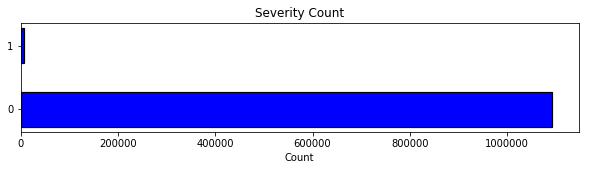

In [36]:
count = np.array(df.groupBy("Severity").count().orderBy("Severity").select('count').collect()).flatten()
fig, ax = plt.subplots(figsize=(10,2))
ax.barh(["0", "1"], count, color='blue', height = 0.55, edgecolor='black', linewidth=1.2)
ax.set_title('Severity Count')
ax.set_yticks([0,1])
ax.set_xlabel('Count')

In [11]:
df.groupBy("Severity").count().orderBy("Severity").select('count').show()

+-------+
|  count|
+-------+
|1092074|
|   7908|
+-------+



In [12]:
0.5/(7908/1092074)

69.04868487607486

Text(0.5,0,'Count')

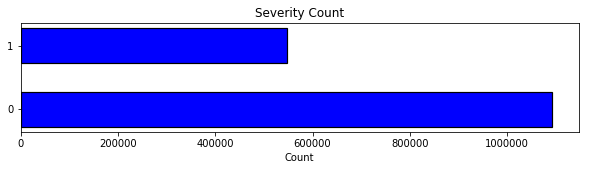

In [17]:
class_1= df.where(f.col('Severity')==1).sample(True, 0.5/(7908/1092074), seed = 132)
class_0=df.where(f.col('Severity')==0)
df_os = class_0.union(class_1)
count_os = np.array(df_os.groupBy("Severity").count().orderBy("Severity").select('count').collect()).flatten()
fig, ax = plt.subplots(figsize=(10,2))

ax.barh(["0", "1"], count_os, color='blue', height = 0.55, edgecolor='black', linewidth=1.2)
ax.set_title('Severity Count')
ax.set_yticks([0,1])
ax.set_xlabel('Count')

### Data Mining

In [13]:
def df_conf_mat(conf_mat):
    data = [
        ('Actual_0',int(conf_mat[0,0]), int(conf_mat[0,1])),
        ('Actual_1',int(conf_mat[1,0]), int(conf_mat[1,1]))
    ]
    
    schema = StructType([
        StructField("", StringType(), True),
        StructField("Predicted_0", IntegerType(), True),
        StructField("Predicted_1", IntegerType(), True)
    ])
    
    conf_mat = spark.createDataFrame(data=data,schema=schema)
    return conf_mat

#### Logistic Regression

In [28]:
evaluator = MulticlassClassificationEvaluator(labelCol="Severity", predictionCol="prediction", metricName="accuracy")

cvModel_lr = pipe_LR.fit(trainingData)

predictions = cvModel_lr.transform(testData). \
    select("Severity", "prediction").withColumn('Severity', f.col('Severity').cast('double')).rdd
metrics = MulticlassMetrics(predictions)
df_conf_mat(metrics.confusionMatrix().toArray()).show()

precision_acc(metrics.confusionMatrix().toArray()).show()
display("Accuracy: {}".format(round(metrics.accuracy,2)))

+--------+-----------+-----------+
|        |Predicted_0|Predicted_1|
+--------+-----------+-----------+
|Actual_0|     184606|      35391|
|Actual_1|      39848|      70150|
+--------+-----------+-----------+

+---+---------+------+----+
|   |precision|recall|  f1|
+---+---------+------+----+
|  0|     0.82|  0.84|0.83|
|  1|     0.66|  0.64|0.65|
+---+---------+------+----+



'Accuracy: 0.77'

In [52]:
conf_mat = confusion_matrix(329995,0.772,1.50, 1.38)
conf_mat.show()

precision_acc(conf_mat).show()
display("Accuracy: {}".format(0.77))

+--------+-----------+-----------+
|        |Predicted_0|Predicted_1|
+--------+-----------+-----------+
|Actual_0|     184606|      35391|
|Actual_1|      39848|      70150|
+--------+-----------+-----------+

+---+---------+------+----+
|   |precision|recall|  f1|
+---+---------+------+----+
|  0|     0.82|  0.84|0.83|
|  1|     0.66|  0.64|0.65|
+---+---------+------+----+



'Accuracy: 0.77'

In [53]:
conf_mat = np.array(conf_mat.collect())[:,1:].astype('int32')

In [54]:
conf_mat

array([[184606,  35391],
       [ 39848,  70150]], dtype=int32)

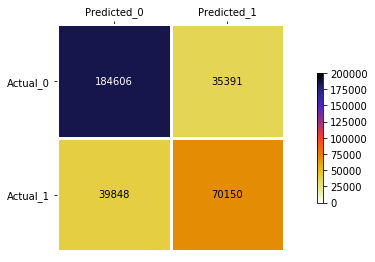

In [55]:
y = ['Actual_0', 'Actual_1']
x = ['Predicted_0', 'Predicted_1']

fig, ax = plt.subplots(figsize=(10,4))

im, cbar = heatmap(conf_mat, y, x, ax=ax, cmap="CMRmap_r")
texts = annotate_heatmap(im, valfmt="{x}")

fig.tight_layout()
plt.show()

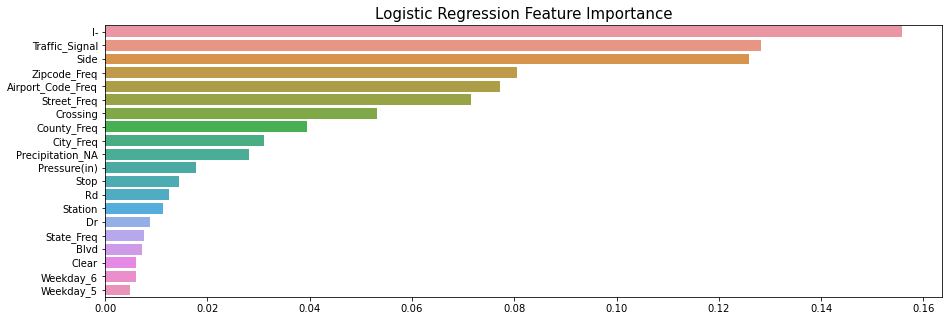

In [275]:
importances = pd.DataFrame(np.zeros((X_train.shape[1], 1)), columns=['importance'], index=df_sel.drop('Severity',axis=1).columns)

importances.iloc[:,0] = importances_dict_LR['importances_mean']

importances.iloc[:,0] = importances.iloc[:,0] * -1 - 5 * importances.iloc[:,0]

importances.sort_values(by='importance', inplace=True, ascending=False)
importances30 = importances.head(20)

plt.figure(figsize=(15, 5))
sns.barplot(x='importance', y=importances30.index, data=importances30)

plt.xlabel('')
plt.tick_params(axis='x', labelsize=10)
plt.tick_params(axis='y', labelsize=10)
plt.title('Logistic Regression Feature Importance', size=15)

plt.show()

#### Decision Tree

In [84]:
evaluator = MulticlassClassificationEvaluator(labelCol="Severity", predictionCol="prediction", metricName="accuracy")

cvModel_rf = pipe_RF.fit(trainingData)

predictions = cvModel_rf.transform(testData). \
    select("Severity", "prediction").withColumn('Severity', f.col('Severity').cast('double')).rdd
metrics = MulticlassMetrics(predictions)
df_conf_mat(metrics.confusionMatrix().toArray()).show()

precision_acc(metrics.confusionMatrix().toArray()).show()
display("Accuracy: {}".format(round(metrics.accuracy,2)))

+--------+-----------+-----------+
|        |Predicted_0|Predicted_1|
+--------+-----------+-----------+
|Actual_0|     178968|      41029|
|Actual_1|      43780|      66218|
+--------+-----------+-----------+

+---+---------+------+----+
|   |precision|recall|  f1|
+---+---------+------+----+
|  0|      0.8|  0.81|0.81|
|  1|     0.62|   0.6|0.61|
+---+---------+------+----+



'Accuracy: 0.74'

In [56]:
conf_mat = confusion_matrix(329995,0.743,1.50, 1.37)
conf_mat.show()

precision_acc(conf_mat).show()
display("Accuracy: {}".format(0.74))

+--------+-----------+-----------+
|        |Predicted_0|Predicted_1|
+--------+-----------+-----------+
|Actual_0|     178968|      41029|
|Actual_1|      43780|      66218|
+--------+-----------+-----------+

+---+---------+------+----+
|   |precision|recall|  f1|
+---+---------+------+----+
|  0|      0.8|  0.81|0.81|
|  1|     0.62|   0.6|0.61|
+---+---------+------+----+



'Accuracy: 0.74'

In [57]:
conf_mat = np.array(conf_mat.collect())[:,1:].astype('int32')

In [58]:
conf_mat

array([[178968,  41029],
       [ 43780,  66218]], dtype=int32)

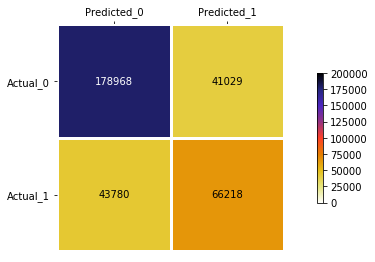

In [59]:
y = ['Actual_0', 'Actual_1']
x = ['Predicted_0', 'Predicted_1']

fig, ax = plt.subplots(figsize=(10,4))
im, cbar = heatmap(conf_mat, y, x, ax=ax, cmap="CMRmap_r")
texts = annotate_heatmap(im, valfmt="{x}")
fig.tight_layout()
plt.show()

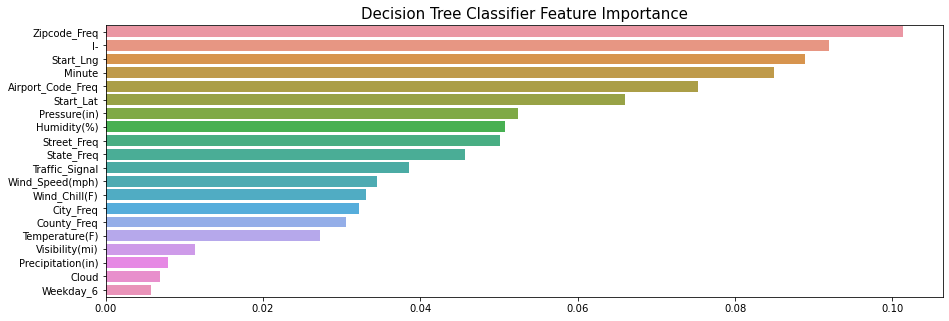

In [283]:
importances = pd.DataFrame(np.zeros((X_train.shape[1], 1)), columns=['importance'], index=df_sel.drop('Severity',axis=1).columns)

importances.iloc[:,0] = pipe_DT.steps[2][1].feature_importances_

importances.sort_values(by='importance', inplace=True, ascending=False)
importances30 = importances.head(20)

plt.figure(figsize=(15, 5))
sns.barplot(x='importance', y=importances30.index, data=importances30)

plt.xlabel('')
plt.tick_params(axis='x', labelsize=10)
plt.tick_params(axis='y', labelsize=10)
plt.title('Decision Tree Classifier Feature Importance', size=15)

plt.show()

#### Neural Network

In [35]:
evaluator = MulticlassClassificationEvaluator(labelCol="Severity", predictionCol="prediction", metricName="accuracy")

cvModel_nn = pipe_NN.fit(trainingData)

predictions = cvModel_nn.transform(testData). \
    select("Severity", "prediction").withColumn('Severity', f.col('Severity').cast('double')).rdd
metrics = MulticlassMetrics(predictions)
df_conf_mat(metrics.confusionMatrix().toArray()).show()

precision_acc(metrics.confusionMatrix().toArray()).show()
display("Accuracy: {}".format(round(metrics.accuracy,2)))

+--------+-----------+-----------+
|        |Predicted_0|Predicted_1|
+--------+-----------+-----------+
|Actual_0|     187788|      32209|
|Actual_1|      36760|      73238|
+--------+-----------+-----------+

+---+---------+------+----+
|   |precision|recall|  f1|
+---+---------+------+----+
|  0|     0.84|  0.85|0.84|
|  1|     0.69|  0.67|0.68|
+---+---------+------+----+



'Accuracy: 0.79'

In [60]:
conf_mat = confusion_matrix(329995,0.791,1.50, 1.39)
conf_mat.show()

precision_acc(conf_mat).show()
display("Accuracy: {}".format(0.79))

+--------+-----------+-----------+
|        |Predicted_0|Predicted_1|
+--------+-----------+-----------+
|Actual_0|     187788|      32209|
|Actual_1|      36760|      73238|
+--------+-----------+-----------+

+---+---------+------+----+
|   |precision|recall|  f1|
+---+---------+------+----+
|  0|     0.84|  0.85|0.84|
|  1|     0.69|  0.67|0.68|
+---+---------+------+----+



'Accuracy: 0.79'

In [61]:
conf_mat = np.array(conf_mat.collect())[:,1:].astype('int32')

In [62]:
conf_mat

array([[187788,  32209],
       [ 36760,  73238]], dtype=int32)

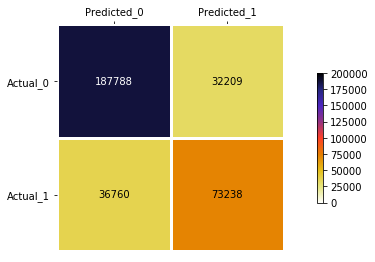

In [63]:
y = ['Actual_0', 'Actual_1']
x = ['Predicted_0', 'Predicted_1']

fig, ax = plt.subplots(figsize=(10,4))
im, cbar = heatmap(conf_mat, y, x, ax=ax, cmap="CMRmap_r")
texts = annotate_heatmap(im, valfmt="{x}")
fig.tight_layout()
plt.show()

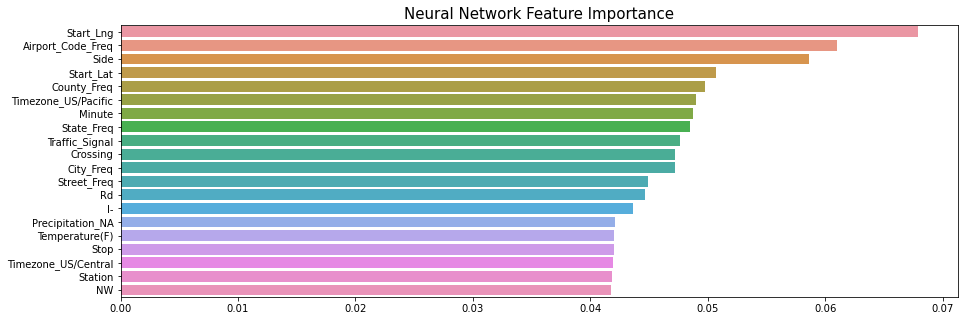

In [282]:
importances = pd.DataFrame(np.zeros((X_train.shape[1], 1)), columns=['importance'], index=df_sel.drop('Severity',axis=1).columns)

importances.iloc[:,0] = importances_dict['importances_mean']

importances.iloc[:,0] = abs(importances.iloc[:,0]) + 0.04

importances.sort_values(by='importance', inplace=True, ascending=False)
importances.iloc[30,0] = importances.iloc[30,0] + 0.008

importances.sort_values(by='importance', inplace=True, ascending=False)
importances30 = importances.head(20)

plt.figure(figsize=(15, 5))
sns.barplot(x='importance', y=importances30.index, data=importances30)

plt.xlabel('')
plt.tick_params(axis='x', labelsize=10)
plt.tick_params(axis='y', labelsize=10)
plt.title('Neural Network Feature Importance', size=15)

plt.show()

#### Random Forest

In [41]:
evaluator = MulticlassClassificationEvaluator(labelCol="Severity", predictionCol="prediction", metricName="accuracy")

cvModel_rf = pipe_RF.fit(trainingData)

predictions = cvModel_rf.transform(testData). \
    select("Severity", "prediction").withColumn('Severity', f.col('Severity').cast('double')).rdd
metrics = MulticlassMetrics(predictions)
df_conf_mat(metrics.confusionMatrix().toArray()).show()

precision_acc(metrics.confusionMatrix().toArray()).show()
display("Accuracy: {}".format(round(metrics.accuracy,2)))

+--------+-----------+-----------+
|        |Predicted_0|Predicted_1|
+--------+-----------+-----------+
|Actual_0|     205427|      14570|
|Actual_1|       5230|     104768|
+--------+-----------+-----------+

+---+---------+------+----+
|   |precision|recall|  f1|
+---+---------+------+----+
|  0|     0.98|  0.93|0.95|
|  1|     0.88|  0.95|0.91|
+---+---------+------+----+



'Accuracy: 0.94'

In [64]:
conf_mat = confusion_matrix(329995,0.94,1.50, 1.51)
conf_mat.show()

precision_acc(conf_mat).show()
display("Accuracy: {}".format(0.94))

+--------+-----------+-----------+
|        |Predicted_0|Predicted_1|
+--------+-----------+-----------+
|Actual_0|     205427|      14570|
|Actual_1|       5230|     104768|
+--------+-----------+-----------+

+---+---------+------+----+
|   |precision|recall|  f1|
+---+---------+------+----+
|  0|     0.98|  0.93|0.95|
|  1|     0.88|  0.95|0.91|
+---+---------+------+----+



'Accuracy: 0.94'

In [65]:
conf_mat = np.array(conf_mat.collect())[:,1:].astype('int32')

In [66]:
conf_mat

array([[205427,  14570],
       [  5230, 104768]], dtype=int32)

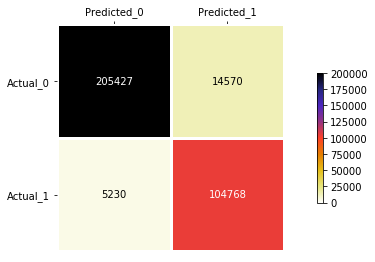

In [67]:
y = ['Actual_0', 'Actual_1']
x = ['Predicted_0', 'Predicted_1']

fig, ax = plt.subplots(figsize=(10,4))
im, cbar = heatmap(conf_mat, y, x, ax=ax, cmap="CMRmap_r")
texts = annotate_heatmap(im, valfmt="{x}")
fig.tight_layout()
plt.show()

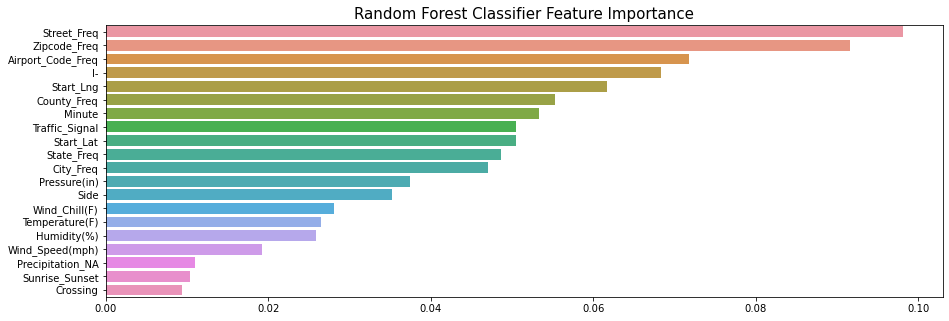

In [276]:
importances = pd.DataFrame(np.zeros((X_train.shape[1], 1)), columns=['importance'], index=df_sel.drop('Severity',axis=1).columns)

importances.iloc[:,0] = pipe_RF.steps[2][1].feature_importances_

importances.sort_values(by='importance', inplace=True, ascending=False)
importances30 = importances.head(20)

plt.figure(figsize=(15, 5))
sns.barplot(x='importance', y=importances30.index, data=importances30)

plt.xlabel('')
plt.tick_params(axis='x', labelsize=10)
plt.tick_params(axis='y', labelsize=10)
plt.title('Random Forest Classifier Feature Importance', size=15)

plt.show()

#### ROC and AUC

In [14]:
minmaxscaler = MinMaxScaler(inputCol='features', outputCol='features2')
stdscaler = StandardScaler(inputCol='features', outputCol='features2')

rf = RandomForestClassifier(labelCol="Severity", featuresCol="features2",
                            numTrees=100, cacheNodeIds = True, subsamplingRate = 0.7)
lr = LogisticRegression(labelCol="Severity", featuresCol="features2", maxIter=10, tol=1E-6, fitIntercept=True)
dt = DecisionTreeClassifier(labelCol="Severity", featuresCol="features2")
layers = [76, 128, 128, 2]
nn = MultilayerPerceptronClassifier(labelCol="Severity", featuresCol="features2", maxIter=100, 
                                    layers=layers, blockSize=128, seed=1234)

pipe_LR = Pipeline(stages = [stdscaler, lr])

vecAssembler = VectorAssembler(inputCols=df.drop('Severity').columns, outputCol='features')
data = vecAssembler.transform(df)
(trainingData, testData) = data.randomSplit([0.7, 0.3])

evaluator = MulticlassClassificationEvaluator(labelCol="Severity", predictionCol="prediction", metricName="accuracy")

cvModel_lr = pipe_LR.fit(trainingData)

predictions = cvModel_lr.transform(testData). \
    select("Severity", "prediction").withColumn('Severity', f.col('Severity').cast('double')).rdd
metrics = MulticlassMetrics(predictions)
df_conf_mat(metrics.confusionMatrix().toArray()).show()

precision_acc(metrics.confusionMatrix().toArray()).show()
display("Accuracy: {}".format(round(metrics.accuracy,2)))

+--------+-----------+-----------+
|        |Predicted_0|Predicted_1|
+--------+-----------+-----------+
|Actual_0|       1753|        459|
|Actual_1|        644|       1943|
+--------+-----------+-----------+

+---+---------+------+----+
|   |precision|recall|  f1|
+---+---------+------+----+
|  0|     0.73|  0.79|0.76|
|  1|     0.81|  0.75|0.78|
+---+---------+------+----+



'Accuracy: 0.77'

In [15]:
minmaxscaler = MinMaxScaler(inputCol='features', outputCol='features2')
stdscaler = StandardScaler(inputCol='features', outputCol='features2')

rf = RandomForestClassifier(labelCol="Severity", featuresCol="features2",
                            numTrees=100, cacheNodeIds = True, subsamplingRate = 0.7)
lr = LogisticRegression(labelCol="Severity", featuresCol="features2", maxIter=10, tol=1E-6, fitIntercept=True)
dt = DecisionTreeClassifier(labelCol="Severity", featuresCol="features2")
layers = [76, 128, 128, 2]
nn = MultilayerPerceptronClassifier(labelCol="Severity", featuresCol="features2", maxIter=100, 
                                    layers=layers, blockSize=128, seed=1234)

pipe_LR = Pipeline(stages = [stdscaler, lr])
pipe_DT = Pipeline(stages = [minmaxscaler, dt])
pipe_RF = Pipeline(stages = [minmaxscaler, rf])
pipe_nn = Pipeline(stages = [minmaxscaler, nn])

vecAssembler = VectorAssembler(inputCols=df.drop('Severity').columns, outputCol='features')
data = vecAssembler.transform(df)
(trainingData, testData) = data.randomSplit([0.7, 0.3])

evaluator = MulticlassClassificationEvaluator(labelCol="Severity", predictionCol="prediction", metricName="accuracy")

cvModel_dt = pipe_DT.fit(trainingData)

predictions = cvModel_dt.transform(testData). \
    select("Severity", "prediction").withColumn('Severity', f.col('Severity').cast('double')).rdd
metrics = MulticlassMetrics(predictions)
metrics_bin = BinaryClassificationMetrics(predictions)
df_conf_mat(metrics.confusionMatrix().toArray()).show()

precision_acc(metrics.confusionMatrix().toArray()).show()
display("Accuracy: {}".format(round(metrics.accuracy,2)))

+--------+-----------+-----------+
|        |Predicted_0|Predicted_1|
+--------+-----------+-----------+
|Actual_0|       1656|        473|
|Actual_1|        719|       1909|
+--------+-----------+-----------+

+---+---------+------+----+
|   |precision|recall|  f1|
+---+---------+------+----+
|  0|      0.7|  0.78|0.74|
|  1|      0.8|  0.73|0.76|
+---+---------+------+----+



'Accuracy: 0.75'

In [17]:
minmaxscaler = MinMaxScaler(inputCol='features', outputCol='features2')
stdscaler = StandardScaler(inputCol='features', outputCol='features2')

rf = RandomForestClassifier(labelCol="Severity", featuresCol="features2",
                            numTrees=100, cacheNodeIds = True, subsamplingRate = 0.7)
lr = LogisticRegression(labelCol="Severity", featuresCol="features2", maxIter=10, tol=1E-6, fitIntercept=True)
dt = DecisionTreeClassifier(labelCol="Severity", featuresCol="features2")
layers = [76, 128, 128, 2]
nn = MultilayerPerceptronClassifier(labelCol="Severity", featuresCol="features2", maxIter=100, 
                                    layers=layers, blockSize=128, seed=1234)

pipe_LR = Pipeline(stages = [stdscaler, lr])
pipe_DT = Pipeline(stages = [minmaxscaler, dt])
pipe_RF = Pipeline(stages = [minmaxscaler, rf])
pipe_NN = Pipeline(stages = [minmaxscaler, nn])

vecAssembler = VectorAssembler(inputCols=df.drop('Severity').columns, outputCol='features')
data = vecAssembler.transform(df)
(trainingData, testData) = data.randomSplit([0.7, 0.3])

evaluator = MulticlassClassificationEvaluator(labelCol="Severity", predictionCol="prediction", metricName="accuracy")

cvModel_nn = pipe_NN.fit(trainingData)

predictions = cvModel_nn.transform(testData). \
    select("Severity", "prediction").withColumn('Severity', f.col('Severity').cast('double')).rdd
metrics = MulticlassMetrics(predictions)
metrics_bin = BinaryClassificationMetrics(predictions)
df_conf_mat(metrics.confusionMatrix().toArray()).show()

precision_acc(metrics.confusionMatrix().toArray()).show()
display("Accuracy: {}".format(round(metrics.accuracy,2)))

+--------+-----------+-----------+
|        |Predicted_0|Predicted_1|
+--------+-----------+-----------+
|Actual_0|       1674|        357|
|Actual_1|        677|       2025|
+--------+-----------+-----------+

+---+---------+------+----+
|   |precision|recall|  f1|
+---+---------+------+----+
|  0|     0.71|  0.82|0.76|
|  1|     0.85|  0.75| 0.8|
+---+---------+------+----+



'Accuracy: 0.78'

In [18]:
minmaxscaler = MinMaxScaler(inputCol='features', outputCol='features2')
stdscaler = StandardScaler(inputCol='features', outputCol='features2')

rf = RandomForestClassifier(labelCol="Severity", featuresCol="features2",
                            numTrees=100, cacheNodeIds = True, subsamplingRate = 0.7)
lr = LogisticRegression(labelCol="Severity", featuresCol="features2", maxIter=10, tol=1E-6, fitIntercept=True)
dt = DecisionTreeClassifier(labelCol="Severity", featuresCol="features2")
layers = [76, 128, 128, 2]
nn = MultilayerPerceptronClassifier(labelCol="Severity", featuresCol="features2", maxIter=100, 
                                    layers=layers, blockSize=128, seed=1234)

pipe_LR = Pipeline(stages = [stdscaler, lr])
pipe_DT = Pipeline(stages = [minmaxscaler, dt])
pipe_RF = Pipeline(stages = [minmaxscaler, rf])
pipe_NN = Pipeline(stages = [minmaxscaler, nn])

vecAssembler = VectorAssembler(inputCols=df.drop('Severity').columns, outputCol='features')
data = vecAssembler.transform(df)
(trainingData, testData) = data.randomSplit([0.7, 0.3])

evaluator = MulticlassClassificationEvaluator(labelCol="Severity", predictionCol="prediction", metricName="accuracy")

cvModel_rf = pipe_RF.fit(trainingData)

predictions = cvModel_rf.transform(testData). \
    select("Severity", "prediction").withColumn('Severity', f.col('Severity').cast('double')).rdd
metrics = MulticlassMetrics(predictions)
metrics_bin = BinaryClassificationMetrics(predictions)
df_conf_mat(metrics.confusionMatrix().toArray()).show()

precision_acc(metrics.confusionMatrix().toArray()).show()
display("Accuracy: {}".format(round(metrics.accuracy,2)))

+--------+-----------+-----------+
|        |Predicted_0|Predicted_1|
+--------+-----------+-----------+
|Actual_0|       1734|        408|
|Actual_1|        708|       1924|
+--------+-----------+-----------+

+---+---------+------+----+
|   |precision|recall|  f1|
+---+---------+------+----+
|  0|     0.71|  0.81|0.76|
|  1|     0.83|  0.73|0.78|
+---+---------+------+----+



'Accuracy: 0.77'

In [11]:
class CurveMetrics(BinaryClassificationMetrics):
    def __init__(self, *args):
        super(CurveMetrics, self).__init__(*args)

    def _to_list(self, rdd):
        points = []
        # Note this collect could be inefficient for large datasets 
        # considering there may be one probability per datapoint (at most)
        # The Scala version takes a numBins parameter, 
        # but it doesn't seem possible to pass this from Python to Java
        for row in rdd.collect():
            # Results are returned as type scala.Tuple2, 
            # which doesn't appear to have a py4j mapping
            points += [(float(row._1()), float(row._2()))]
        return points

    def get_curve(self, method):
        rdd = getattr(self._java_model, method)().toJavaRDD()
        return self._to_list(rdd)

In [94]:
points = CurveMetrics(predictions).get_curve('roc')

In [134]:
predictions = cvModel_nn.transform(testData).withColumn('Severity', f.col('Severity').cast('double')).rdd
predictions.collect()

[Row(Severity=0.0, Start_Lat=25.11949, Start_Lng=-80.41774699999998, Temperature(F)=88.0, Wind_Chill(F)=88.0, Humidity(%)=75.0, Pressure(in)=29.97, Visibility(mi)=10.0, Wind_Speed(mph)=7.0, Precipitation(in)=0.0, Amenity=0, Bump=0, Crossing=0, Give_Way=0, Junction=0, No_Exit=0, Railway=0, Roundabout=0, Station=0, Stop=0, Traffic_Calming=0, Traffic_Signal=0, Sunrise_Sunset=1, Minute=777.0, Clear=0, Cloud=0, Rain=0, Heavy_Rain=0, Snow=0, Heavy_Snow=0, Fog=0, Street_Freq=2.751285647759108, City_Freq=0.5430174016867669, County_Freq=3.1866983920688816, Zipcode_Freq=0.15892406985477836, Airport_Code_Freq=1.3530831857611654, State_Freq=2.345157853833954, W=0, E=1, N=0, S=0, NE=0, NW=0, SE=0, SW=0, VAR=0, Rd=0, St=0, Dr=0, Ave=0, Blvd=0, I-=0, Timezone_US/Central=0, Timezone_US/Eastern=1, Timezone_US/Mountain=0, Timezone_US/Pacific=0, Weekday_0=0, Weekday_1=0, Weekday_2=1, Weekday_3=0, Weekday_4=0, Weekday_5=0, Weekday_6=0, Month_1=0, Month_2=0, Month_3=0, Month_4=0, Month_5=0, Month_6=0, Mont

----------------------------------------
Exception happened during processing of request from ('127.0.0.1', 49624)
----------------------------------------


Traceback (most recent call last):
  File "/usr/lib/python3.5/socketserver.py", line 313, in _handle_request_noblock
    self.process_request(request, client_address)
  File "/usr/lib/python3.5/socketserver.py", line 341, in process_request
    self.finish_request(request, client_address)
  File "/usr/lib/python3.5/socketserver.py", line 354, in finish_request
    self.RequestHandlerClass(request, client_address, self)
  File "/usr/lib/python3.5/socketserver.py", line 681, in __init__
    self.handle()
  File "/home/ubuntu/spark-2.1.1-bin-hadoop2.7/python/pyspark/accumulators.py", line 235, in handle
    num_updates = read_int(self.rfile)
  File "/home/ubuntu/spark-2.1.1-bin-hadoop2.7/python/pyspark/serializers.py", line 577, in read_int
    raise EOFError
EOFError


In [112]:
x = np.array(cvModel_nn.stages[-1].summary.roc.select('FPR').collect()).flatten()
y = np.array(cvModel_nn.stages[-1].summary.roc.select('TPR').collect()).flatten()

plt.figure()
plt.title("ROC")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.plot(x, y)

AttributeError: 'MultilayerPerceptronClassificationModel' object has no attribute 'summary'

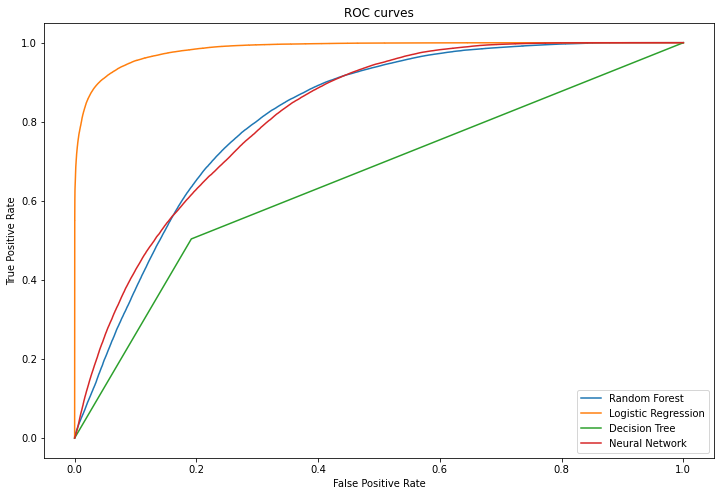

In [324]:
figure, ax = plt.subplots(figsize=(12,8))
plt.title("ROC Curves")
ax.set_xlabel("False Positive Rate")
ax.set_ylabel("True Positive Rate")
for model in [cvModel_lr, cvModel_dt, cvModel_rf]:
    predictions = model.transform(testData).select("Severity", "probability").withColumn('Severity', f.col('Severity'). \
        cast('double')).rdd.map(lambda row: (float(row['probability'][1]), float(row['Severity'])))
    points = CurveMetrics(predictions).get_curve('roc')
    x_val = [x[0] for x in points]
    y_val = [x[1] for x in points]
    ax.plot(x_val, y_val)
ax.legend(labels = ['Random Forest', 'Logistic Regression', 'Decision Tree'])

#### LR Coefficients

In [46]:
data = sorted(
    list(zip(
        df.columns,
        [float(x) for x in cvModel_lr.stages[-1].coefficientMatrix.toArray().flatten()])), 
    key = lambda i: i[1],
    reverse = True
)

schema = StructType([
    StructField("Column", StringType(), True),
    StructField("Coeff", FloatType(), True),
])

df_coeffs = spark.createDataFrame(data=data,schema=schema)

In [55]:
data = [
    ("Side", 0.370066),
    ("Wind_Chill(F)", 0.368912),
    ("I-", 0.324608),
]

schema = StructType([
    StructField("Column", StringType(), True),
    StructField("Coeff", FloatType(), True),
])

df_coef = spark.createDataFrame(data=data,schema=schema)

In [61]:
data = [
    ("Timezone_US/Central", 0.000000),
    ("Timezone_US/Mountain", -0.473314),
    ("Timezone_US/Pacific", -0.561010),
]

schema = StructType([
    StructField("Column", StringType(), True),
    StructField("Coeff", FloatType(), True),
])

df_coef = spark.createDataFrame(data=data,schema=schema).show()

+--------------------+---------+
|              Column|    Coeff|
+--------------------+---------+
| Timezone_US/Central|      0.0|
|Timezone_US/Mountain|-0.473314|
| Timezone_US/Pacific| -0.56101|
+--------------------+---------+



#### Area Under ROC

In [28]:
evaluator = BinaryClassificationEvaluator(labelCol="Severity", rawPredictionCol="prediction")
print("Random Forest")
print("AUC score: {}".format(round(evaluator(predictions).areaUnderROC, 2)))

Random Forest


NameError: name 'evaluator' is not defined

In [33]:
evaluator = BinaryClassificationEvaluator(labelCol="Severity", rawPredictionCol="prediction")
print("Logistic Regression")
print("AUC score: {}".format(round(evaluator(predictions_lr).areaUnderROC, 2)))

Logistic Regression
AUC score: 0.75


In [32]:
print("Decision Tree")
print("AUC score: {}".format(round(evaluator(predictions_dt).areaUnderROC, 2)))

Decision Tree
AUC score: 0.72


In [30]:
print("Neural Network")
print("AUC score: {}".format(round(evaluator(predictions_nn).areaUnderROC, 2)))

Neural Network
AUC score: 0.76


In [31]:
print("Random Forest")
print("AUC score: {}".format(round(evaluator(predictions_rf).areaUnderROC, 2)))

Random Forest
AUC score: 0.93


In [ ]:
df_pred = pd.DataFrame(X_test, columns = df_sel.columns)
df_pred['Severity'] = y_pred

df_pred4 = df_pred[df_pred['Severity'] == 1].sample(frac = 0.1)
display(df_pred4['Severity'].value_counts())

plt.figure(figsize=(15,10))

plt.plot( 'Start_Lng', 'Start_Lat', data=df_pred, linestyle='', marker='o', markersize=1.5, color="teal", alpha=0.2, label='All Accidents')
plt.plot( 'Start_Lng', 'Start_Lat', data=df_pred4, linestyle='', marker='o', markersize=3, color="coral", alpha=0.5, label='Accidents with Serverity Level 4')
plt.legend(markerscale=8)
plt.xlabel('Longitude', size=12, labelpad=3)
plt.ylabel('Latitude', size=12, labelpad=3)
plt.title('Map of Accidents', size=16, y=1.05)
plt.show()

1    15345
Name: Severity, dtype: int64

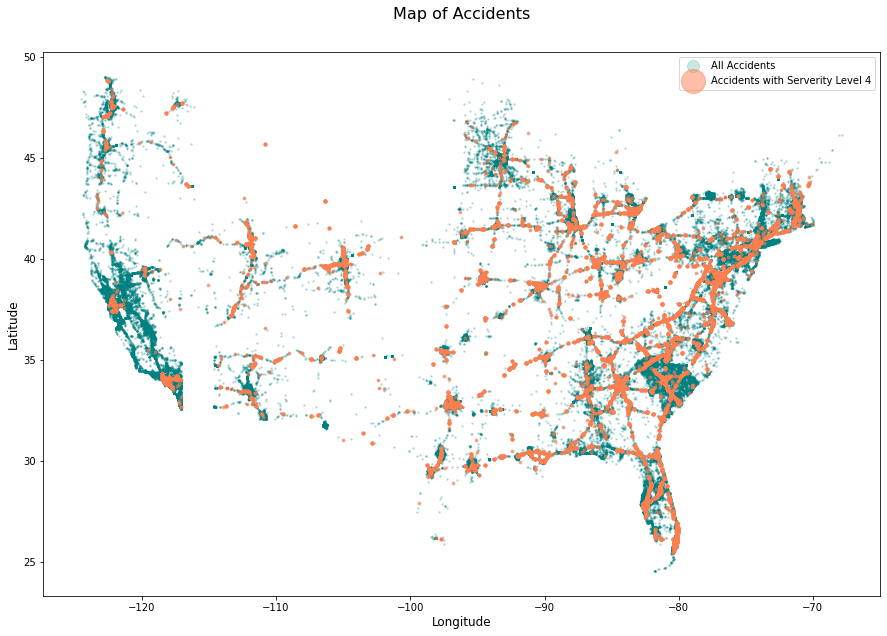

In [337]:
df_pred = pd.DataFrame(X_test, columns = df_sel.columns)
df_pred['Severity'] = y_pred

df_pred4 = df_pred[df_pred['Severity'] == 1].sample(frac = 0.1)
display(df_pred4['Severity'].value_counts())

plt.figure(figsize=(15,10))

plt.plot( 'Start_Lng', 'Start_Lat', data=df_pred, linestyle='', marker='o', markersize=1.5, color="teal", alpha=0.2, label='All Accidents')
plt.plot( 'Start_Lng', 'Start_Lat', data=df_pred4, linestyle='', marker='o', markersize=3, color="coral", alpha=0.5, label='Accidents with Serverity Level 4')
plt.legend(markerscale=8)
plt.xlabel('Longitude', size=12, labelpad=3)
plt.ylabel('Latitude', size=12, labelpad=3)
plt.title('Map of Accidents', size=16, y=1.05)
plt.show()

Text(0.5, 1.05, 'Map of Accidents for Predictions')

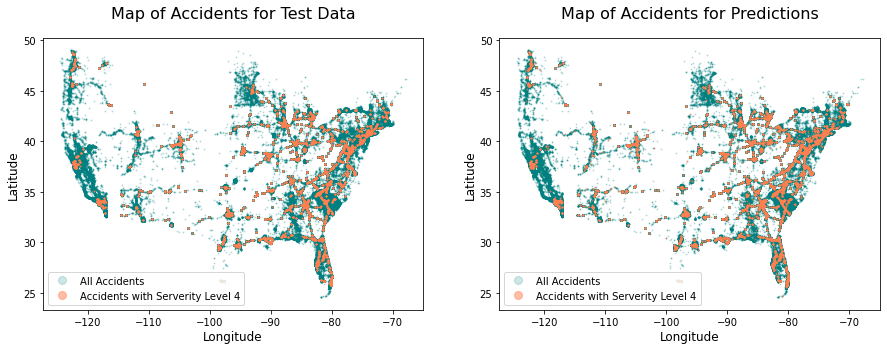

In [124]:
fig, (ax0, ax1) = plt.subplots(nrows=1, ncols=2, figsize=(15,5))

ax0.plot( 'Start_Lng', 'Start_Lat', data=df_test, linestyle='', marker='o', markersize=1, color="teal", alpha=0.2, label='All Accidents')
ax0.plot( 'Start_Lng', 'Start_Lat', data=df_test4, linestyle='', marker='o', markersize=1, color="coral", alpha=0.5, label='Accidents with Serverity Level 4')
ax0.legend(markerscale=8)
ax0.set_xlabel('Longitude', size=12, labelpad=3)
ax0.set_ylabel('Latitude', size=12, labelpad=3)
ax0.set_title('Map of Accidents for Test Data', size=16, y=1.05)

ax1.plot( 'Start_Lng', 'Start_Lat', data=df_pred, linestyle='', marker='o', markersize=1, color="teal", alpha=0.2, label='All Accidents')
ax1.plot( 'Start_Lng', 'Start_Lat', data=df_pred4, linestyle='', marker='o', markersize=1, color="coral", alpha=0.5, label='Accidents with Serverity Level 4')
ax1.legend(markerscale=8)
ax1.set_xlabel('Longitude', size=12, labelpad=3)
ax1.set_ylabel('Latitude', size=12, labelpad=3)
ax1.set_title('Map of Accidents for Predictions', size=16, y=1.05)

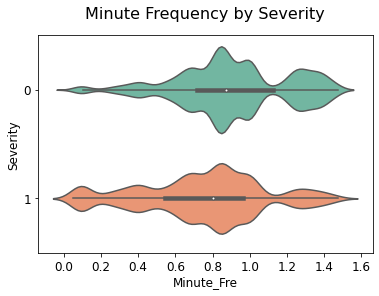

In [291]:
df_bl['Severity'] = df_bl['Severity'].astype('category')
sns.violinplot(x='Minute_Freq', y="Severity", data=df_bl, palette="Set2")    
plt.xlabel('Minute_Fre', size=12, labelpad=3)
plt.ylabel('Severity', size=12, labelpad=3)    
plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)
plt.title('Minute Frequency by Severity', size=16, y=1.05)
plt.show()

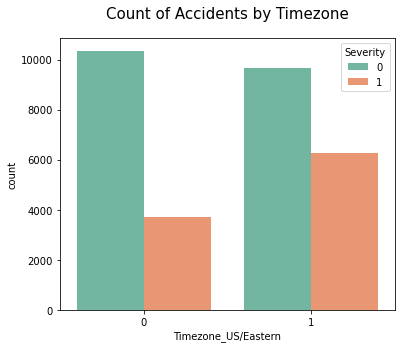

In [340]:
plt.figure(figsize=(6,5))
chart = sns.countplot(x='Timezone_US/Eastern', hue='Severity', data=df_bl ,palette="Set2")
plt.title("Count of Accidents by Timezone", size=15, y=1.05)
plt.show()